# Preprocessing of the Microbiome Data with Analysis

## Python Modules and Libraries

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from sklearn.model_selection import train_test_split

from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, classification_report, RocCurveDisplay, PrecisionRecallDisplay
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC


In [2]:
#merged_df = pd.read_table('/Users/naifganadily/Desktop/Artificial Intelligence for Precision Nutrition Bootcamp/gut-microbiome-precision-nutrition/data/results/merged.hmp.h1.truth.cleaned.txt', index_col=0)
merged_df = pd.read_table('merged.hmp.h1.truth.cleaned.txt', index_col=0)

In [3]:
# Add the columns to a list to be easily integrated
encoding_columns = ['Sex', 'Class', 'Race', 'IR_IS']
func_encoder = OneHotEncoder(sparse=False, drop='first')
encoded_columns = func_encoder.fit_transform(merged_df[encoding_columns])
encoded_columns = pd.DataFrame(encoded_columns, columns=func_encoder.get_feature_names_out(encoding_columns))

merged_df = merged_df.drop(columns=encoding_columns)
df_onehot = pd.concat([merged_df.reset_index(drop=True), encoded_columns.reset_index(drop=True)], axis=1)

display(df_onehot)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,Age,BMI,SSPG,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,class_Betaproteobacteria,class_Clostridia,class_Deltaproteobacteria,class_Erysipelotrichia,class_Gammaproteobacteria,class_Negativicutes,class_Verrucomicrobiae,class_unclassified_Bacteria,class_unclassified_Firmicutes,order_Bacteroidales,order_Burkholderiales,order_Clostridiales,order_Coriobacteriales,order_Desulfovibrionales,order_Enterobacteriales,order_Erysipelotrichales,order_Lactobacillales,order_Selenomonadales,order_Verrucomicrobiales,order_unclassified_Bacteria,order_unclassified_Firmicutes,family_Acidaminococcaceae,family_Bacteroidaceae,family_Clostridiaceae.1,family_Clostridiales_Incertae.Sedis.XIII,family_Coriobacteriaceae,family_Desulfovibrionaceae,family_Enterobacteriaceae,family_Erysipelotrichaceae,family_Lachnospiraceae,family_Peptostreptococcaceae,family_Porphyromonadaceae,family_Prevotellaceae,family_Rikenellaceae,family_Ruminococcaceae,family_Streptococcaceae,family_Sutterellaceae,family_Veillonellaceae,family_Verrucomicrobiaceae,family_unclassified_Bacteria,family_unclassified_Clostridiales,family_unclassified_Firmicutes,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,genus_Clostridium.IV,genus_Clostridium.XI,genus_Clostridium.XVIII,genus_Clostridium.XlVa,genus_Clostridium.XlVb,genus_Clostridium.sensu.stricto,genus_Collinsella,genus_Coprococcus,genus_Dorea,genus_Eggerthella,genus_Erysipelotrichaceae_incertae_sedis,genus_Faecalibacterium,genus_Flavonifractor,genus_Holdemania,genus_Lachnospiracea_incertae_sedis,genus_Odoribacter,genus_Oscillibacter,genus_Parabacteroides,genus_Parasutterella,genus_Phascolarctobacterium,genus_Prevotella,genus_Pseudoflavonifractor,genus_Roseburia,genus_Ruminococcus,genus_Streptococcus,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,Sex_M,Class_Crossover,Class_Diabetic,Class_Prediabetic,Race_B,Race_C,Race_H,IR_IS_IS
0,58.65,31.24,162.00,0.013645,0.582611,0.298357,0.104188,0.000128,0.000663,0.013645,0.000969,0.582611,0.044149,0.270736,0.013518,0.010253,0.000765,0.016374,0.000128,0.000663,0.000025,0.582611,0.044149,0.270736,0.012829,0.013518,0.000765,0.010253,0.000408,0.016374,0.000128,0.000663,0.000025,0.016272,0.535579,0.002117,0.000663,0.012829,0.013518,0.000765,0.010253,0.114058,0.000434,0.033514,0.000025,0.013492,0.149485,0.000383,0.044149,0.000102,0.000128,0.000663,0.003902,0.000025,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,0.000204,0.000434,0.000663,0.003877,0.002219,0.002117,0.000077,0.002755,0.010176,0.003061,0.000510,0.119516,0.004948,0.000179,0.044532,0.002857,0.008417,0.026933,0.044149,0.016272,0.000000,0.000459,0.000025,0.000153,0.000383,0.000102,0.000663,0.003902,0.000408,0.008952,0.008697,0.000025,0.030657,0.003698,0.013798,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,49.69,28.24,75.00,0.002822,0.260515,0.663827,0.008572,0.000106,0.063997,0.002822,0.000000,0.260515,0.008359,0.651954,0.000160,0.006868,0.000053,0.002289,0.000106,0.063997,0.002715,0.260515,0.008306,0.651901,0.002715,0.000160,0.000053,0.006868,0.000000,0.002289,0.000106,0.063997,0.002715,0.000692,0.090406,0.000000,0.000532,0.002715,0.000160,0.000053,0.006868,0.108615,0.001757,0.032318,0.005005,0.123416,0.212863,0.000000,0.007986,0.001597,0.000106,0.063997,0.320786,0.002715,0.000106,0.123416,0.000426,0.000213,0.090406,0.000000,0.000053,0.005218,0.002183,0.002715,0.001065,0.001757,0.000053,0.000799,0.000639,0.000000,0.001917,0.002662,0.001810,0.000266,

## Taxonomy

In [4]:
df = df_onehot

In [5]:
df.head()

,Age,BMI,SSPG,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,class_Betaproteobacteria,class_Clostridia,class_Deltaproteobacteria,class_Erysipelotrichia,class_Gammaproteobacteria,class_Negativicutes,class_Verrucomicrobiae,class_unclassified_Bacteria,class_unclassified_Firmicutes,order_Bacteroidales,order_Burkholderiales,order_Clostridiales,order_Coriobacteriales,order_Desulfovibrionales,order_Enterobacteriales,order_Erysipelotrichales,order_Lactobacillales,order_Selenomonadales,order_Verrucomicrobiales,order_unclassified_Bacteria,order_unclassified_Firmicutes,family_Acidaminococcaceae,family_Bacteroidaceae,family_Clostridiaceae.1,family_Clostridiales_Incertae.Sedis.XIII,family_Coriobacteriaceae,family_Desulfovibrionaceae,family_Enterobacteriaceae,family_Erysipelotrichaceae,family_Lachnospiraceae,family_Peptostreptococcaceae,family_Porphyromonadaceae,family_Prevotellaceae,family_Rikenellaceae,family_Ruminococcaceae,family_Streptococcaceae,family_Sutterellaceae,family_Veillonellaceae,family_Verrucomicrobiaceae,family_unclassified_Bacteria,family_unclassified_Clostridiales,family_unclassified_Firmicutes,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,genus_Clostridium.IV,genus_Clostridium.XI,genus_Clostridium.XVIII,genus_Clostridium.XlVa,genus_Clostridium.XlVb,genus_Clostridium.sensu.stricto,genus_Collinsella,genus_Coprococcus,genus_Dorea,genus_Eggerthella,genus_Erysipelotrichaceae_incertae_sedis,genus_Faecalibacterium,genus_Flavonifractor,genus_Holdemania,genus_Lachnospiracea_incertae_sedis,genus_Odoribacter,genus_Oscillibacter,genus_Parabacteroides,genus_Parasutterella,genus_Phascolarctobacterium,genus_Prevotella,genus_Pseudoflavonifractor,genus_Roseburia,genus_Ruminococcus,genus_Streptococcus,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,Sex_M,Class_Crossover,Class_Diabetic,Class_Prediabetic,Race_B,Race_C,Race_H,IR_IS_IS
0,58.65,31.24,162.0,0.013645,0.582611,0.298357,0.104188,0.000128,0.000663,0.013645,0.000969,0.582611,0.044149,0.270736,0.013518,0.010253,0.000765,0.016374,0.000128,0.000663,0.000025,0.582611,0.044149,0.270736,0.012829,0.013518,0.000765,0.010253,0.000408,0.016374,0.000128,0.000663,0.000025,0.016272,0.535579,0.002117,0.000663,0.012829,0.013518,0.000765,0.010253,0.114058,0.000434,0.033514,0.000025,0.013492,0.149485,0.000383,0.044149,0.000102,0.000128,0.000663,0.003902,0.000025,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,0.000204,0.000434,0.000663,0.003877,0.002219,0.002117,0.000077,0.002755,0.010176,0.003061,0.000510,0.119516,0.004948,0.000179,0.044532,0.002857,0.008417,0.026933,0.044149,0.016272,0.000000,0.000459,0.000025,0.000153,0.000383,0.000102,0.000663,0.003902,0.000408,0.008952,0.008697,0.000025,0.030657,0.003698,0.013798,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,49.69,28.24,75.0,0.002822,0.260515,0.663827,0.008572,0.000106,0.063997,0.002822,0.000000,0.260515,0.008359,0.651954,0.000160,0.006868,0.000053,0.002289,0.000106,0.063997,0.002715,0.260515,0.008306,0.651901,0.002715,0.000160,0.000053,0.006868,0.000000,0.002289,0.000106,0.063997,0.002715,0.000692,0.090406,0.000000,0.000532,0.002715,0.000160,0.000053,0.006868,0.108615,0.001757,0.032318,0.005005,0.123416,0.212863,0.000000,0.007986,0.001597,0.000106,0.063997,0.320786,0.002715,0.000106,0.123416,0.000426,0.000213,0.090406,0.000000,0.000053,0.005218,0.002183,0.002715,0.001065,0.001757,0.000053,0.000799,0.000639,0.000000,0.001917,0.002662,0.001810,0.000266,0.

In [6]:
%pip install anytree

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.2 MB/s eta 0:00:00


In [7]:
from anytree import Node, RenderTree

# Define Phyla
phylum_Actinobacteria = Node("phylum_Actinobacteria")
phylum_Bacteroidetes = Node("phylum_Bacteroidetes")
phylum_Firmicutes = Node("phylum_Firmicutes")
phylum_Proteobacteria = Node("phylum_Proteobacteria")
phylum_Verrucomicrobia = Node("phylum_Verrucomicrobia")
phylum_unclassified_Bacteria = Node("phylum_unclassified_Bacteria")

# Define Classes under Phyla
class_Actinobacteria = Node("class_Actinobacteria", parent=phylum_Actinobacteria)
class_Bacilli = Node("class_Bacilli", parent=phylum_Firmicutes)
class_Bacteroidia = Node("class_Bacteroidia", parent=phylum_Bacteroidetes)
class_Clostridia = Node("class_Clostridia", parent=phylum_Firmicutes)
class_Betaproteobacteria = Node("class_Betaproteobacteria", parent=phylum_Proteobacteria)
class_Gammaproteobacteria = Node("class_Gammaproteobacteria", parent=phylum_Proteobacteria)
class_Verrucomicrobiae = Node("class_Verrucomicrobiae", parent=phylum_Verrucomicrobia)

# Define Orders under Classes
order_Coriobacteriales = Node("order_Coriobacteriales", parent=class_Actinobacteria)
order_Clostridiales = Node("order_Clostridiales", parent=class_Clostridia)
order_Lactobacillales = Node("order_Lactobacillales", parent=class_Bacilli)
order_Bacteroidales = Node("order_Bacteroidales", parent=class_Bacteroidia)
order_Burkholderiales = Node("order_Burkholderiales", parent=class_Betaproteobacteria)
order_Enterobacteriales = Node("order_Enterobacteriales", parent=class_Gammaproteobacteria)
order_Verrucomicrobiales = Node("order_Verrucomicrobiales", parent=class_Verrucomicrobiae)

# Define Families under Orders
family_Coriobacteriaceae = Node("family_Coriobacteriaceae", parent=order_Coriobacteriales)
family_Clostridiaceae = Node("family_Clostridiaceae", parent=order_Clostridiales)
family_Lachnospiraceae = Node("family_Lachnospiraceae", parent=order_Clostridiales)
family_Bacteroidaceae = Node("family_Bacteroidaceae", parent=order_Bacteroidales)
family_Enterobacteriaceae = Node("family_Enterobacteriaceae", parent=order_Enterobacteriales)
family_Verrucomicrobiaceae = Node("family_Verrucomicrobiaceae", parent=order_Verrucomicrobiales)

# Define Genera under Families
genus_Collinsella = Node("genus_Collinsella", parent=family_Coriobacteriaceae)
genus_Clostridium = Node("genus_Clostridium", parent=family_Clostridiaceae)
genus_Roseburia = Node("genus_Roseburia", parent=family_Lachnospiraceae)
genus_Bacteroides = Node("genus_Bacteroides", parent=family_Bacteroidaceae)
genus_Escherichia = Node("genus_Escherichia", parent=family_Enterobacteriaceae)
genus_Akkermansia = Node("genus_Akkermansia", parent=family_Verrucomicrobiaceae)


In [8]:
# Render the tree
for pre, fill, node in RenderTree(phylum_Actinobacteria):
    print(f"{pre}{node.name}")

for pre, fill, node in RenderTree(phylum_Bacteroidetes):
    print(f"{pre}{node.name}")

for pre, fill, node in RenderTree(phylum_Firmicutes):
    print(f"{pre}{node.name}")

for pre, fill, node in RenderTree(phylum_Proteobacteria):
    print(f"{pre}{node.name}")

for pre, fill, node in RenderTree(phylum_Verrucomicrobia):
    print(f"{pre}{node.name}")

for pre, fill, node in RenderTree(phylum_unclassified_Bacteria):
    print(f"{pre}{node.name}")

phylum_Actinobacteria
└── class_Actinobacteria
    └── order_Coriobacteriales
        └── family_Coriobacteriaceae
            └── genus_Collinsella
phylum_Bacteroidetes
└── class_Bacteroidia
    └── order_Bacteroidales
        └── family_Bacteroidaceae
            └── genus_Bacteroides
phylum_Firmicutes
├── class_Bacilli
│   └── order_Lactobacillales
└── class_Clostridia
    └── order_Clostridiales
        ├── family_Clostridiaceae
        │   └── genus_Clostridium
        └── family_Lachnospiraceae
            └── genus_Roseburia
phylum_Proteobacteria
├── class_Betaproteobacteria
│   └── order_Burkholderiales
└── class_Gammaproteobacteria
    └── order_Enterobacteriales
        └── family_Enterobacteriaceae
            └── genus_Escherichia
phylum_Verrucomicrobia
└── class_Verrucomicrobiae
    └── order_Verrucomicrobiales
        └── family_Verrucomicrobiaceae
            └── genus_Akkermansia
phylum_unclassified_Bacteria


In [9]:
# split the taxonomy data
# df_phylum
phylum_columns = df.filter(like='phylum').columns
df_phylum = df[phylum_columns]

In [10]:
display(phylum_columns)

Index(['phylum_Actinobacteria', 'phylum_Bacteroidetes', 'phylum_Firmicutes',
       'phylum_Proteobacteria', 'phylum_Verrucomicrobia',
       'phylum_unclassified_Bacteria'],
      dtype='object')

In [11]:
# 0 for IR and 1 for IS
# Mean relative abundance for each group (IR and IS)
phylum_columns = df.filter(like='phylum').columns
df_mean = df.groupby('IR_IS_IS')[phylum_columns].mean()
df_mean = df_mean.T
df_mean = df_mean.loc[df_mean.sum(axis=1).sort_values(ascending=False).index]
df_mean.columns = ['Insulin Resistant', 'Insulin Sensitive']


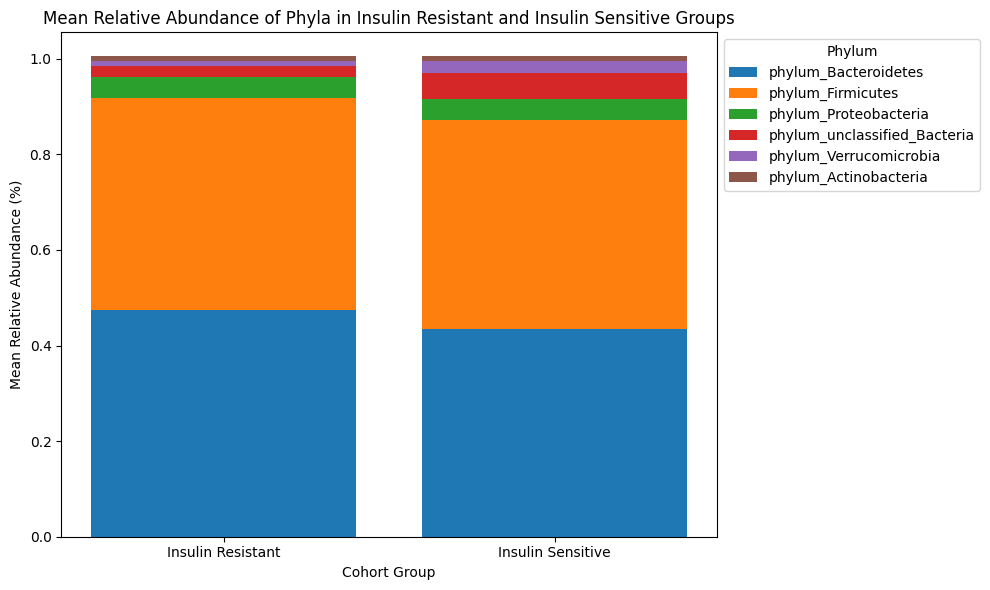

In [12]:
# pseudo-count to handle zeros
pseudo_count = 0.001
df_mean += pseudo_count

df_mean = df_mean.loc[df_mean.sum(axis=1).sort_values(ascending=False).index]

plt.figure(figsize=(10, 6))
bottom = np.zeros(df_mean.shape[1])
for taxon, datum in df_mean.iterrows():
    plt.bar(df_mean.columns, datum.values, bottom=bottom, label=taxon)
    bottom += datum

plt.legend(title='Phylum', bbox_to_anchor=(1, 1), loc='upper left')
plt.ylabel('Mean Relative Abundance (%)')
plt.xlabel('Cohort Group')
plt.title('Mean Relative Abundance of Phyla in Insulin Resistant and Insulin Sensitive Groups')
plt.tight_layout()
plt.show()


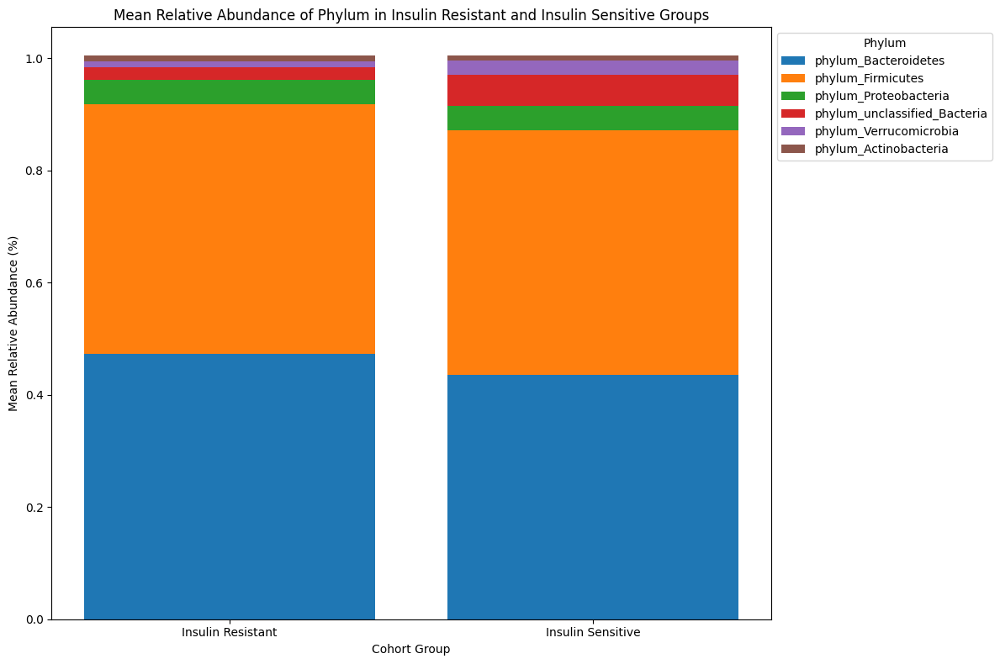

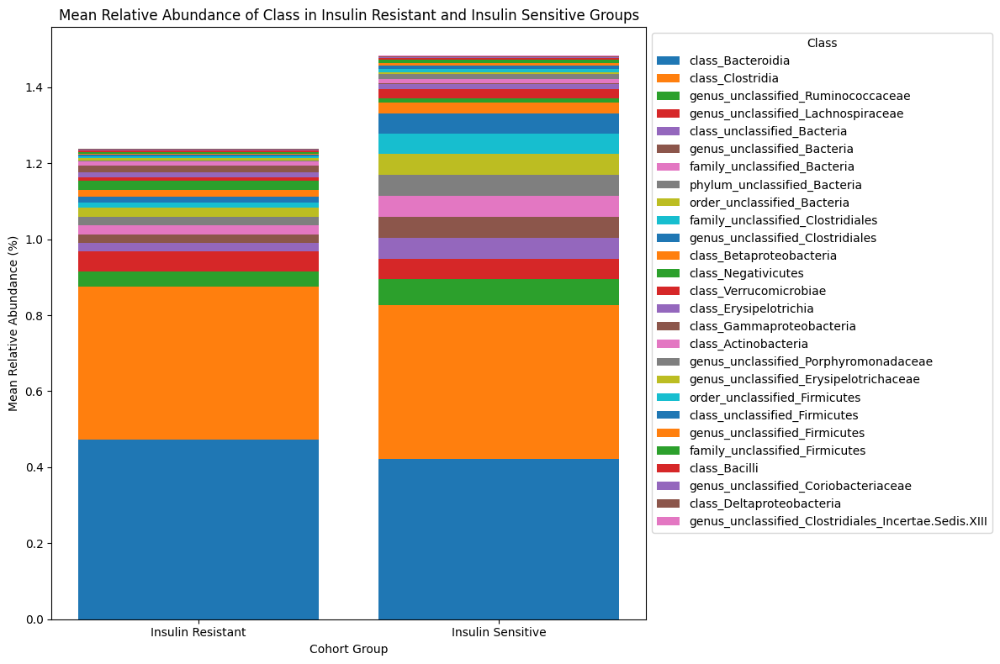

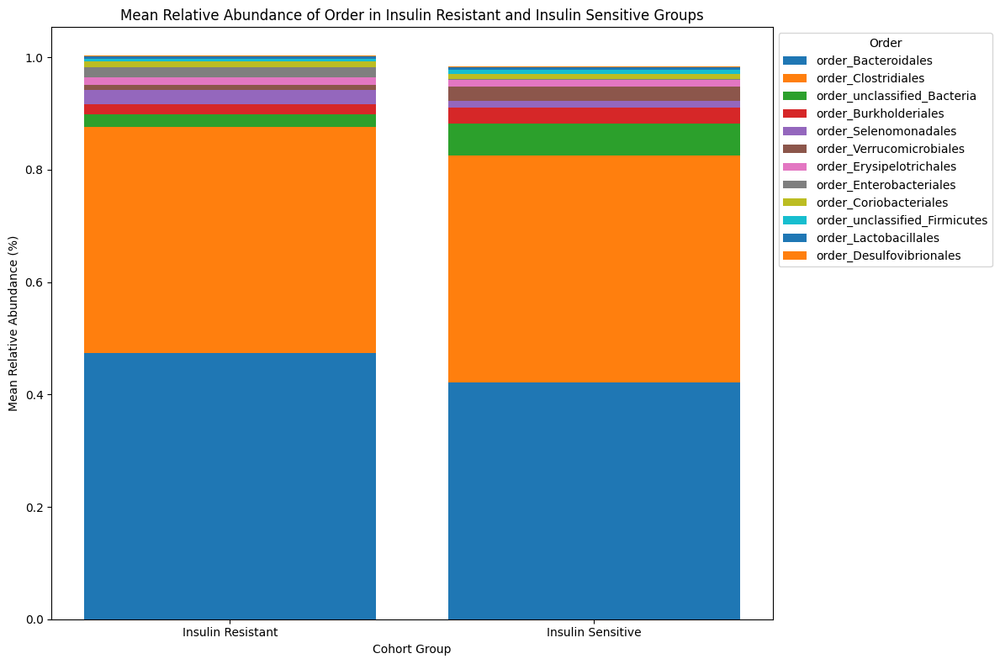

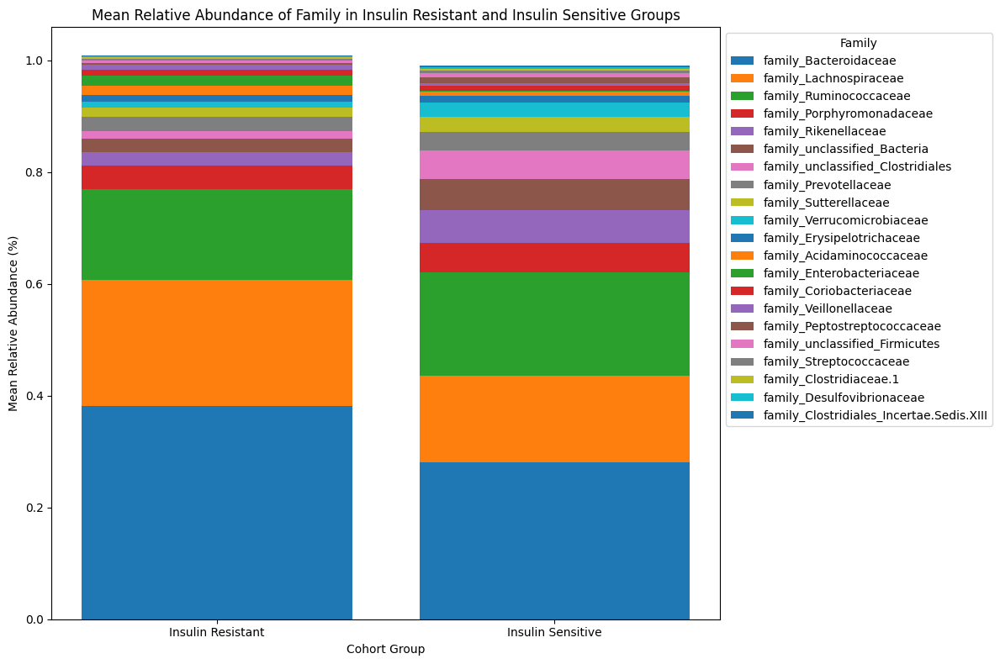

In [13]:
# List of taxonomic levels based on the dataset, excluding 'genus' due to visualization issues
taxonomic_levels = ['phylum', 'class', 'order', 'family']
# Loop each taxonomic level
for level in taxonomic_levels:
    columns = df.filter(like=level).columns
    df_taxonomy = df[columns]

    df_mean = df.groupby('IR_IS_IS')[columns].mean()

    pseudo_count = 0.001
    df_mean += pseudo_count
    df_mean = df_mean.T

    df_mean = df_mean.loc[df_mean.sum(axis=1).sort_values(ascending=False).index]
    df_mean.columns = ['Insulin Resistant', 'Insulin Sensitive']

    plt.figure(figsize=(12, 8))
    bottom = np.zeros(df_mean.shape[1])
    for taxon, datum in df_mean.iterrows():
        plt.bar(df_mean.columns, datum.values, bottom=bottom, label=taxon)
        bottom += datum

    plt.legend(title=level.capitalize(), bbox_to_anchor=(1, 1), loc='upper left')
    plt.ylabel('Mean Relative Abundance (%)')
    plt.xlabel('Cohort Group')
    plt.title(f'Mean Relative Abundance of {level.capitalize()} in Insulin Resistant and Insulin Sensitive Groups')
    plt.tight_layout()
    plt.show()

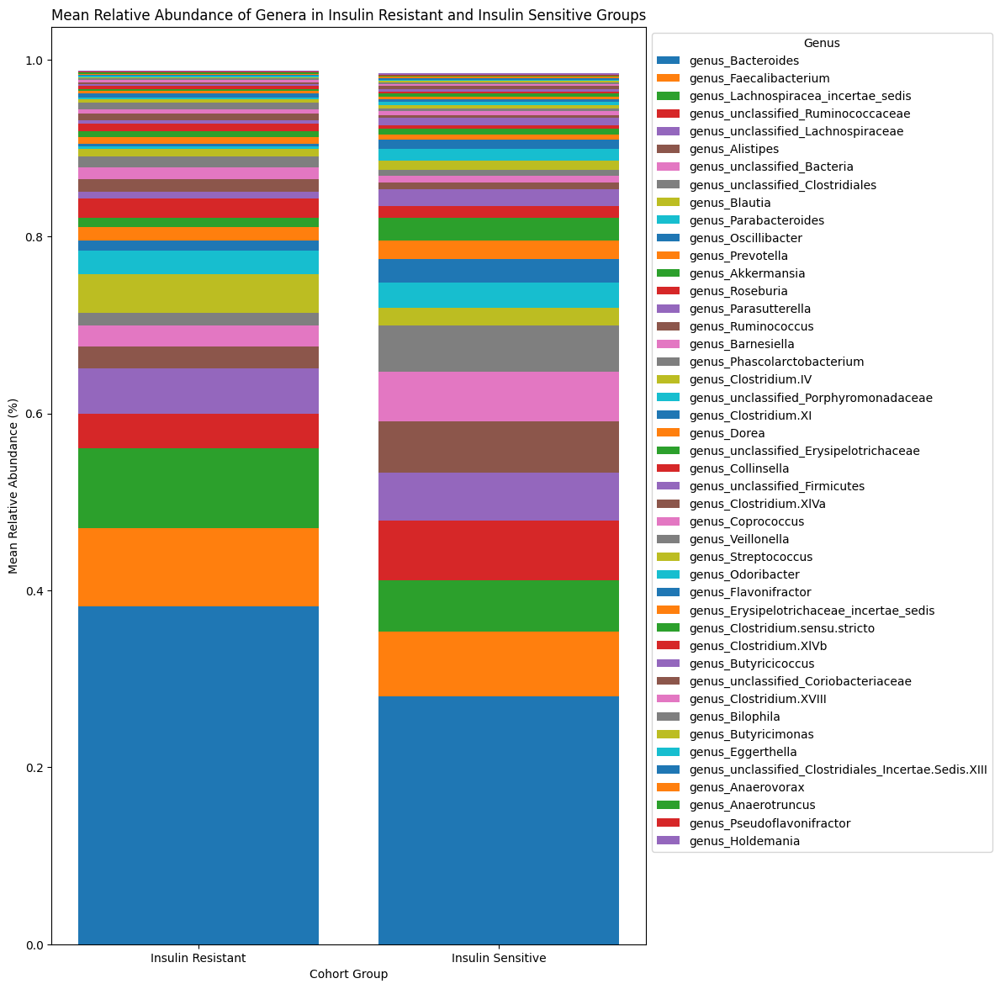

In [14]:
genus_columns = df.filter(like='genus').columns
df_genus = df[genus_columns]

df_mean_genus = df.groupby('IR_IS_IS')[genus_columns].mean()

pseudo_count = 0.001
df_mean_genus += pseudo_count
df_mean_genus = df_mean_genus.T


df_mean_genus = df_mean_genus.loc[df_mean_genus.sum(axis=1).sort_values(ascending=False).index]
df_mean_genus.columns = ['Insulin Resistant', 'Insulin Sensitive']


plt.figure(figsize=(12, 12)) # Increase the figure size to accommodate the large number of genera
bottom = np.zeros(df_mean_genus.shape[1])
for taxon, datum in df_mean_genus.iterrows():
    plt.bar(df_mean_genus.columns, datum.values, bottom=bottom, label=taxon)
    bottom += datum

plt.legend(title='Genus', bbox_to_anchor=(1, 1), loc='upper left')
plt.ylabel('Mean Relative Abundance (%)')
plt.xlabel('Cohort Group')
plt.title('Mean Relative Abundance of Genera in Insulin Resistant and Insulin Sensitive Groups')
plt.tight_layout()
plt.show()

## Statistical Relevace between Features

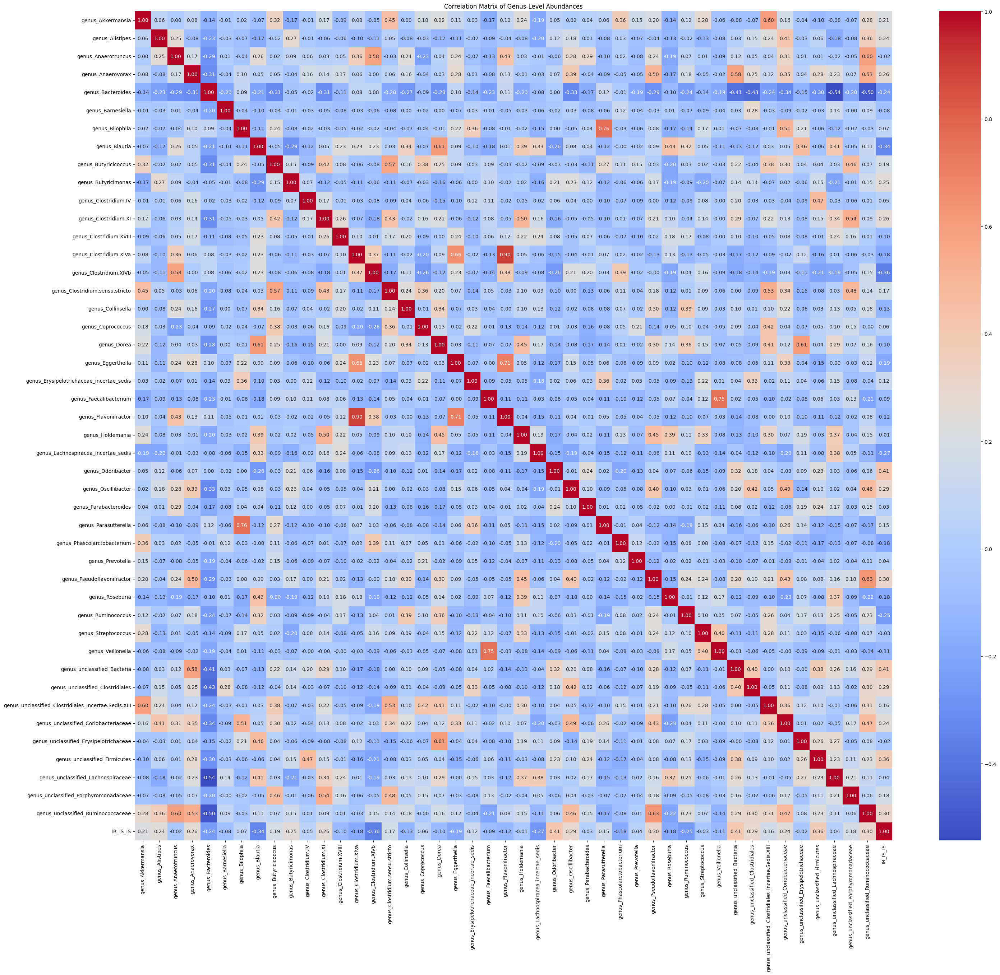

In [15]:
df_genus_target = df_genus.copy()
df_genus_target['IR_IS_IS'] = df['IR_IS_IS']

correlation_matrix = df_genus_target.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(34, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Genus-Level Abundances')
plt.show()

In [16]:
ir_group = df_genus_target[df_genus_target['IR_IS_IS'] == 0]
is_group = df_genus_target[df_genus_target['IR_IS_IS'] == 1]

# Perform a Mann-Whitney U test for each genus to check for significant differences
p_values = {}
for genus in genus_columns:
    stat, p_value = stats.mannwhitneyu(ir_group[genus], is_group[genus])
    p_values[genus] = p_value

# Convert p-values to a DataFrame for easier interpretation
p_values_df = pd.DataFrame.from_dict(p_values, orient='index', columns=['p_value'])
p_values_df['significant'] = p_values_df['p_value'] < 0.05
significant_genera = p_values_df[p_values_df['significant']]
significant_genera_sorted = significant_genera.sort_values(by='p_value')

print(significant_genera_sorted)

                                       p_value  significant
genus_Odoribacter                     0.000481         True
genus_unclassified_Clostridiales      0.001594         True
genus_unclassified_Firmicutes         0.002284         True
genus_Clostridium.XlVb                0.002285         True
genus_unclassified_Bacteria           0.003239         True
genus_Blautia                         0.006612         True
genus_Pseudoflavonifractor            0.006927         True
genus_unclassified_Ruminococcaceae    0.007582         True
genus_Oscillibacter                   0.013422         True
genus_Barnesiella                     0.016290         True
genus_Alistipes                       0.035099         True
genus_unclassified_Coriobacteriaceae  0.041988         True
genus_Butyricimonas                   0.043329         True
genus_Clostridium.XI                  0.048529         True


In [17]:
!pip install scikit-bio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 15.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 39.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-bio: filename=scikit_bio-0.6.2-cp310-cp310-linux_x86_64.whl size=3971877 sha256=f81a7aa348b83de3d0fc5ef9a193cdf9db9f7111649815e4f510f2c692f8b397
  Stored in directory: /root/.cache/pip/wheels/f3/9c/ed/c2b94011fd3765a19330df93f81265e178098dd86c047c1566
  Created wheel for biom-format: filename=biom_format-2.1.16-cp310-cp310-linux_x86_64.whl size=12158936 sha256=f49f8c81598fa8f138471c2d6eec058916139aee25bd02b2580b17154386826c
  Stored in directory: /root/.cache/pip/wheels/8e/a9/f9/197fd5a0e5bbab5f2e03c89194f6c194bed7af5d7a8c8759f3
Successf

In [18]:
from skbio.stats.composition import ancom
# pseudo-count
pseudo_count = 0.001
ancom_df = df_genus_target.copy()
ancom_df.iloc[:, :-1] += pseudo_count

# ANCOM analysis using the Kruskal-Wallis test
ancom_results = ancom(ancom_df.iloc[:, :-1], ancom_df['IR_IS_IS'], significance_test='kruskal')
print(ancom_results)

(                                                     W  Reject null hypothesis
genus_Akkermansia                                    0                    True
genus_Alistipes                                      0                    True
genus_Anaerotruncus                                  1                    True
genus_Anaerovorax                                    1                    True
genus_Bacteroides                                    1                    True
genus_Barnesiella                                    0                    True
genus_Bilophila                                      0                    True
genus_Blautia                                       10                    True
genus_Butyricicoccus                                 0                    True
genus_Butyricimonas                                  1                    True
genus_Clostridium.IV                                 0                    True
genus_Clostridium.XI                               

## Just Microbiome Data Analysis

In [19]:
# Just Microbiome Data

microbiome_df = df_onehot.drop(columns=['SSPG', 'Age', 'BMI', 'Sex_M',	'Class_Crossover', 'Class_Diabetic'	,'Class_Prediabetic', 'Race_B', 'Race_C',	'Race_H'])
display(microbiome_df)

,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,class_Betaproteobacteria,class_Clostridia,class_Deltaproteobacteria,class_Erysipelotrichia,class_Gammaproteobacteria,class_Negativicutes,class_Verrucomicrobiae,class_unclassified_Bacteria,class_unclassified_Firmicutes,order_Bacteroidales,order_Burkholderiales,order_Clostridiales,order_Coriobacteriales,order_Desulfovibrionales,order_Enterobacteriales,order_Erysipelotrichales,order_Lactobacillales,order_Selenomonadales,order_Verrucomicrobiales,order_unclassified_Bacteria,order_unclassified_Firmicutes,family_Acidaminococcaceae,family_Bacteroidaceae,family_Clostridiaceae.1,family_Clostridiales_Incertae.Sedis.XIII,family_Coriobacteriaceae,family_Desulfovibrionaceae,family_Enterobacteriaceae,family_Erysipelotrichaceae,family_Lachnospiraceae,family_Peptostreptococcaceae,family_Porphyromonadaceae,family_Prevotellaceae,family_Rikenellaceae,family_Ruminococcaceae,family_Streptococcaceae,family_Sutterellaceae,family_Veillonellaceae,family_Verrucomicrobiaceae,family_unclassified_Bacteria,family_unclassified_Clostridiales,family_unclassified_Firmicutes,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,genus_Clostridium.IV,genus_Clostridium.XI,genus_Clostridium.XVIII,genus_Clostridium.XlVa,genus_Clostridium.XlVb,genus_Clostridium.sensu.stricto,genus_Collinsella,genus_Coprococcus,genus_Dorea,genus_Eggerthella,genus_Erysipelotrichaceae_incertae_sedis,genus_Faecalibacterium,genus_Flavonifractor,genus_Holdemania,genus_Lachnospiracea_incertae_sedis,genus_Odoribacter,genus_Oscillibacter,genus_Parabacteroides,genus_Parasutterella,genus_Phascolarctobacterium,genus_Prevotella,genus_Pseudoflavonifractor,genus_Roseburia,genus_Ruminococcus,genus_Streptococcus,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,IR_IS_IS
0,0.013645,0.582611,0.298357,0.104188,0.000128,0.000663,0.013645,0.000969,0.582611,0.044149,0.270736,0.013518,0.010253,0.000765,0.016374,0.000128,0.000663,0.000025,0.582611,0.044149,0.270736,0.012829,0.013518,0.000765,0.010253,0.000408,0.016374,0.000128,0.000663,0.000025,0.016272,0.535579,0.002117,0.000663,0.012829,0.013518,0.000765,0.010253,0.114058,0.000434,0.033514,0.000025,0.013492,0.149485,0.000383,0.044149,0.000102,0.000128,0.000663,0.003902,0.000025,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,0.000204,0.000434,0.000663,0.003877,0.002219,0.002117,0.000077,0.002755,0.010176,0.003061,0.000510,0.119516,0.004948,0.000179,0.044532,0.002857,0.008417,0.026933,0.044149,0.016272,0.000000,0.000459,0.000025,0.000153,0.000383,0.000102,0.000663,0.003902,0.000408,0.008952,0.008697,0.000025,0.030657,0.003698,0.013798,0.0
1,0.002822,0.260515,0.663827,0.008572,0.000106,0.063997,0.002822,0.000000,0.260515,0.008359,0.651954,0.000160,0.006868,0.000053,0.002289,0.000106,0.063997,0.002715,0.260515,0.008306,0.651901,0.002715,0.000160,0.000053,0.006868,0.000000,0.002289,0.000106,0.063997,0.002715,0.000692,0.090406,0.000000,0.000532,0.002715,0.000160,0.000053,0.006868,0.108615,0.001757,0.032318,0.005005,0.123416,0.212863,0.000000,0.007986,0.001597,0.000106,0.063997,0.320786,0.002715,0.000106,0.123416,0.000426,0.000213,0.090406,0.000000,0.000053,0.005218,0.002183,0.002715,0.001065,0.001757,0.000053,0.000799,0.000639,0.000000,0.001917,0.002662,0.001810,0.000266,0.006496,0.099297,0.000319,0.000053,0.049303,0.001810,0.048877,0.027739,0.007986,0.000692,0.000106,0.000266,0.005271,0.003993,0.000000,0.000266,0.063997,0

In [20]:
# Save Microbiome Dataset
#microbiome_df.to_csv('/Users/naifganadily/Desktop/Artificial Intelligence for Precision Nutrition Bootcamp/gut-microbiome-precision-nutrition/data/results/microbiome_df.csv')
microbiome_df.to_csv('microbiome_df.csv')

In [21]:
microbiome_df['IR_IS_IS'].value_counts()

,count
IR_IS_IS,
0.0,32
1.0,27


### Data distribution
"Many cell values are zeros. This indicates that either the microbe is not present in the sample, or it is there but not detected because its concentration is so low that our sequencing / mapping methods were not sensitive enough. We don't know which one. This "zero inflation" property is the tricky part of microbiome data science, but it is beyond the scope of the current study." - Prof. Qiyun

In [22]:
df_without_target = microbiome_df.iloc[:, :-1]
print("Ratio of Non-Zero Values: ", df_without_target.astype(bool).sum().sum() / df_without_target.size)
print("Ratio of Zero Values: ", 1 - df_without_target.astype(bool).sum().sum() / df_without_target.size)

Ratio of Non-Zero Values:  0.8836511299435028
Ratio of Zero Values:  0.11634887005649719


In [23]:
sample = df_without_target.iloc[:, 0]
sample

,phylum_Actinobacteria
0,0.013645
1,0.002822
2,0.047996
3,0.005159
4,0.003147
5,0.000936
6,0.004373
7,0.003209
8,0.038886
9,0.001151


In [24]:
s = sample.values
s = s[s > 0]
s.shape[0]

59

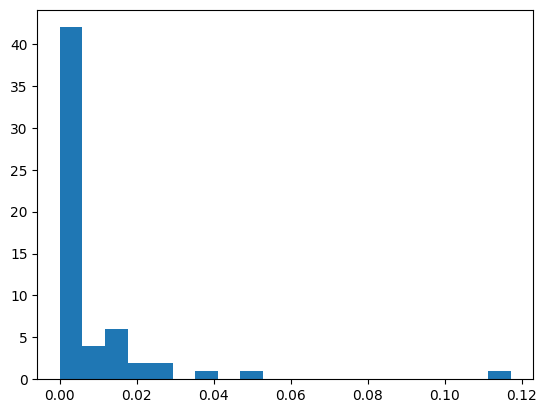

In [25]:
plt.hist(s, bins=20);

"This means that a microbial community is usually dominated by a few abundance organisms, whereas most other organisms are insignificant in the composition (but this doesn't mean that their functional roles are insignificant)." - Prof. Qiyun

After effective normalization, data from different samples can then be compared to each other. Ordination analysis, such as principal coordinate analysis (PCoA) [2], is often then applied to these normalized data to visualize broad trends of how similar or different bacterial populations are in certain sample types, such as healthy vs. sick patients (ordination is a general term for a family of techniques that summarize and project multivariate community data into lower-dimension space). This enables easy visual inspection of sample groupings, driven by sample bacterial content similarity/dissimilarity, and any association with sample metadata.[1]

[1] Weiss, S., Xu, Z.Z., Peddada, S. et al. Normalization and microbial differential abundance strategies depend upon data characteristics. Microbiome 5, 27 (2017). https://doi.org/10.1186/s40168-017-0237-y

[2] Gower JC. Some distance properties of latent root and vector methods used in multivariate analysis. Biometrika. 1966;53:325. doi:10.2307/2333639.

In [26]:
display(microbiome_df)

,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,class_Betaproteobacteria,class_Clostridia,class_Deltaproteobacteria,class_Erysipelotrichia,class_Gammaproteobacteria,class_Negativicutes,class_Verrucomicrobiae,class_unclassified_Bacteria,class_unclassified_Firmicutes,order_Bacteroidales,order_Burkholderiales,order_Clostridiales,order_Coriobacteriales,order_Desulfovibrionales,order_Enterobacteriales,order_Erysipelotrichales,order_Lactobacillales,order_Selenomonadales,order_Verrucomicrobiales,order_unclassified_Bacteria,order_unclassified_Firmicutes,family_Acidaminococcaceae,family_Bacteroidaceae,family_Clostridiaceae.1,family_Clostridiales_Incertae.Sedis.XIII,family_Coriobacteriaceae,family_Desulfovibrionaceae,family_Enterobacteriaceae,family_Erysipelotrichaceae,family_Lachnospiraceae,family_Peptostreptococcaceae,family_Porphyromonadaceae,family_Prevotellaceae,family_Rikenellaceae,family_Ruminococcaceae,family_Streptococcaceae,family_Sutterellaceae,family_Veillonellaceae,family_Verrucomicrobiaceae,family_unclassified_Bacteria,family_unclassified_Clostridiales,family_unclassified_Firmicutes,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,genus_Clostridium.IV,genus_Clostridium.XI,genus_Clostridium.XVIII,genus_Clostridium.XlVa,genus_Clostridium.XlVb,genus_Clostridium.sensu.stricto,genus_Collinsella,genus_Coprococcus,genus_Dorea,genus_Eggerthella,genus_Erysipelotrichaceae_incertae_sedis,genus_Faecalibacterium,genus_Flavonifractor,genus_Holdemania,genus_Lachnospiracea_incertae_sedis,genus_Odoribacter,genus_Oscillibacter,genus_Parabacteroides,genus_Parasutterella,genus_Phascolarctobacterium,genus_Prevotella,genus_Pseudoflavonifractor,genus_Roseburia,genus_Ruminococcus,genus_Streptococcus,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,IR_IS_IS
0,0.013645,0.582611,0.298357,0.104188,0.000128,0.000663,0.013645,0.000969,0.582611,0.044149,0.270736,0.013518,0.010253,0.000765,0.016374,0.000128,0.000663,0.000025,0.582611,0.044149,0.270736,0.012829,0.013518,0.000765,0.010253,0.000408,0.016374,0.000128,0.000663,0.000025,0.016272,0.535579,0.002117,0.000663,0.012829,0.013518,0.000765,0.010253,0.114058,0.000434,0.033514,0.000025,0.013492,0.149485,0.000383,0.044149,0.000102,0.000128,0.000663,0.003902,0.000025,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,0.000204,0.000434,0.000663,0.003877,0.002219,0.002117,0.000077,0.002755,0.010176,0.003061,0.000510,0.119516,0.004948,0.000179,0.044532,0.002857,0.008417,0.026933,0.044149,0.016272,0.000000,0.000459,0.000025,0.000153,0.000383,0.000102,0.000663,0.003902,0.000408,0.008952,0.008697,0.000025,0.030657,0.003698,0.013798,0.0
1,0.002822,0.260515,0.663827,0.008572,0.000106,0.063997,0.002822,0.000000,0.260515,0.008359,0.651954,0.000160,0.006868,0.000053,0.002289,0.000106,0.063997,0.002715,0.260515,0.008306,0.651901,0.002715,0.000160,0.000053,0.006868,0.000000,0.002289,0.000106,0.063997,0.002715,0.000692,0.090406,0.000000,0.000532,0.002715,0.000160,0.000053,0.006868,0.108615,0.001757,0.032318,0.005005,0.123416,0.212863,0.000000,0.007986,0.001597,0.000106,0.063997,0.320786,0.002715,0.000106,0.123416,0.000426,0.000213,0.090406,0.000000,0.000053,0.005218,0.002183,0.002715,0.001065,0.001757,0.000053,0.000799,0.000639,0.000000,0.001917,0.002662,0.001810,0.000266,0.006496,0.099297,0.000319,0.000053,0.049303,0.001810,0.048877,0.027739,0.007986,0.000692,0.000106,0.000266,0.005271,0.003993,0.000000,0.000266,0.063997,0

## Preliminary Modeling Without Demographics

In [27]:
X = microbiome_df.iloc[:, :-1].values
y = microbiome_df['IR_IS_IS'].values

#### CLR transformation

In [28]:
# From Prof. Qiyun's Intro Notebook
def clr(s):
    s_ = np.log1p(s)
    return s_ - s_.mean()

In [29]:
X_clr = np.apply_along_axis(clr, 1, X)

In [30]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores_train_LR = []
scores_test_LR= []

scores_train_KNN = []
scores_test_KNN= []

scores_train_RF = []
scores_test_RF= []

scores_train_SVM = []
scores_test_SVM = []


Fold 1 - TRAIN: [ 1  2  4  6  7  8  9 10 11 14 15 16 17 18 19 20 21 22 23 24 26 27 28 29
 30 31 32 33 35 36 37 38 39 40 41 42 43 44 46 48 50 51 52 54 55 56 58] TEST: [ 0  3  5 12 13 25 34 45 47 49 53 57]
Logistic Regression Predictions: [0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0.]


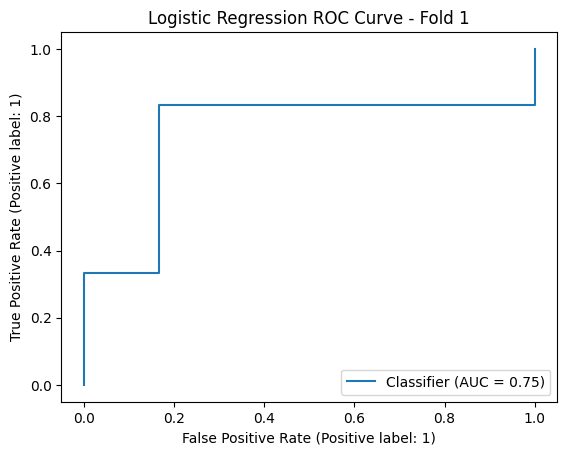

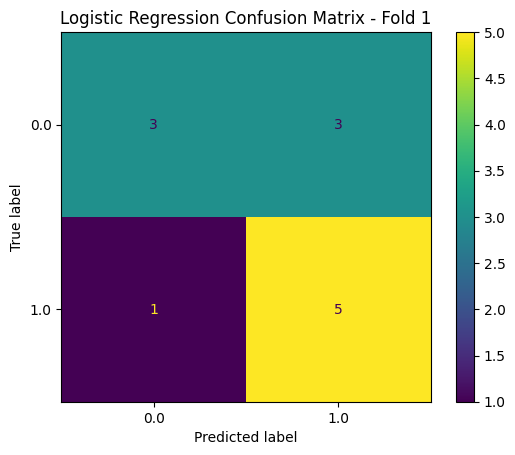

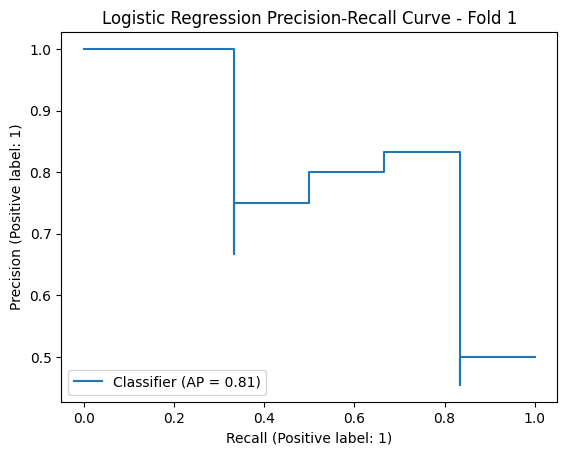

k-NN Predictions: [0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0.]


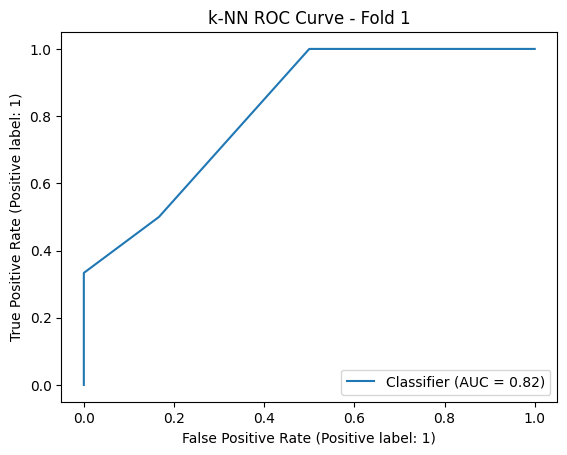

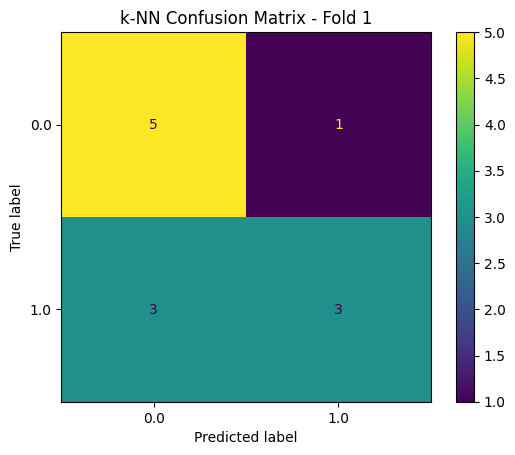

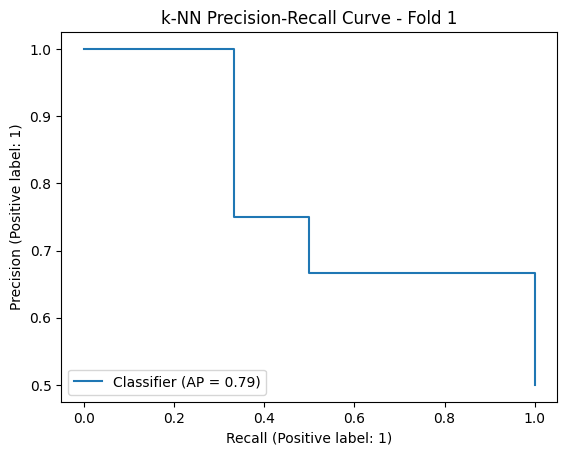

Random Forest Predictions: [0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1.]


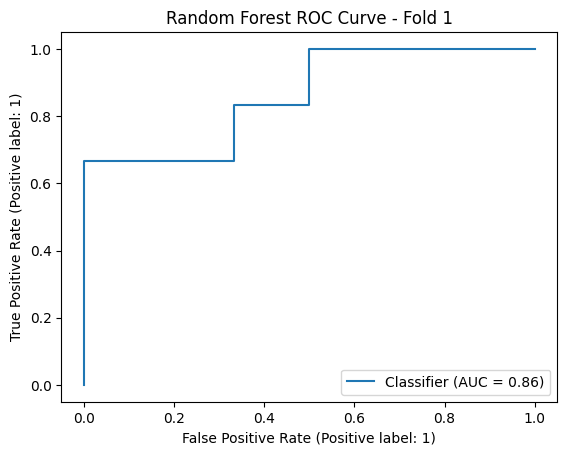

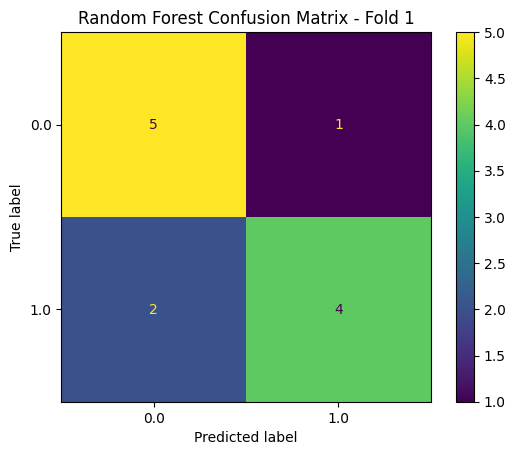

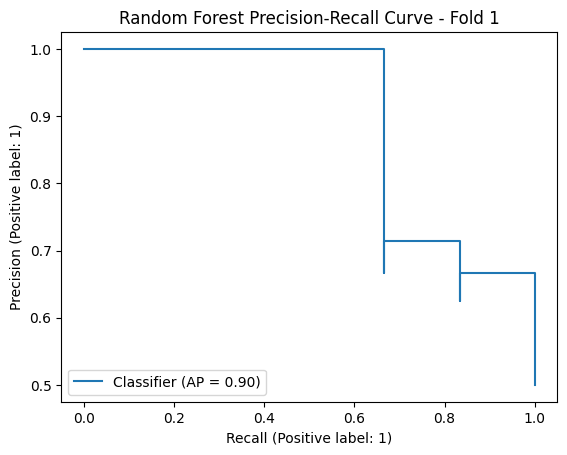

SVM Predictions: [0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1.]


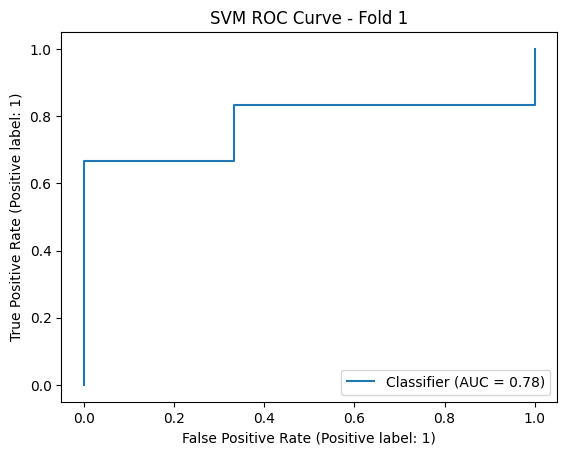

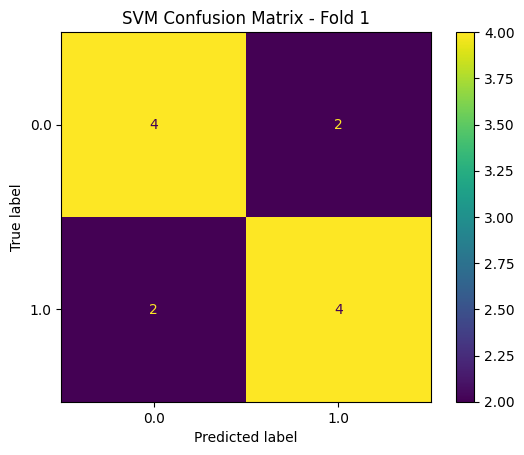

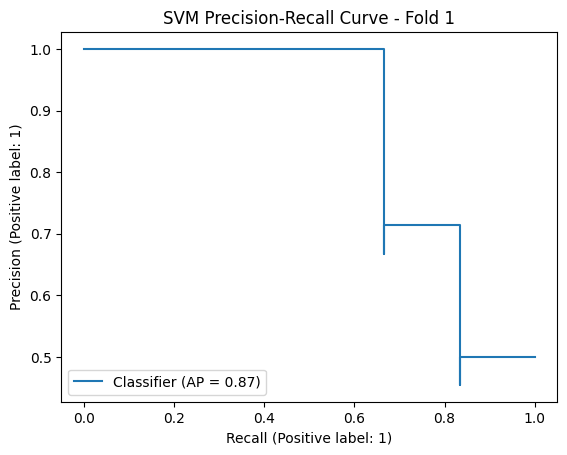

Fold 2 - TRAIN: [ 0  1  2  3  5  7  9 10 11 12 13 14 15 16 18 20 21 22 23 24 25 26 27 28
 29 32 33 34 35 37 38 39 40 41 42 43 45 46 47 48 49 51 52 53 56 57 58] TEST: [ 4  6  8 17 19 30 31 36 44 50 54 55]
Logistic Regression Predictions: [0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0.]


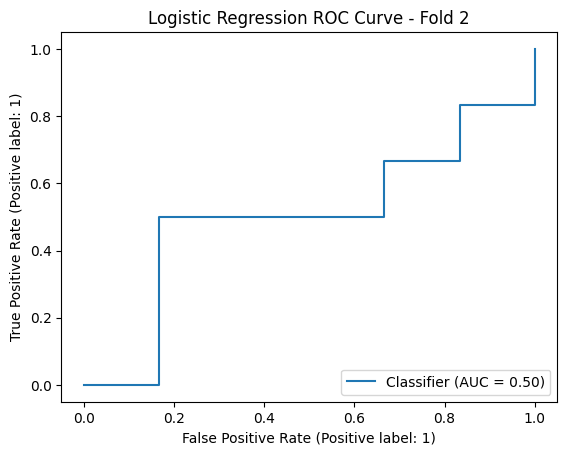

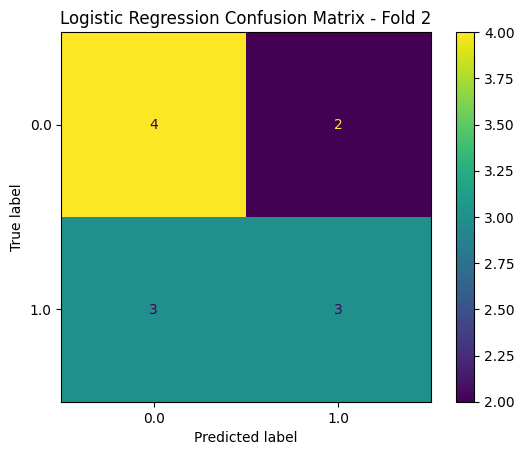

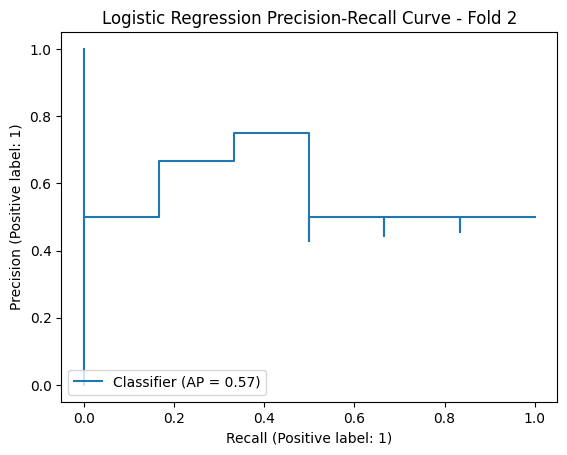

k-NN Predictions: [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


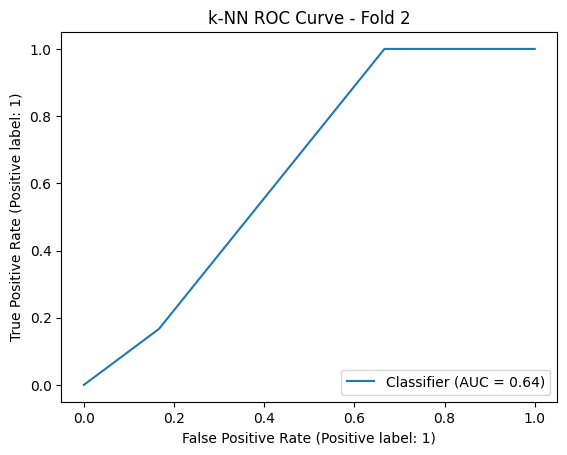

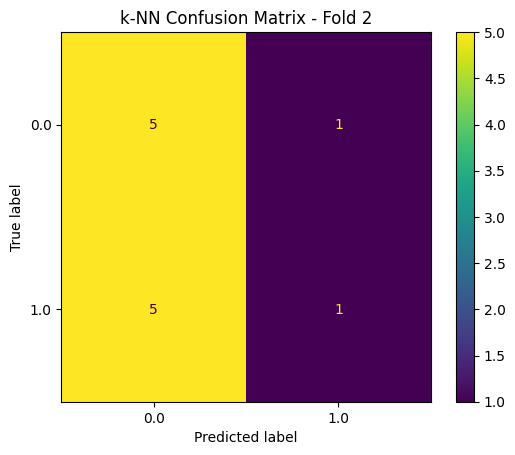

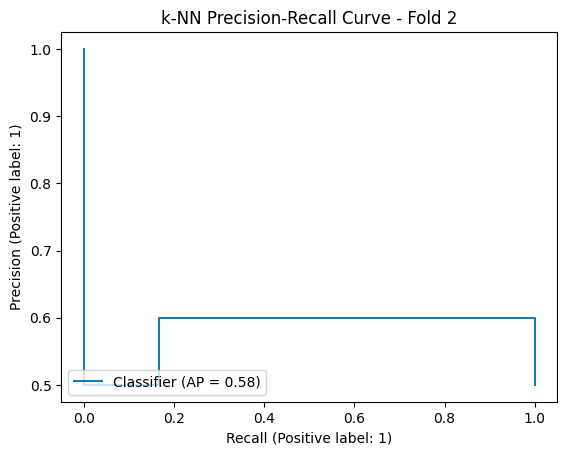

Random Forest Predictions: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


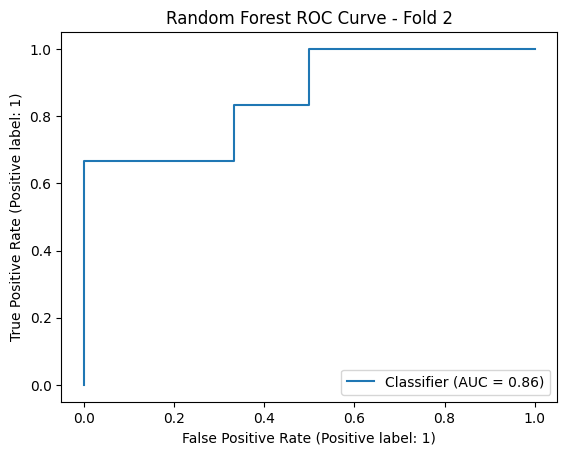

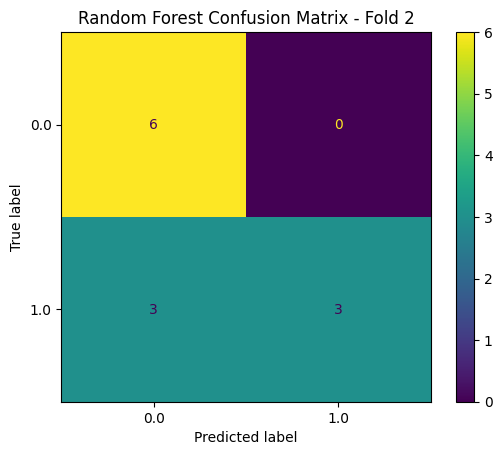

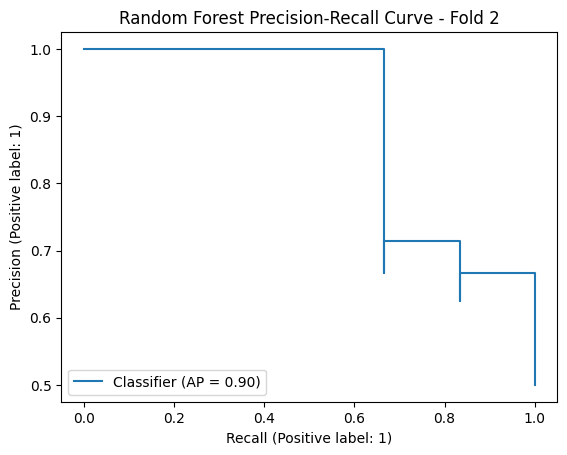

SVM Predictions: [1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]


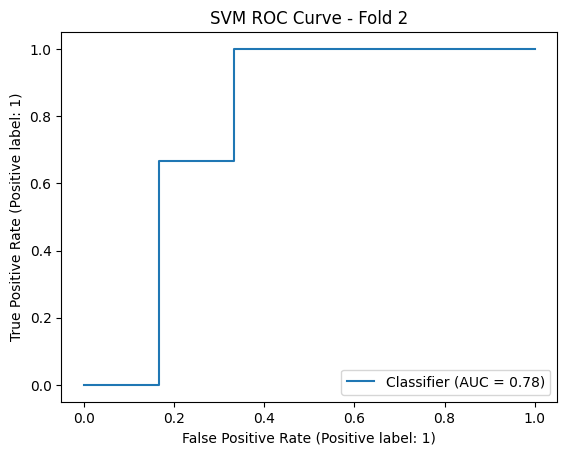

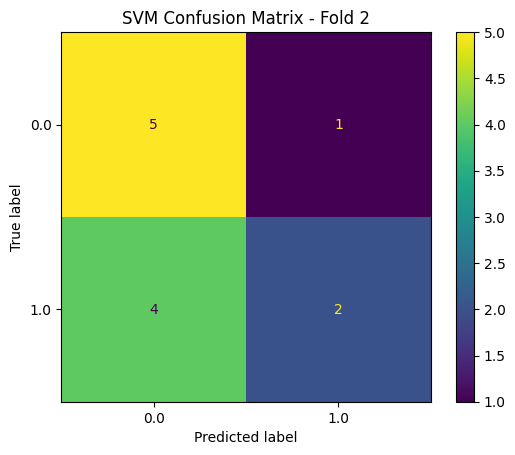

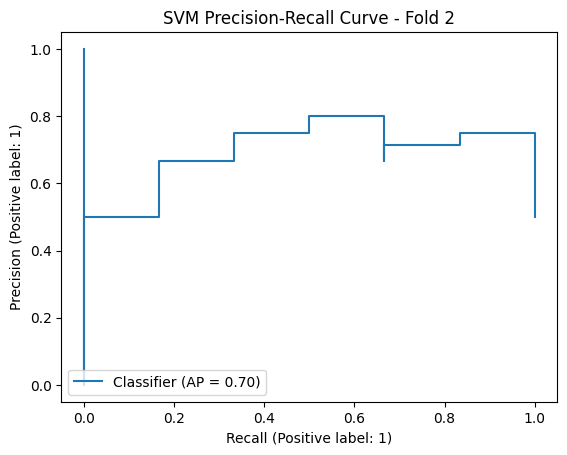

Fold 3 - TRAIN: [ 0  1  2  3  4  5  6  7  8 10 12 13 14 17 18 19 20 21 22 23 25 28 29 30
 31 34 35 36 37 38 39 40 42 43 44 45 46 47 48 49 50 51 53 54 55 57 58] TEST: [ 9 11 15 16 24 26 27 32 33 41 52 56]
Logistic Regression Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0.]


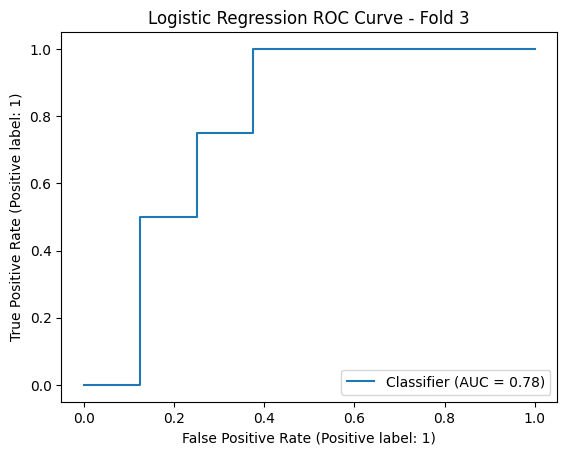

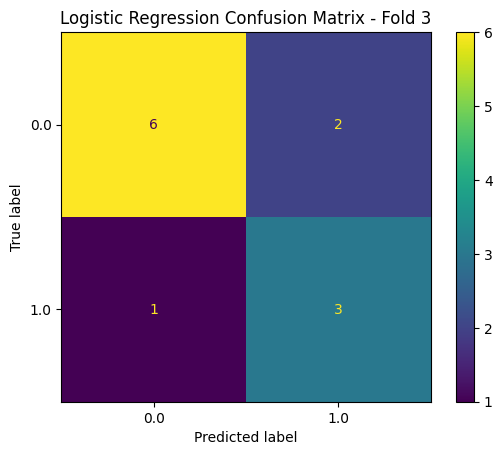

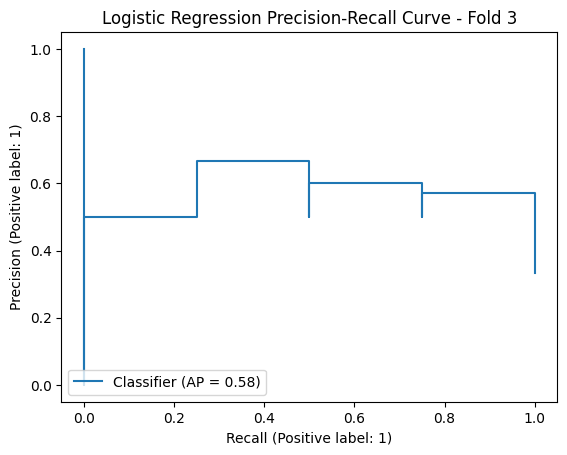

k-NN Predictions: [1. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]


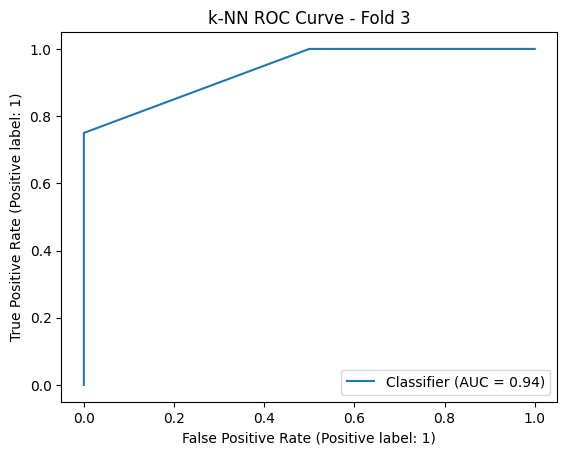

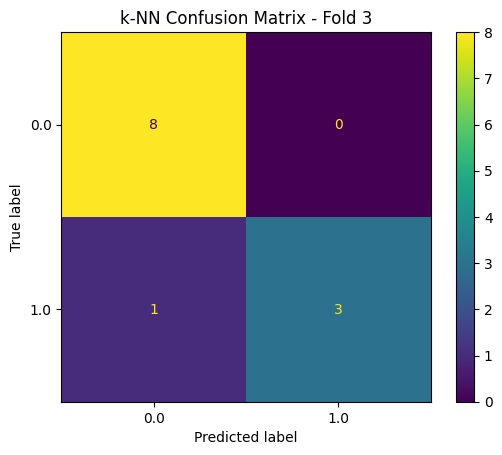

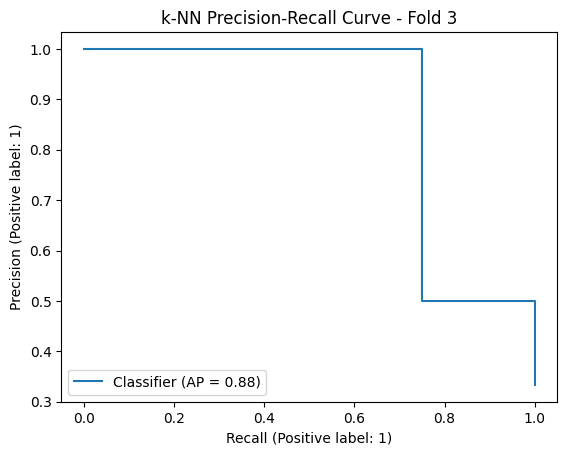

Random Forest Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0.]


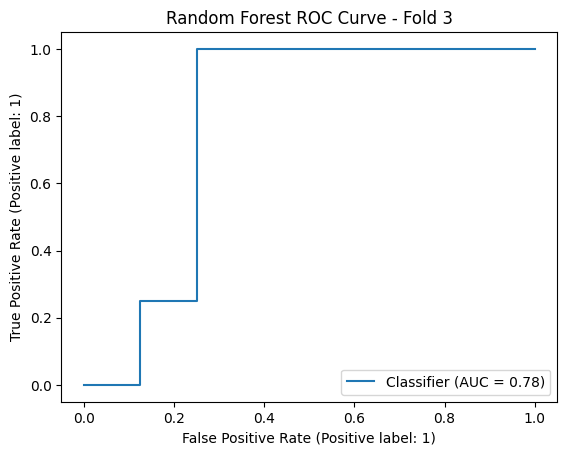

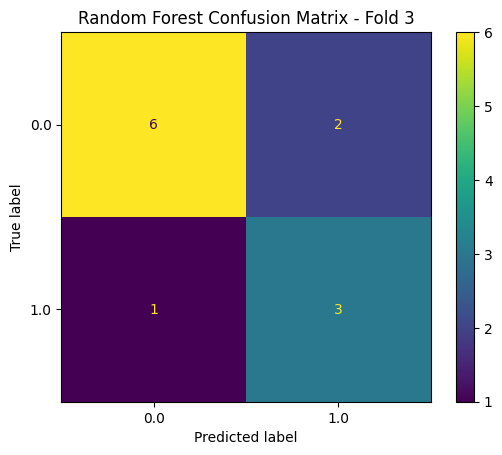

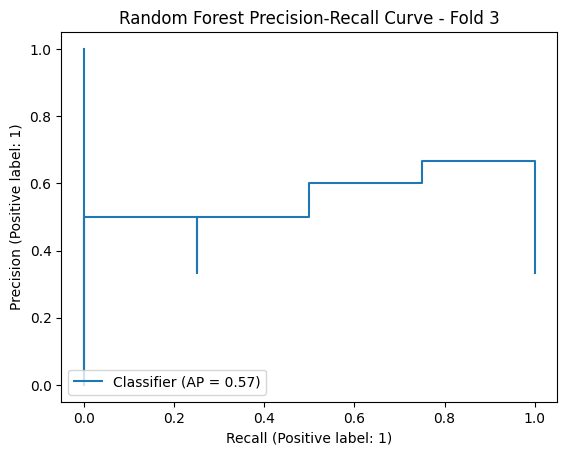

SVM Predictions: [1. 0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


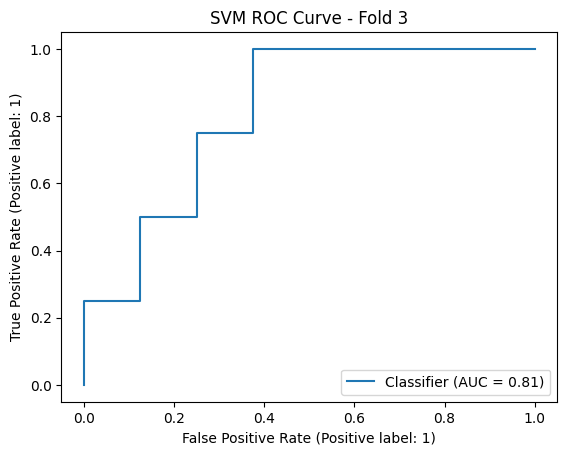

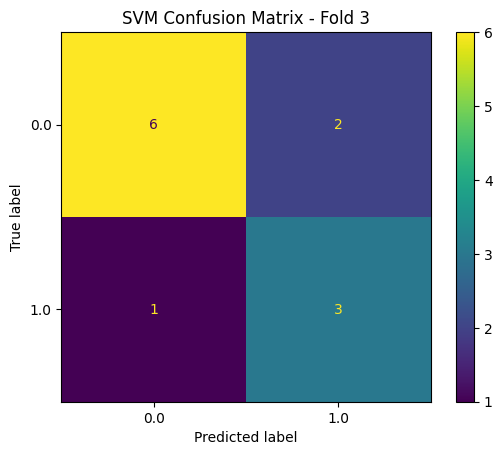

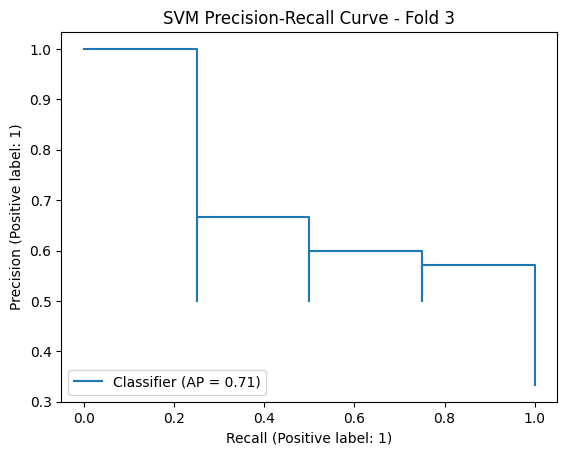

Fold 4 - TRAIN: [ 0  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 24 25 26 27
 28 30 31 32 33 34 36 38 41 42 44 45 47 49 50 51 52 53 54 55 56 57 58] TEST: [ 1  2 21 23 29 35 37 39 40 43 46 48]
Logistic Regression Predictions: [1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 1.]


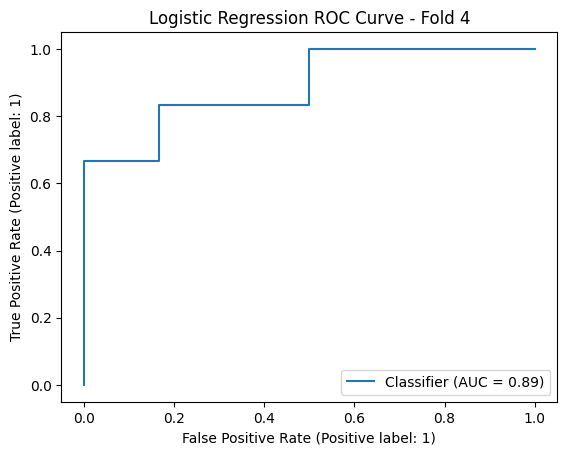

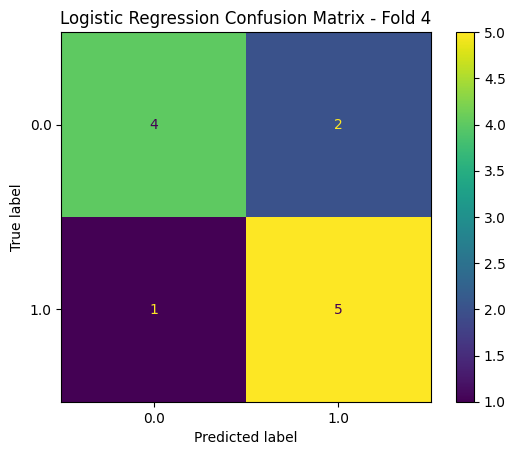

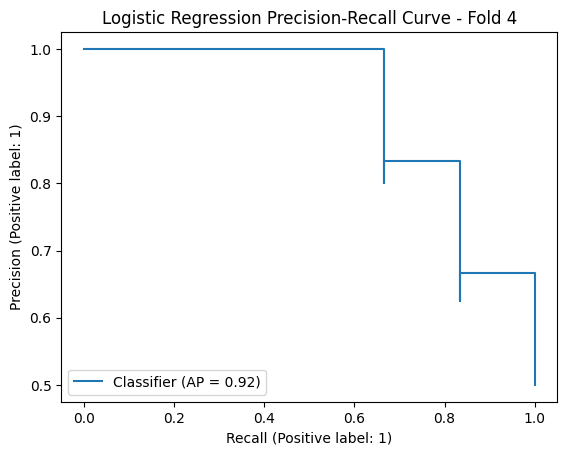

k-NN Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1.]


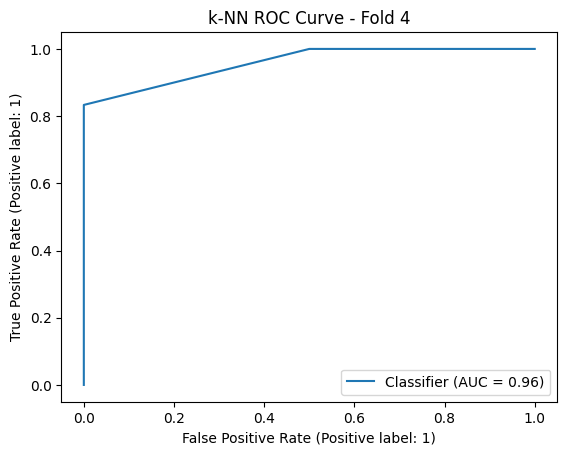

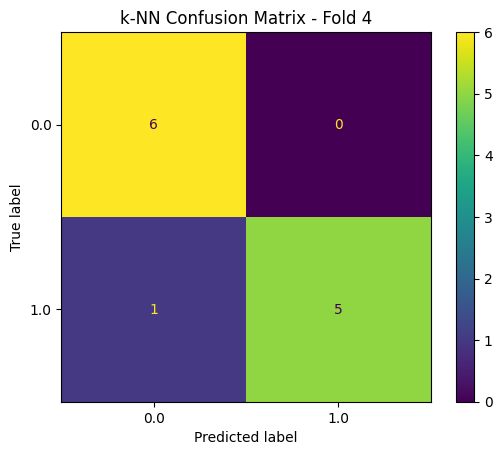

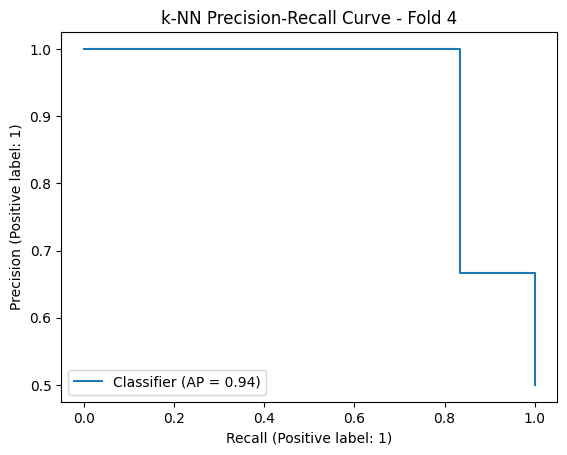

Random Forest Predictions: [1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


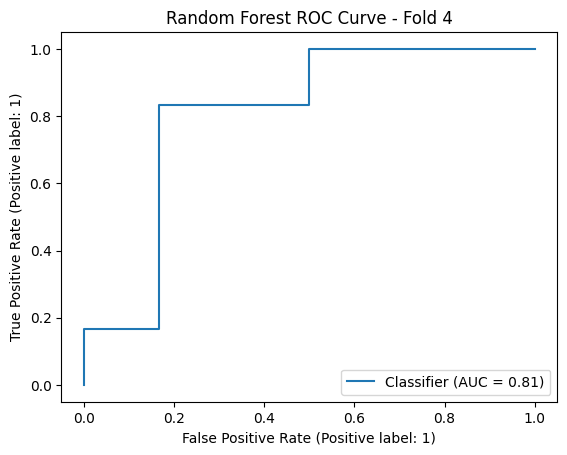

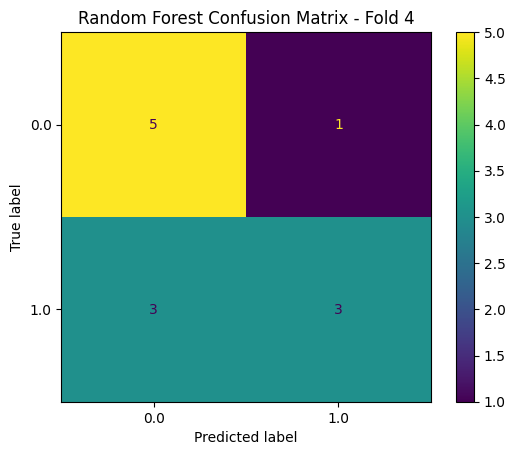

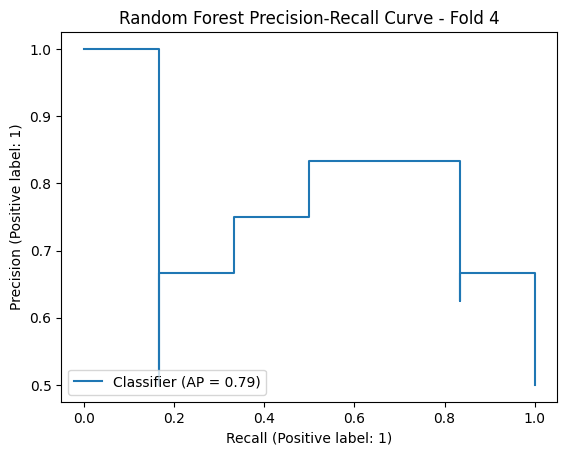

SVM Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


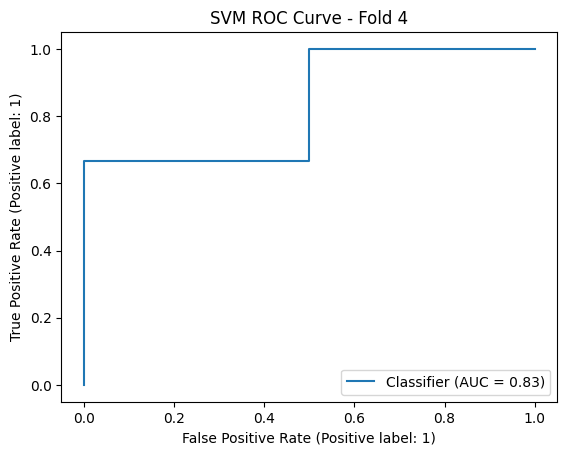

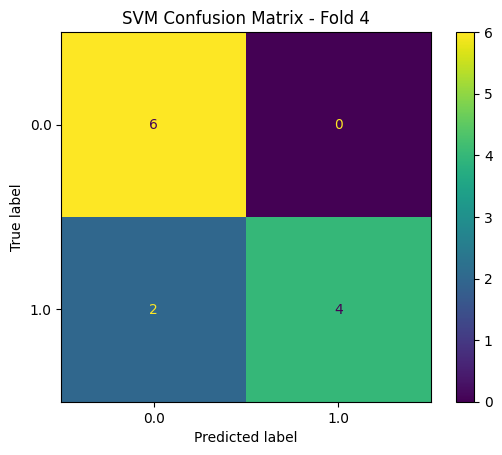

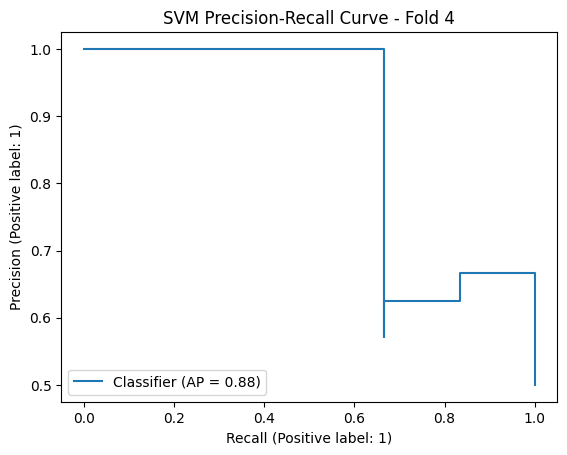

Fold 5 - TRAIN: [ 0  1  2  3  4  5  6  8  9 11 12 13 15 16 17 19 21 23 24 25 26 27 29 30
 31 32 33 34 35 36 37 39 40 41 43 44 45 46 47 48 49 50 52 53 54 55 56 57] TEST: [ 7 10 14 18 20 22 28 38 42 51 58]
Logistic Regression Predictions: [1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0.]


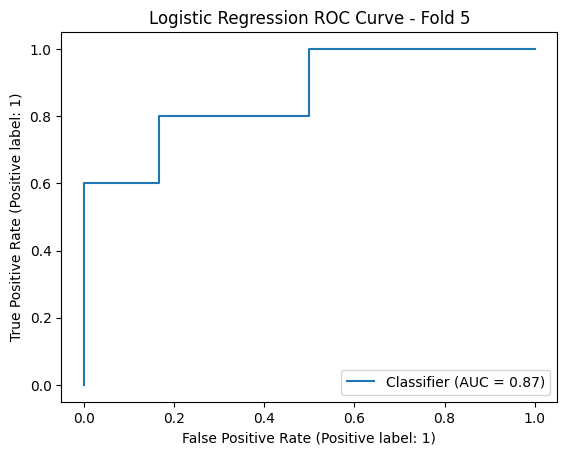

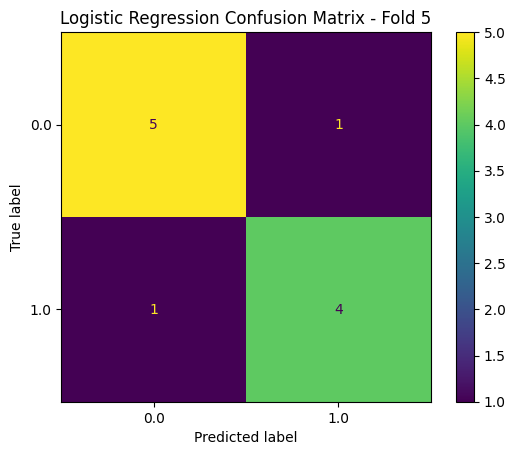

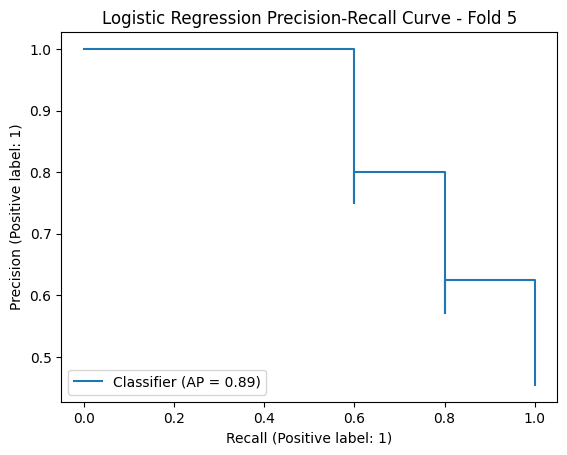

k-NN Predictions: [1. 0. 0. 0. 1. 1. 1. 0. 1. 1. 0.]


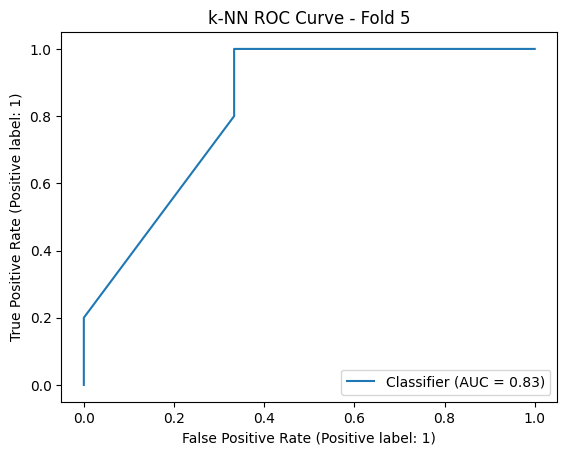

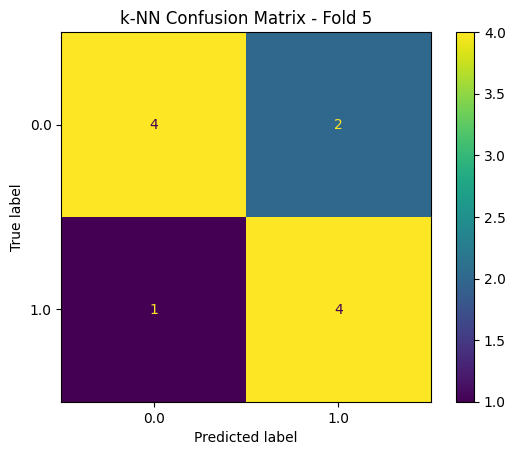

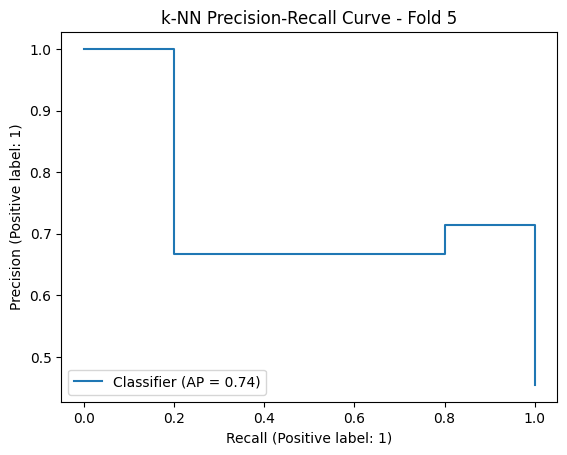

Random Forest Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


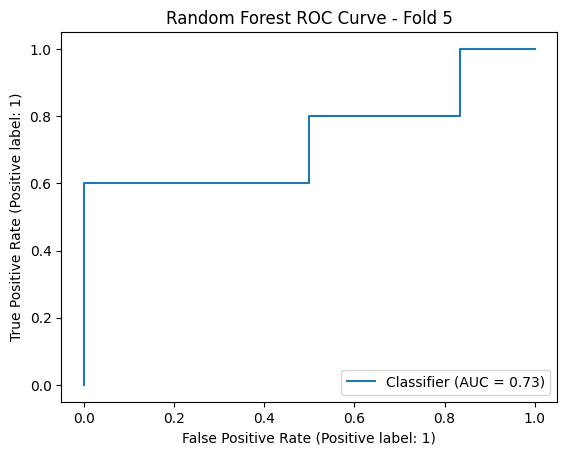

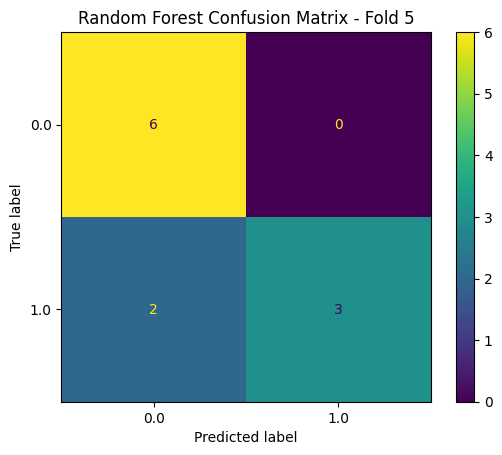

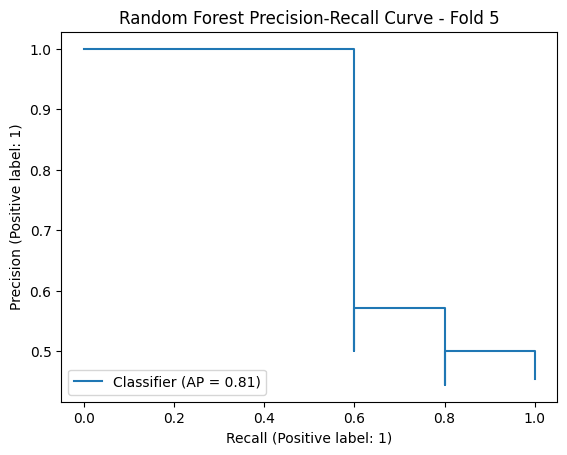

SVM Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


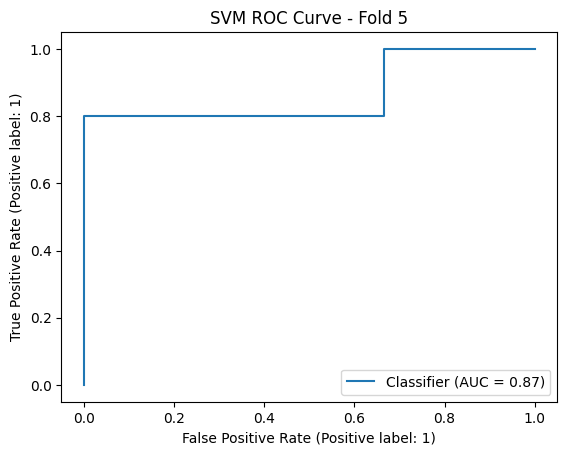

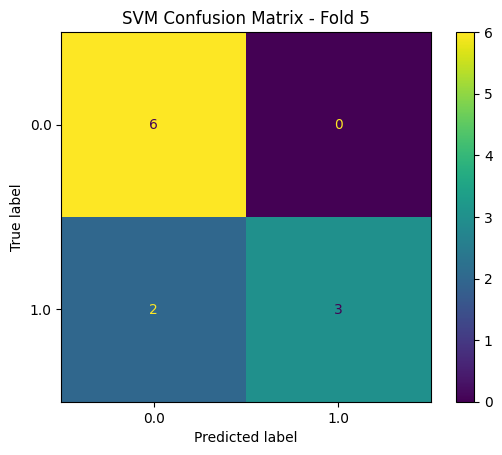

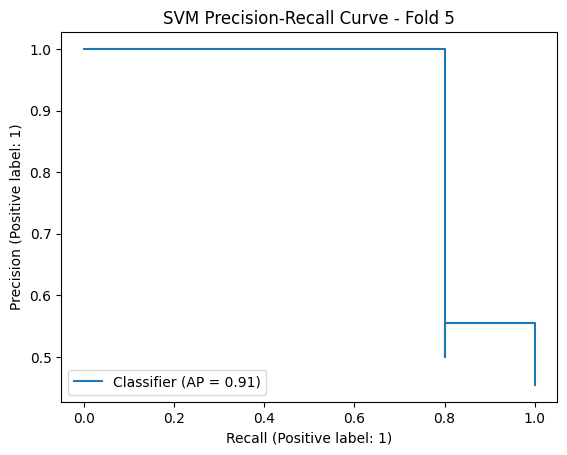


LR Mean train score: 1.0
LR Mean test score: 0.7136363636363636

KNN Mean train score: 0.8304078014184396
KNN Mean test score: 0.7454545454545454

RF train score: 1.0
RF Mean test score: 0.746969696969697

SVM Mean train score: 0.7458333333333333
SVM Mean test score: 0.7303030303030303


In [31]:
# Perform the cross-validation
for fold, (train_index, test_index) in enumerate(kf.split(X_clr), 1):
    print(f"Fold {fold} - TRAIN:", train_index, "TEST:", test_index)
    # Splitting the data
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Standardization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Logistic Regression
    #-----------------------------------------------------------------------#
    LR = LogisticRegression(random_state=42).fit(X_train, y_train)
    score_tr_LR = LR.score(X_train, y_train)
    score_te_LR = LR.score(X_test, y_test)
    scores_train_LR.append(score_tr_LR)
    scores_test_LR.append(score_te_LR)
    y_pred_LR = LR.predict(X_test)
    print("Logistic Regression Predictions:", y_pred_LR)

    # ROC curve forLR
    y_prob_LR = LR.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for LR
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_LR)
    plt.title(f'Logistic Regression Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for LR
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression Precision-Recall Curve - Fold {fold}')
    plt.show()

    # KNN
    #-----------------------------------------------------------------------#
    knn = KNeighborsClassifier().fit(X_train, y_train)
    score_tr_KNN = knn.score(X_train, y_train)
    score_te_KNN = knn.score(X_test, y_test)
    scores_train_KNN.append(score_tr_KNN)
    scores_test_KNN.append(score_te_KNN)
    y_pred_KNN = knn.predict(X_test)
    print("k-NN Predictions:", y_pred_KNN)

    # ROC curve for KNN
    y_prob_KNN = knn.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for KNN
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_KNN)
    plt.title(f'k-NN Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for KNN
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN Precision-Recall Curve - Fold {fold}')
    plt.show()

    # Random Forest
    #-----------------------------------------------------------------------#
    rf = RandomForestClassifier(random_state=42).fit(X_train, y_train)
    score_tr_RF = rf.score(X_train, y_train)
    score_te_RF = rf.score(X_test, y_test)
    scores_train_RF.append(score_tr_RF)
    scores_test_RF.append(score_te_RF)
    y_pred_RF = rf.predict(X_test)
    print("Random Forest Predictions:", y_pred_RF)

    # ROC curve for RF
    y_prob_RF = rf.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for RF
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_RF)
    plt.title(f'Random Forest Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for RF
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest Precision-Recall Curve - Fold {fold}')
    plt.show()

    #SVM
    #-----------------------------------------------------------------------#
    svm = SVC(probability=True, random_state=42, C=0.1, gamma=0.1, kernel='sigmoid', class_weight=None).fit(X_train, y_train)
    score_tr_SVM = svm.score(X_train, y_train)
    score_te_SVM = svm.score(X_test, y_test)
    scores_train_SVM.append(score_tr_SVM)
    scores_test_SVM.append(score_te_SVM)
    y_pred_SVM = svm.predict(X_test)
    print("SVM Predictions:", y_pred_SVM)

    # ROC curve for SVM
    y_prob_SVM = svm.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for SVM
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_SVM)
    plt.title(f'SVM Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for SVM
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM Precision-Recall Curve - Fold {fold}')
    plt.show()


print()
print("LR Mean train score:", np.mean(scores_train_LR))
print("LR Mean test score:", np.mean(scores_test_LR))
print()
print("KNN Mean train score:", np.mean(scores_train_KNN))
print("KNN Mean test score:", np.mean(scores_test_KNN))
print()
print("RF train score:", np.mean(scores_train_RF))
print("RF Mean test score:", np.mean(scores_test_RF))
print()
print("SVM Mean train score:", np.mean(scores_train_SVM))
print("SVM Mean test score:", np.mean(scores_test_SVM))

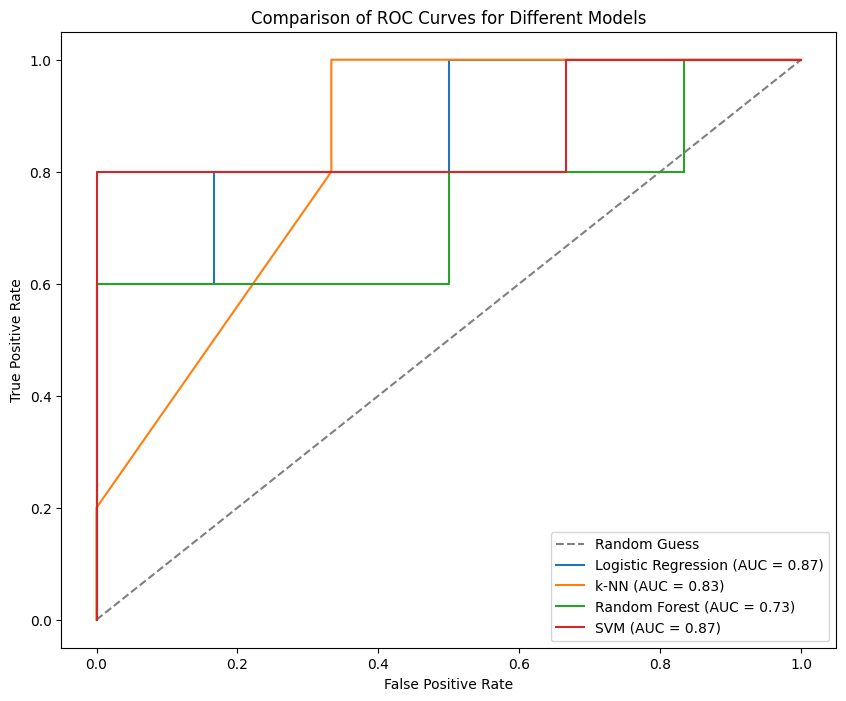

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

# Initialize the plot
plt.figure(figsize=(10, 8))

# Plot the random guess line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Plot ROC curves for Logistic Regression
y_prob_LR = LR.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_LR, ax=plt.gca(), name='Logistic Regression')

# Plot ROC curves for k-NN
y_prob_KNN = knn.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_KNN, ax=plt.gca(), name='k-NN')

# Plot ROC curves for Random Forest
y_prob_RF = rf.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_RF, ax=plt.gca(), name='Random Forest')

# Plot ROC curves for SVM
y_prob_SVM = svm.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_SVM, ax=plt.gca(), name='SVM')

# Add plot labels and title
plt.title('Comparison of ROC Curves for Different Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Show the plot
plt.show()


In [33]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.01, 0.1, 1, 1.5, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'poly', 'sigmoid', 'linear'],
    'class_weight': ['balanced', None]

}

grid = GridSearchCV(SVC(probability=True), param_grid, refit=True, verbose=2)
grid.fit(X_train, y_train)

print(grid.best_params_)


Fitting 5 folds for each of 192 candidates, totalling 960 fits
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.1s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gam

## Preliminary Modeling with Demographics

In [34]:
display(df_onehot)

,Age,BMI,SSPG,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,class_Betaproteobacteria,class_Clostridia,class_Deltaproteobacteria,class_Erysipelotrichia,class_Gammaproteobacteria,class_Negativicutes,class_Verrucomicrobiae,class_unclassified_Bacteria,class_unclassified_Firmicutes,order_Bacteroidales,order_Burkholderiales,order_Clostridiales,order_Coriobacteriales,order_Desulfovibrionales,order_Enterobacteriales,order_Erysipelotrichales,order_Lactobacillales,order_Selenomonadales,order_Verrucomicrobiales,order_unclassified_Bacteria,order_unclassified_Firmicutes,family_Acidaminococcaceae,family_Bacteroidaceae,family_Clostridiaceae.1,family_Clostridiales_Incertae.Sedis.XIII,family_Coriobacteriaceae,family_Desulfovibrionaceae,family_Enterobacteriaceae,family_Erysipelotrichaceae,family_Lachnospiraceae,family_Peptostreptococcaceae,family_Porphyromonadaceae,family_Prevotellaceae,family_Rikenellaceae,family_Ruminococcaceae,family_Streptococcaceae,family_Sutterellaceae,family_Veillonellaceae,family_Verrucomicrobiaceae,family_unclassified_Bacteria,family_unclassified_Clostridiales,family_unclassified_Firmicutes,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,genus_Clostridium.IV,genus_Clostridium.XI,genus_Clostridium.XVIII,genus_Clostridium.XlVa,genus_Clostridium.XlVb,genus_Clostridium.sensu.stricto,genus_Collinsella,genus_Coprococcus,genus_Dorea,genus_Eggerthella,genus_Erysipelotrichaceae_incertae_sedis,genus_Faecalibacterium,genus_Flavonifractor,genus_Holdemania,genus_Lachnospiracea_incertae_sedis,genus_Odoribacter,genus_Oscillibacter,genus_Parabacteroides,genus_Parasutterella,genus_Phascolarctobacterium,genus_Prevotella,genus_Pseudoflavonifractor,genus_Roseburia,genus_Ruminococcus,genus_Streptococcus,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,Sex_M,Class_Crossover,Class_Diabetic,Class_Prediabetic,Race_B,Race_C,Race_H,IR_IS_IS
0,58.65,31.24,162.00,0.013645,0.582611,0.298357,0.104188,0.000128,0.000663,0.013645,0.000969,0.582611,0.044149,0.270736,0.013518,0.010253,0.000765,0.016374,0.000128,0.000663,0.000025,0.582611,0.044149,0.270736,0.012829,0.013518,0.000765,0.010253,0.000408,0.016374,0.000128,0.000663,0.000025,0.016272,0.535579,0.002117,0.000663,0.012829,0.013518,0.000765,0.010253,0.114058,0.000434,0.033514,0.000025,0.013492,0.149485,0.000383,0.044149,0.000102,0.000128,0.000663,0.003902,0.000025,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,0.000204,0.000434,0.000663,0.003877,0.002219,0.002117,0.000077,0.002755,0.010176,0.003061,0.000510,0.119516,0.004948,0.000179,0.044532,0.002857,0.008417,0.026933,0.044149,0.016272,0.000000,0.000459,0.000025,0.000153,0.000383,0.000102,0.000663,0.003902,0.000408,0.008952,0.008697,0.000025,0.030657,0.003698,0.013798,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,49.69,28.24,75.00,0.002822,0.260515,0.663827,0.008572,0.000106,0.063997,0.002822,0.000000,0.260515,0.008359,0.651954,0.000160,0.006868,0.000053,0.002289,0.000106,0.063997,0.002715,0.260515,0.008306,0.651901,0.002715,0.000160,0.000053,0.006868,0.000000,0.002289,0.000106,0.063997,0.002715,0.000692,0.090406,0.000000,0.000532,0.002715,0.000160,0.000053,0.006868,0.108615,0.001757,0.032318,0.005005,0.123416,0.212863,0.000000,0.007986,0.001597,0.000106,0.063997,0.320786,0.002715,0.000106,0.123416,0.000426,0.000213,0.090406,0.000000,0.000053,0.005218,0.002183,0.002715,0.001065,0.001757,0.000053,0.000799,0.000639,0.000000,0.001917,0.002662,0.001810,0.000266,

In [35]:
# Dropping the SSPG

df= df_onehot.drop(columns=['SSPG'])

phylum_columns = df.filter(like='phylum').columns
df_phylum = df[phylum_columns]

X = df_phylum.values
y = df['IR_IS_IS'].values

In [36]:
display(df.columns)

Index(['Age', 'BMI', 'phylum_Actinobacteria', 'phylum_Bacteroidetes',
       'phylum_Firmicutes', 'phylum_Proteobacteria', 'phylum_Verrucomicrobia',
       'phylum_unclassified_Bacteria', 'class_Actinobacteria', 'class_Bacilli',
       ...
       'genus_unclassified_Porphyromonadaceae',
       'genus_unclassified_Ruminococcaceae', 'Sex_M', 'Class_Crossover',
       'Class_Diabetic', 'Class_Prediabetic', 'Race_B', 'Race_C', 'Race_H',
       'IR_IS_IS'],
      dtype='object', length=106)

In [37]:
X = df.iloc[:, :-1].values
y = df['IR_IS_IS'].values

Fold 1 - TRAIN: [ 1  2  4  6  7  8  9 10 11 14 15 16 17 18 19 20 21 22 23 24 26 27 28 29
 30 31 32 33 35 36 37 38 39 40 41 42 43 44 46 48 50 51 52 54 55 56 58] TEST: [ 0  3  5 12 13 25 34 45 47 49 53 57]
Logistic Regression Predictions: [0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1.]


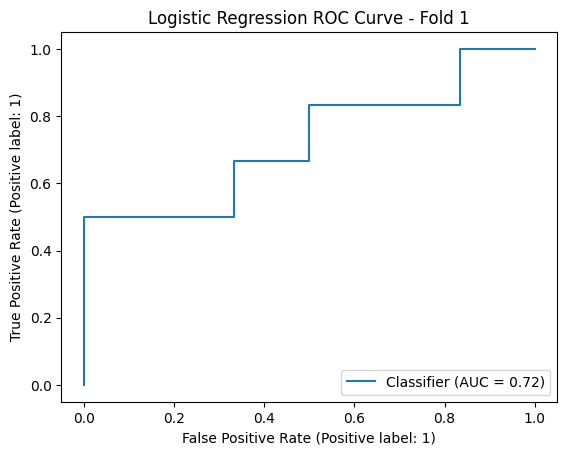

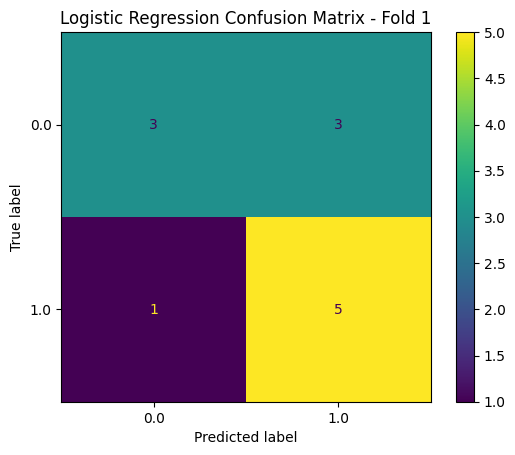

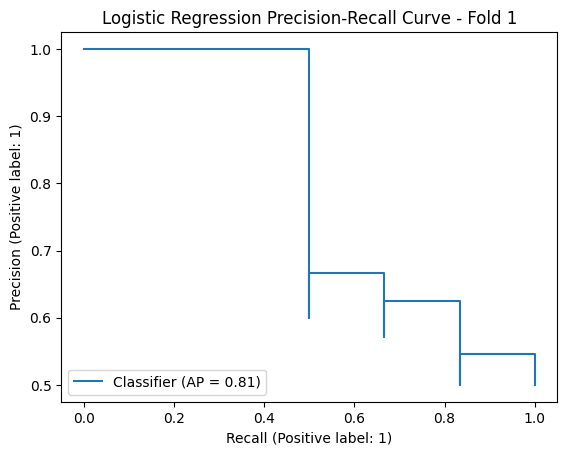

k-NN Predictions: [0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]


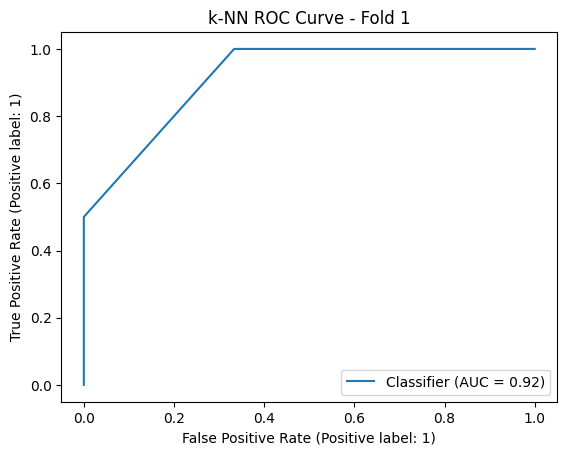

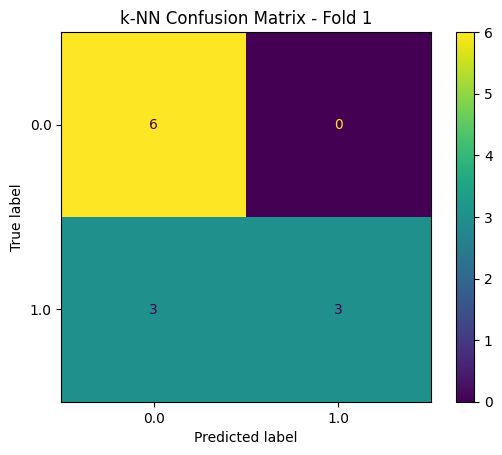

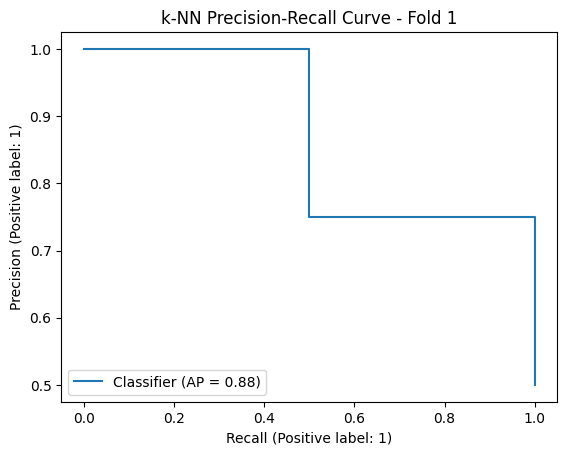

Random Forest Predictions: [0. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 1.]


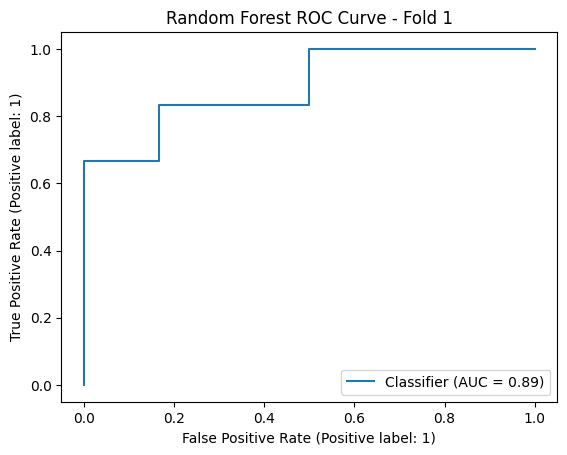

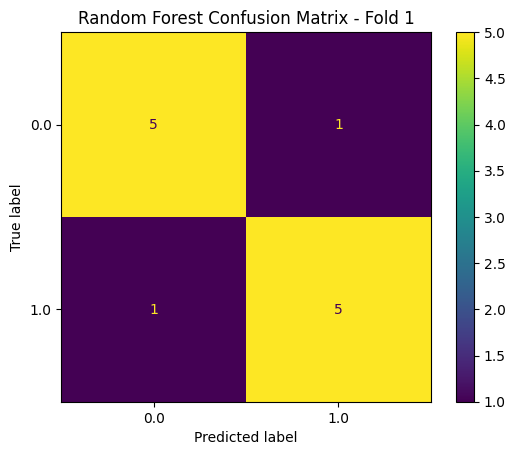

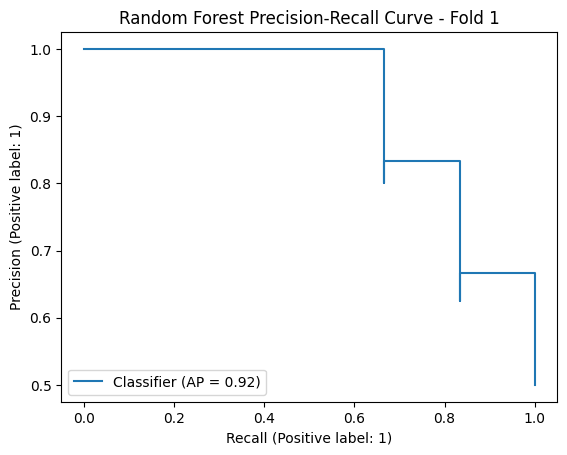

SVM Predictions: [0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1.]


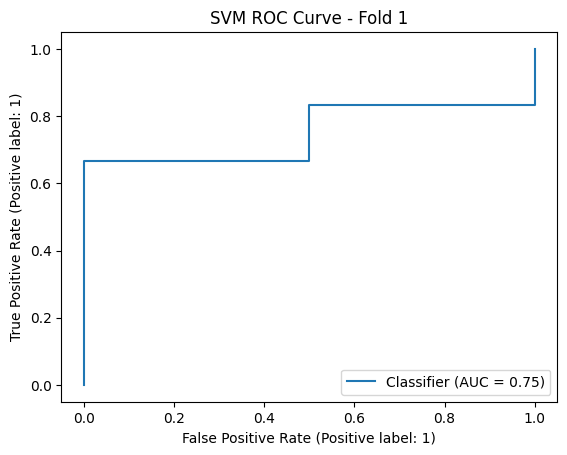

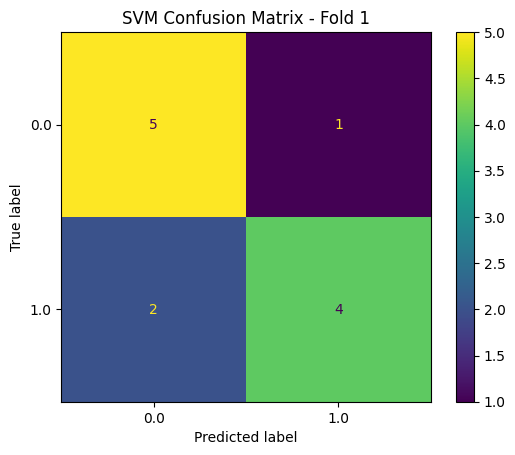

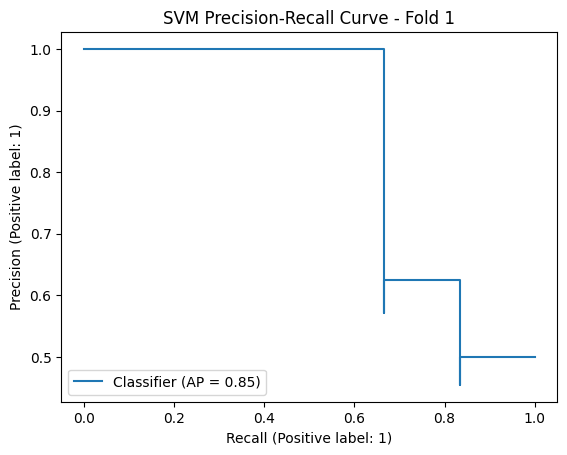

Fold 2 - TRAIN: [ 0  1  2  3  5  7  9 10 11 12 13 14 15 16 18 20 21 22 23 24 25 26 27 28
 29 32 33 34 35 37 38 39 40 41 42 43 45 46 47 48 49 51 52 53 56 57 58] TEST: [ 4  6  8 17 19 30 31 36 44 50 54 55]
Logistic Regression Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0.]


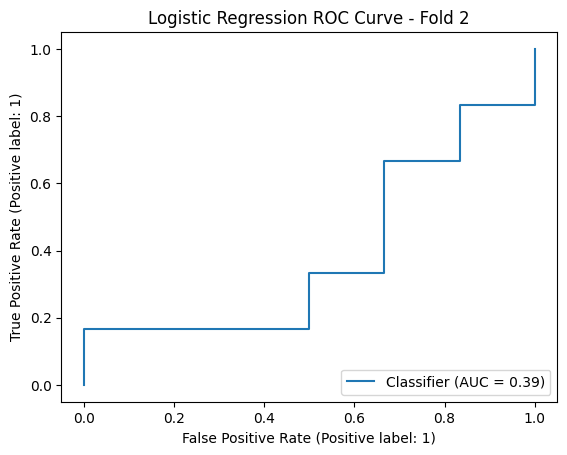

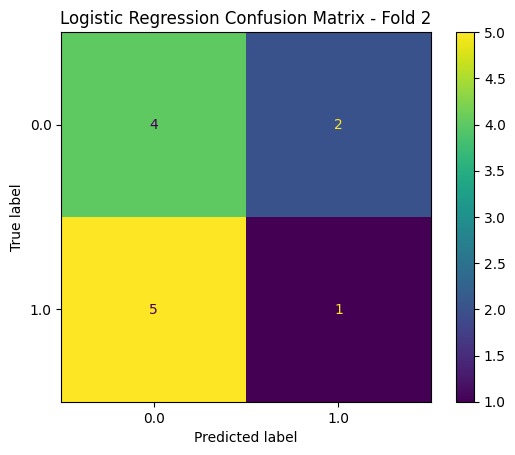

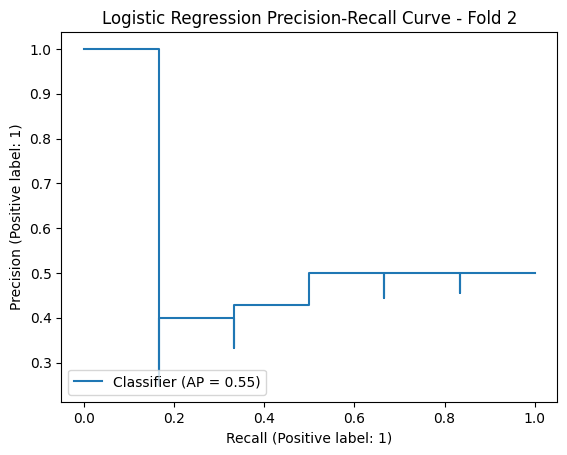

k-NN Predictions: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


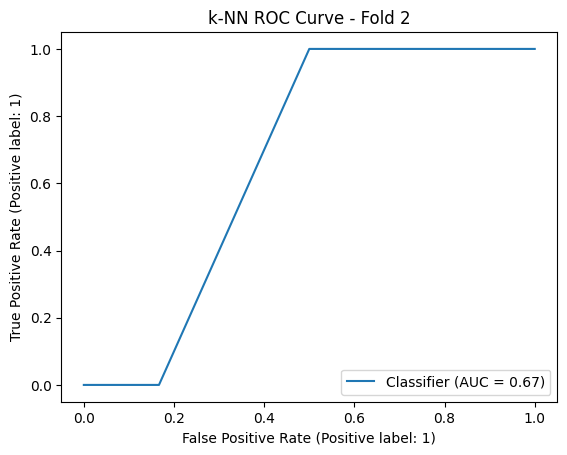

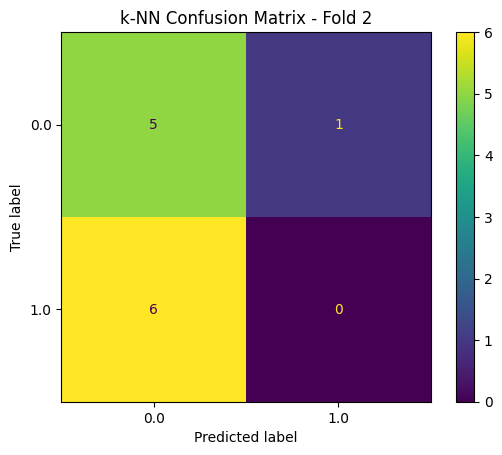

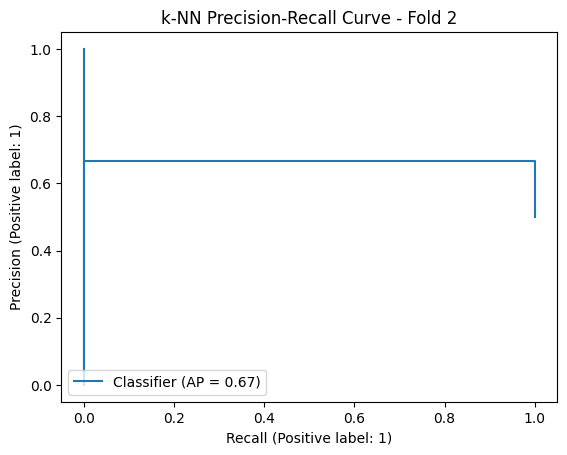

Random Forest Predictions: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


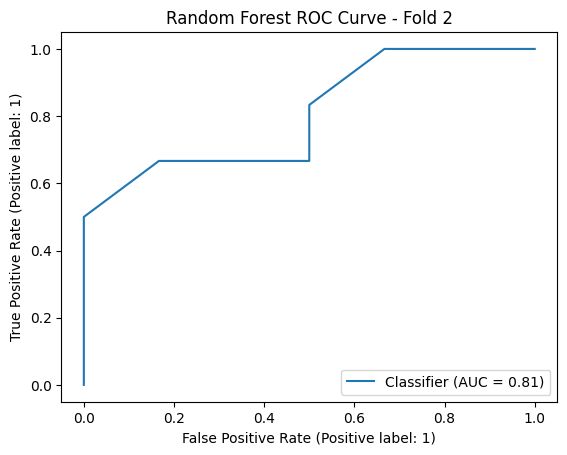

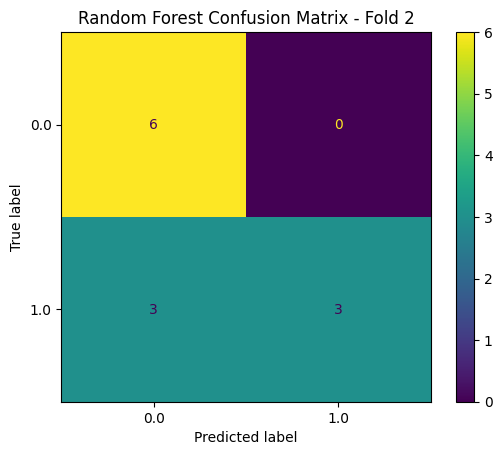

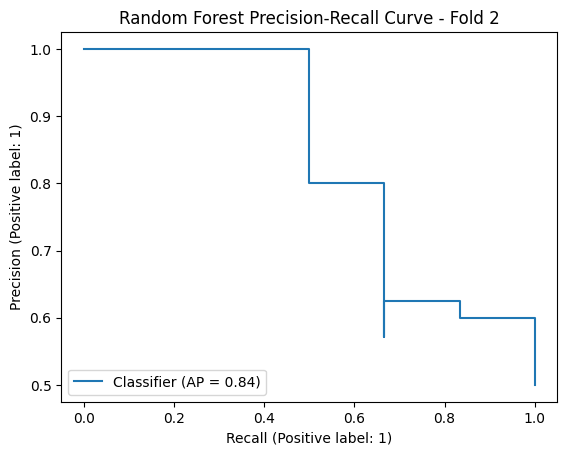

SVM Predictions: [1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]


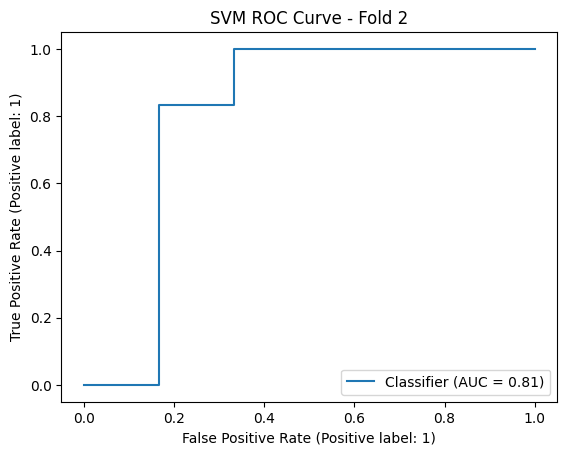

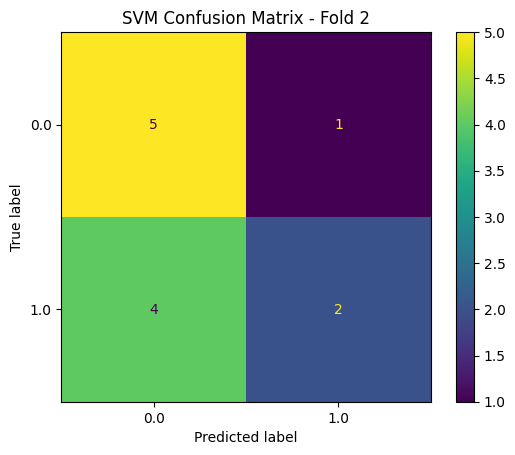

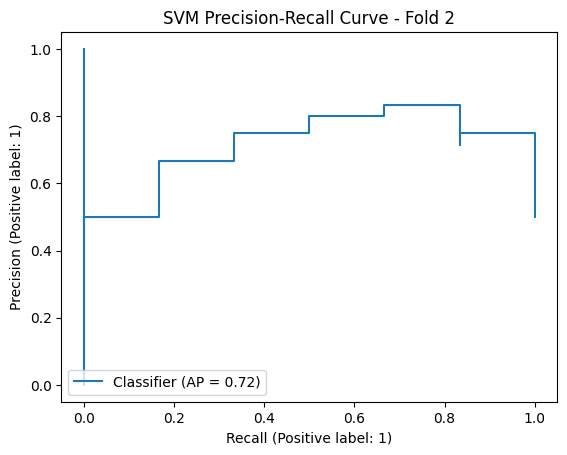

Fold 3 - TRAIN: [ 0  1  2  3  4  5  6  7  8 10 12 13 14 17 18 19 20 21 22 23 25 28 29 30
 31 34 35 36 37 38 39 40 42 43 44 45 46 47 48 49 50 51 53 54 55 57 58] TEST: [ 9 11 15 16 24 26 27 32 33 41 52 56]
Logistic Regression Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0.]


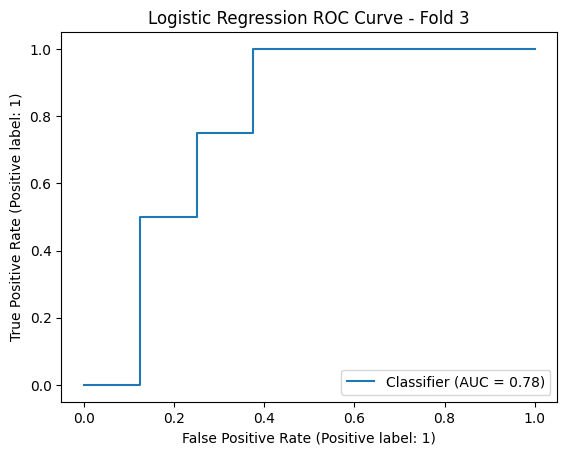

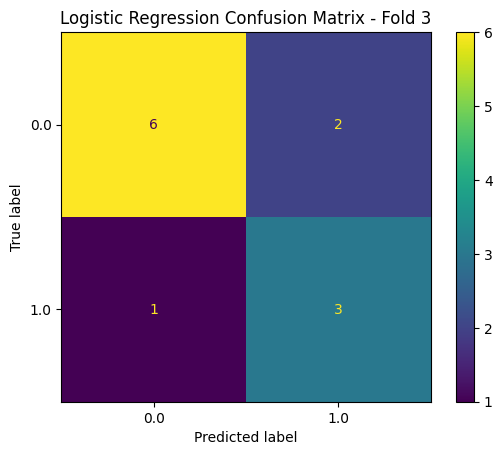

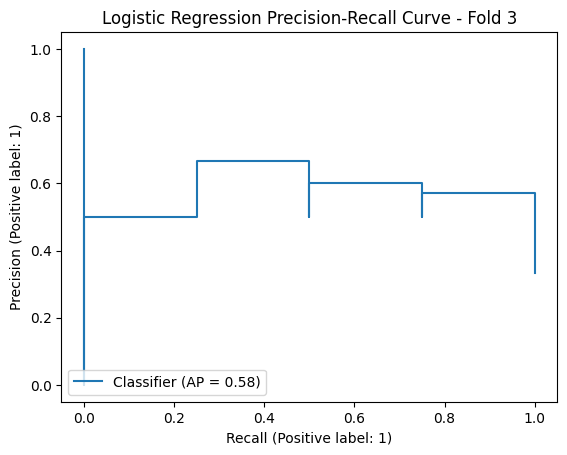

k-NN Predictions: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


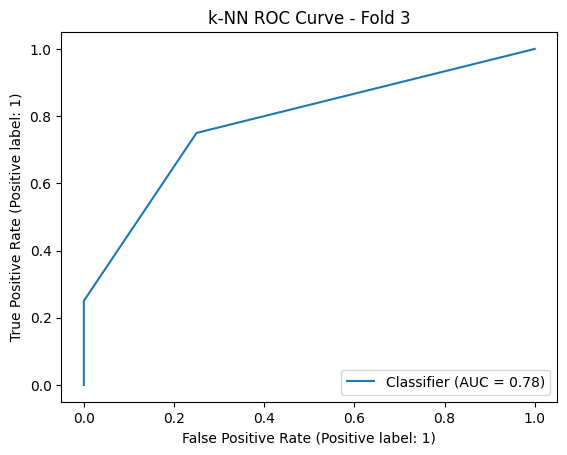

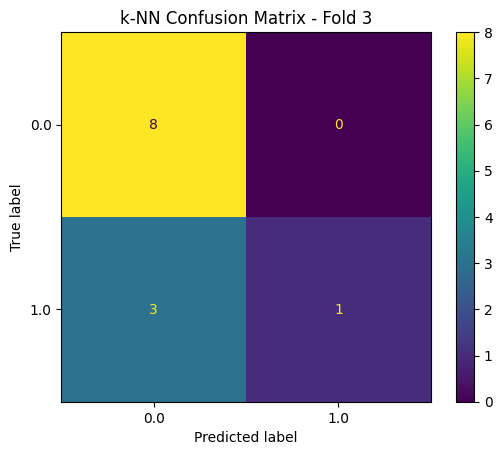

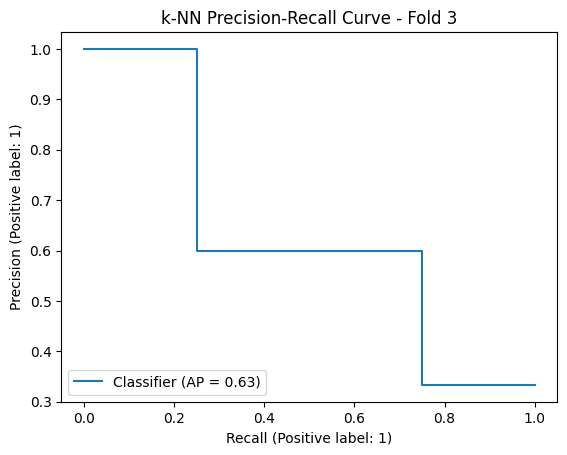

Random Forest Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0.]


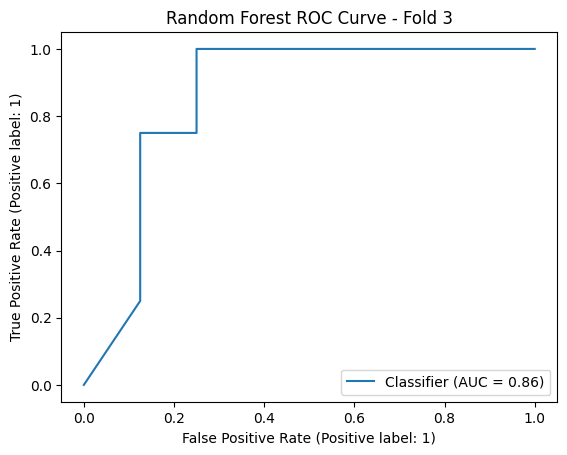

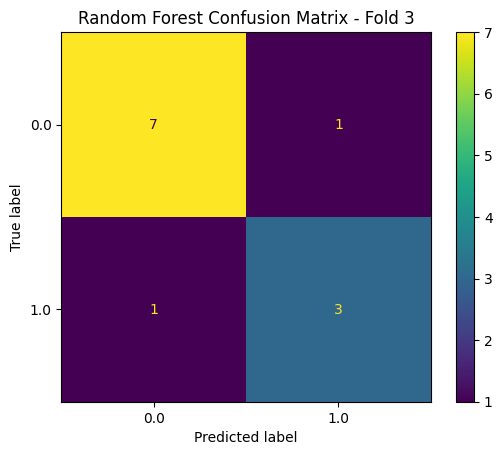

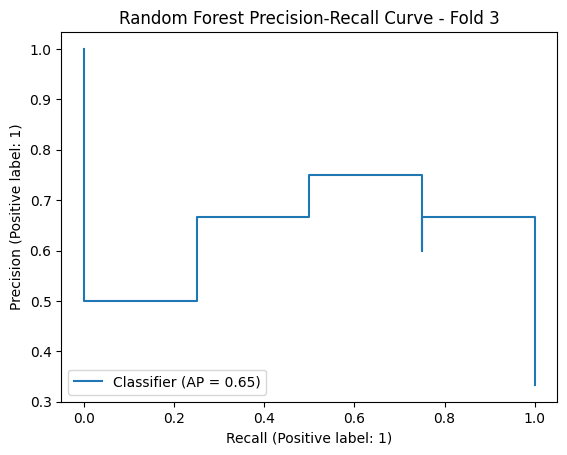

SVM Predictions: [1. 0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


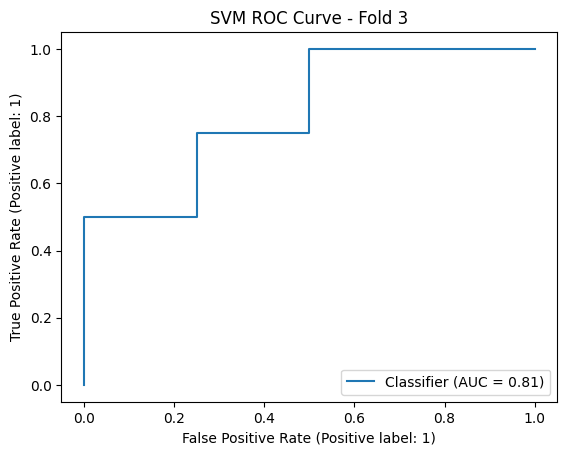

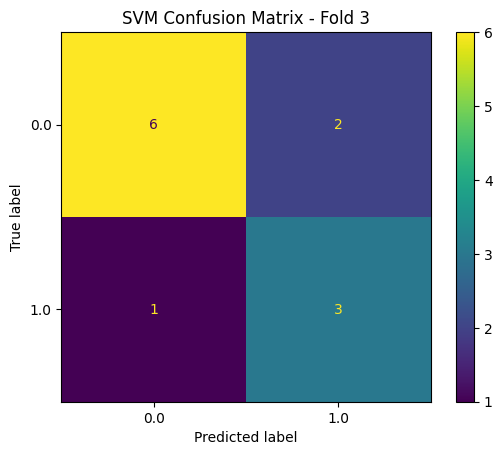

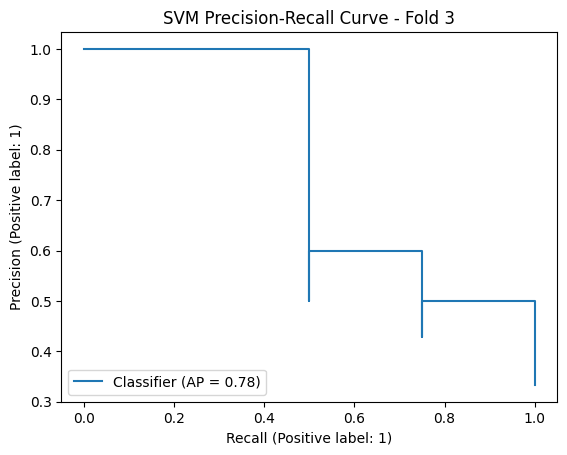

Fold 4 - TRAIN: [ 0  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 24 25 26 27
 28 30 31 32 33 34 36 38 41 42 44 45 47 49 50 51 52 53 54 55 56 57 58] TEST: [ 1  2 21 23 29 35 37 39 40 43 46 48]
Logistic Regression Predictions: [1. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1.]


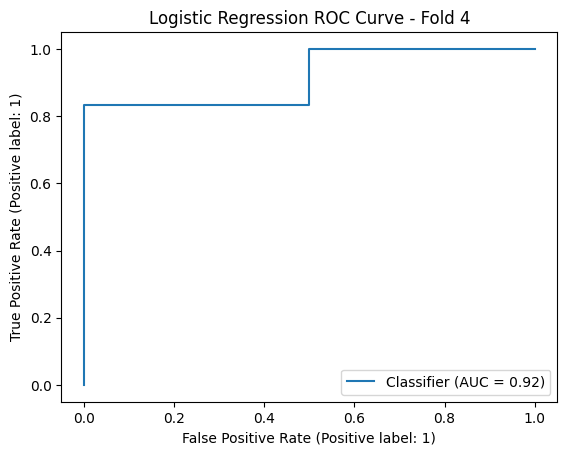

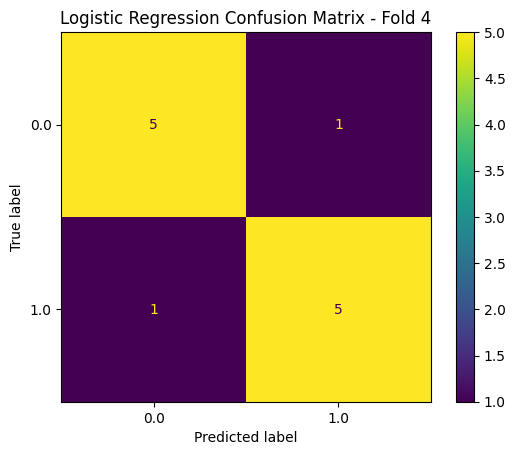

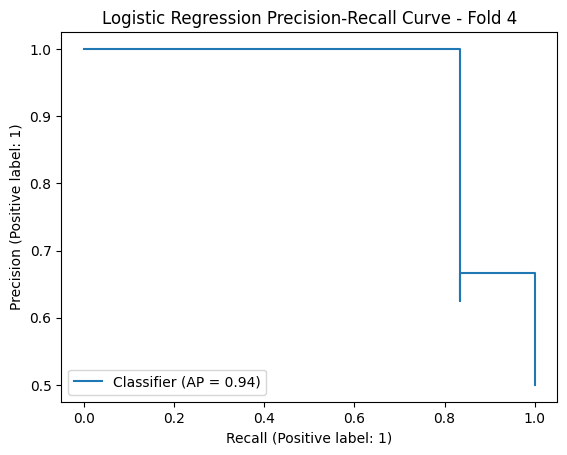

k-NN Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1.]


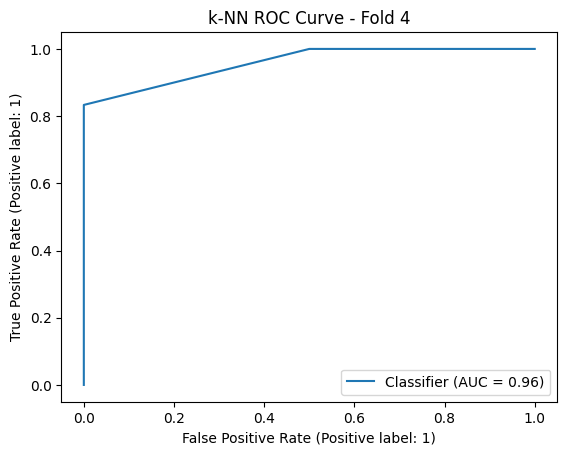

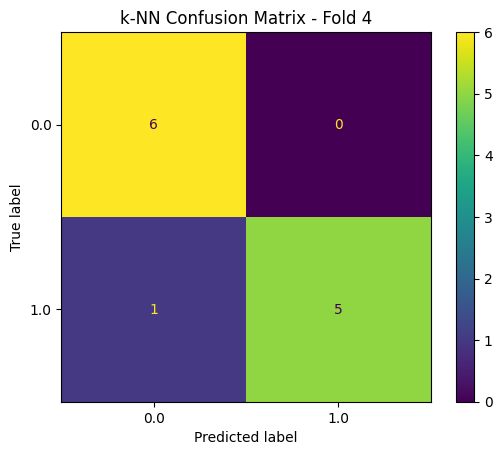

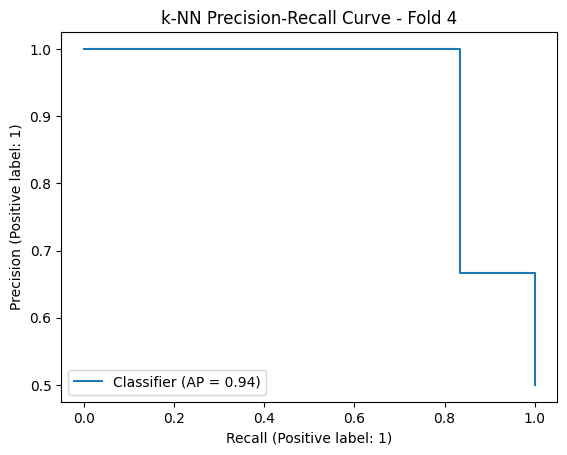

Random Forest Predictions: [1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1.]


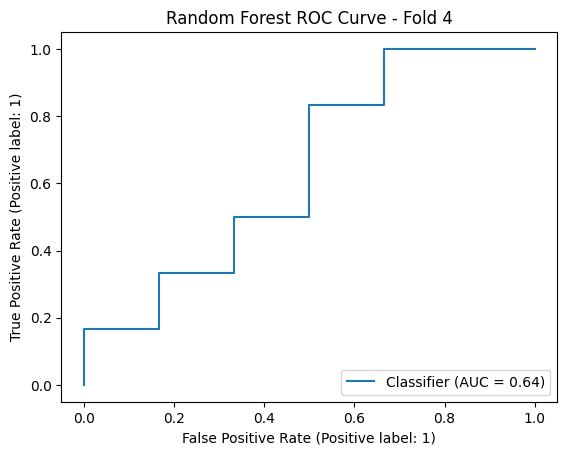

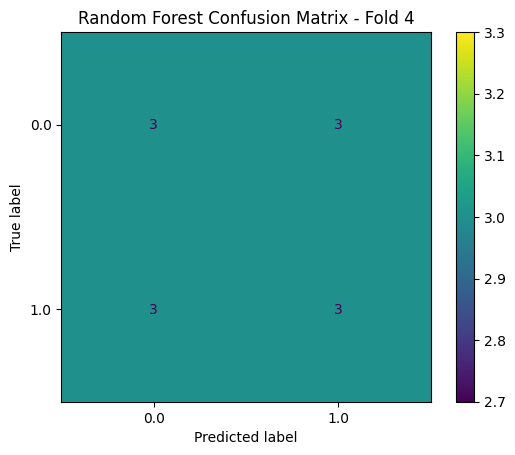

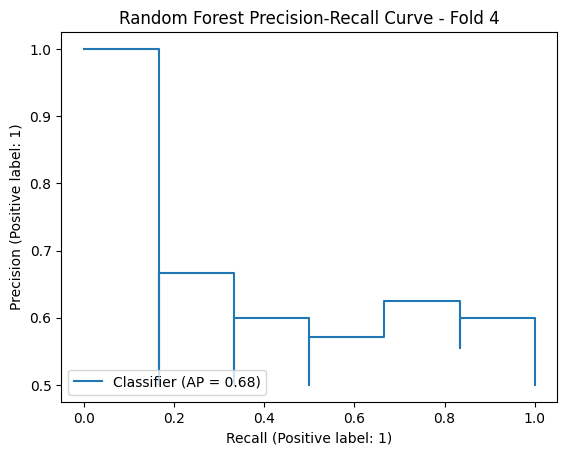

SVM Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


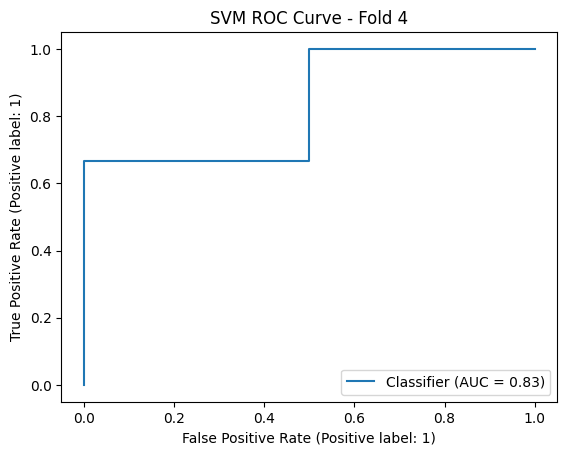

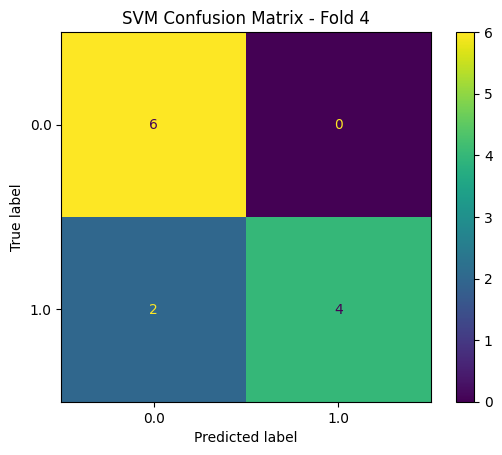

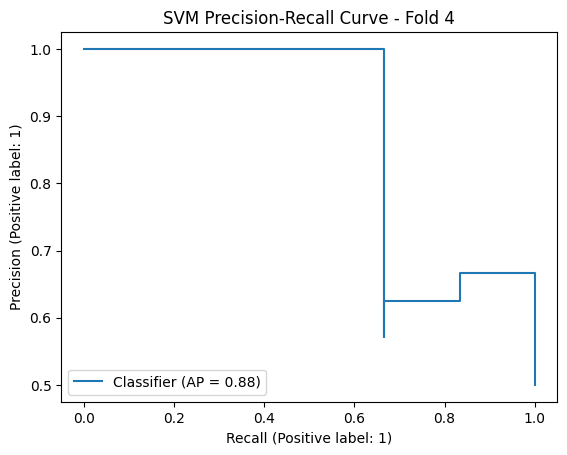

Fold 5 - TRAIN: [ 0  1  2  3  4  5  6  8  9 11 12 13 15 16 17 19 21 23 24 25 26 27 29 30
 31 32 33 34 35 36 37 39 40 41 43 44 45 46 47 48 49 50 52 53 54 55 56 57] TEST: [ 7 10 14 18 20 22 28 38 42 51 58]
Logistic Regression Predictions: [1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0.]


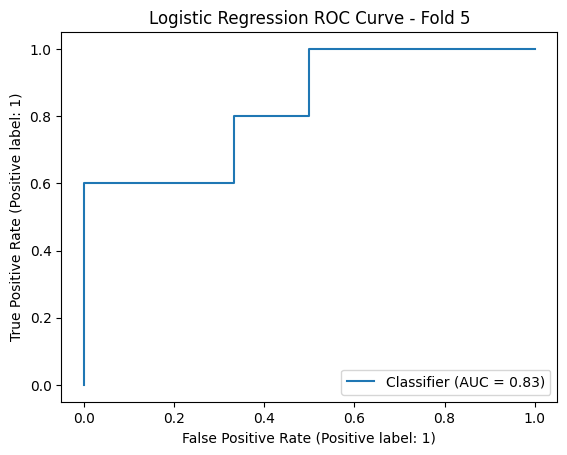

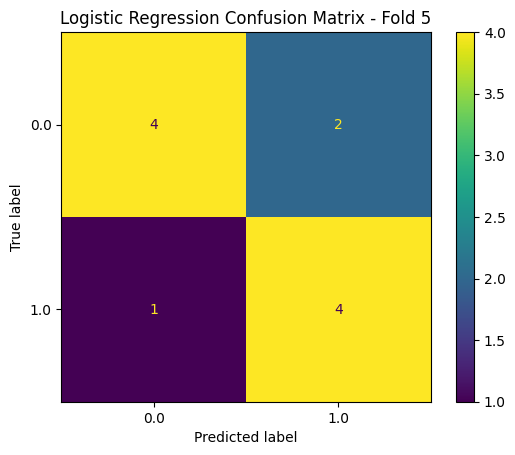

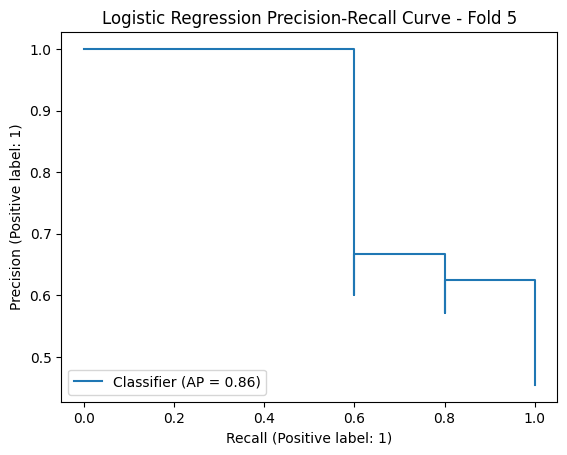

k-NN Predictions: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]


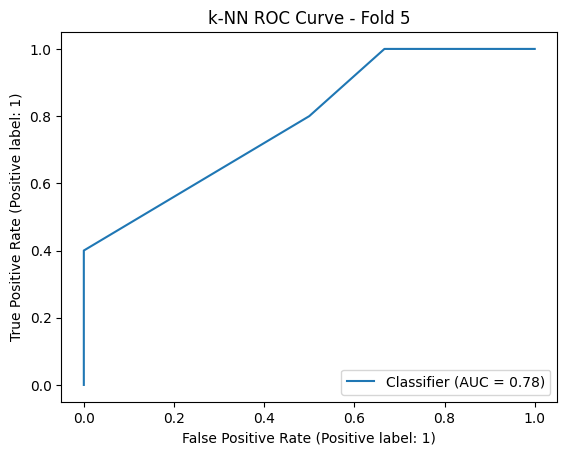

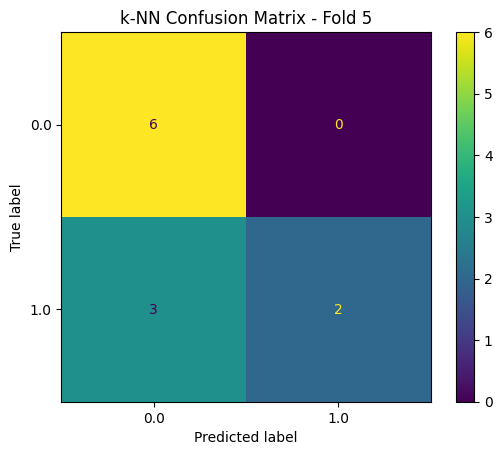

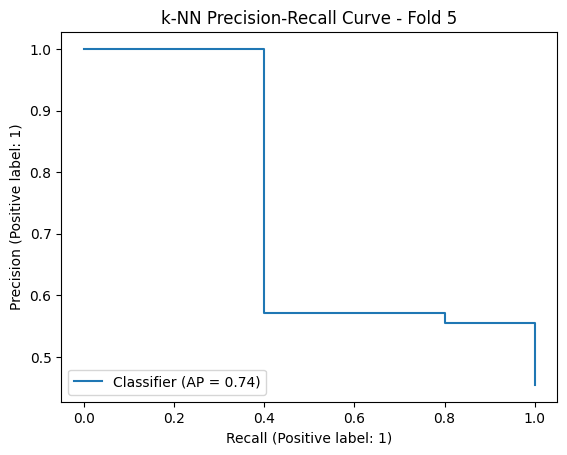

Random Forest Predictions: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]


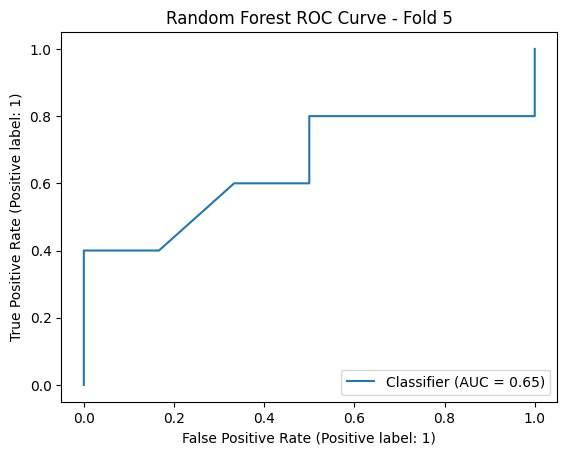

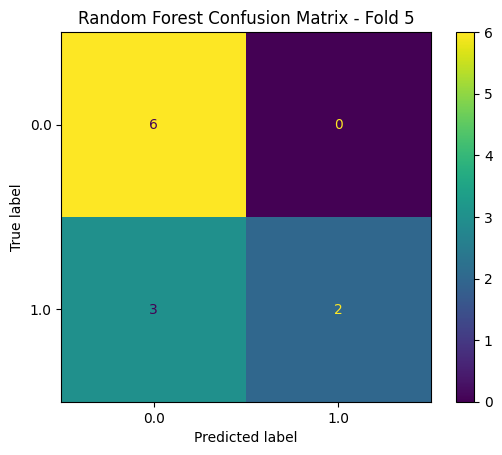

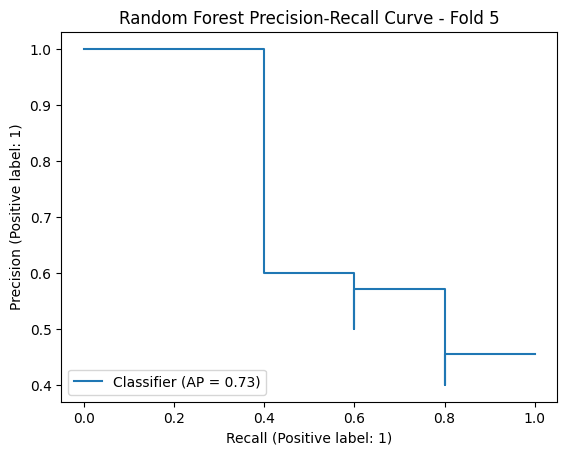

SVM Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


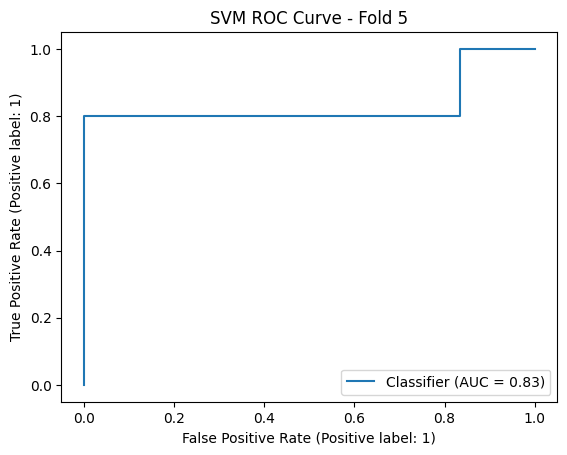

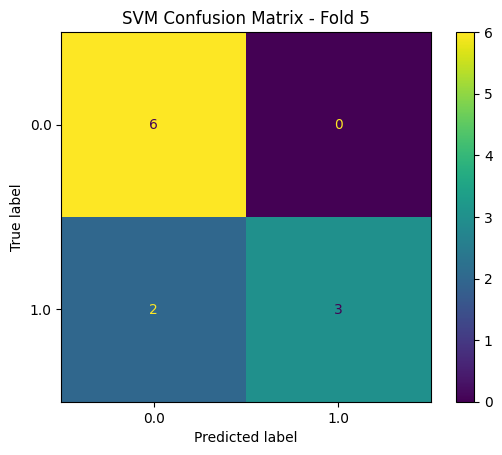

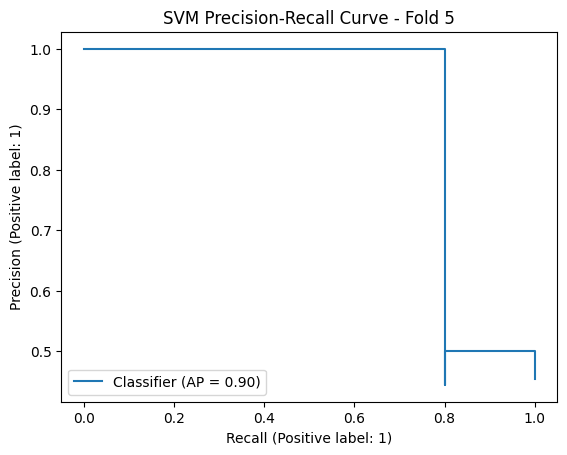


LR Mean train score: 1.0
LR Mean test score: 0.6962121212121212

KNN Mean train score: 0.8241134751773049
KNN Mean test score: 0.7287878787878789

RF train score: 1.0
RF Mean test score: 0.737878787878788

SVM Mean train score: 0.7436613475177306
SVM Mean test score: 0.7386363636363636


In [38]:
# Perform the cross-validation
for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    print(f"Fold {fold} - TRAIN:", train_index, "TEST:", test_index)
    # Splitting the data
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Standardization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Logistic Regression
    #-----------------------------------------------------------------------#
    LR = LogisticRegression(random_state=42).fit(X_train, y_train)
    score_tr_LR = LR.score(X_train, y_train)
    score_te_LR = LR.score(X_test, y_test)
    scores_train_LR.append(score_tr_LR)
    scores_test_LR.append(score_te_LR)
    y_pred_LR = LR.predict(X_test)
    print("Logistic Regression Predictions:", y_pred_LR)

    # ROC curve forLR
    y_prob_LR = LR.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for LR
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_LR)
    plt.title(f'Logistic Regression Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for LR
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression Precision-Recall Curve - Fold {fold}')
    plt.show()

    # KNN
    #-----------------------------------------------------------------------#
    knn = KNeighborsClassifier().fit(X_train, y_train)
    score_tr_KNN = knn.score(X_train, y_train)
    score_te_KNN = knn.score(X_test, y_test)
    scores_train_KNN.append(score_tr_KNN)
    scores_test_KNN.append(score_te_KNN)
    y_pred_KNN = knn.predict(X_test)
    print("k-NN Predictions:", y_pred_KNN)

    # ROC curve for KNN
    y_prob_KNN = knn.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for KNN
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_KNN)
    plt.title(f'k-NN Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for KNN
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN Precision-Recall Curve - Fold {fold}')
    plt.show()

    # Random Forest
    #-----------------------------------------------------------------------#
    rf = RandomForestClassifier(random_state=42).fit(X_train, y_train)
    score_tr_RF = rf.score(X_train, y_train)
    score_te_RF = rf.score(X_test, y_test)
    scores_train_RF.append(score_tr_RF)
    scores_test_RF.append(score_te_RF)
    y_pred_RF = rf.predict(X_test)
    print("Random Forest Predictions:", y_pred_RF)

    # ROC curve for RF
    y_prob_RF = rf.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for RF
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_RF)
    plt.title(f'Random Forest Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for RF
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest Precision-Recall Curve - Fold {fold}')
    plt.show()

    #SVM
    #-----------------------------------------------------------------------#
    svm = SVC(probability=True, random_state=42, C=0.1, gamma=0.1, kernel='sigmoid', class_weight=None).fit(X_train, y_train)
    score_tr_SVM = svm.score(X_train, y_train)
    score_te_SVM = svm.score(X_test, y_test)
    scores_train_SVM.append(score_tr_SVM)
    scores_test_SVM.append(score_te_SVM)
    y_pred_SVM = svm.predict(X_test)
    print("SVM Predictions:", y_pred_SVM)

    # ROC curve for SVM
    y_prob_SVM = svm.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for SVM
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_SVM)
    plt.title(f'SVM Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for SVM
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM Precision-Recall Curve - Fold {fold}')
    plt.show()


print()
print("LR Mean train score:", np.mean(scores_train_LR))
print("LR Mean test score:", np.mean(scores_test_LR))
print()
print("KNN Mean train score:", np.mean(scores_train_KNN))
print("KNN Mean test score:", np.mean(scores_test_KNN))
print()
print("RF train score:", np.mean(scores_train_RF))
print("RF Mean test score:", np.mean(scores_test_RF))
print()
print("SVM Mean train score:", np.mean(scores_train_SVM))
print("SVM Mean test score:", np.mean(scores_test_SVM))


In [39]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.01, 0.1, 1, 1.5, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'poly', 'sigmoid', 'linear'],
    'class_weight': ['balanced', None]

}

grid = GridSearchCV(SVC(probability=True), param_grid, refit=True, verbose=2)
grid.fit(X_train, y_train)

print(grid.best_params_)


Fitting 5 folds for each of 192 candidates, totalling 960 fits
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .C=0.01, class_weight=balanced, gamma=1, kernel=rbf; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=poly; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, gam

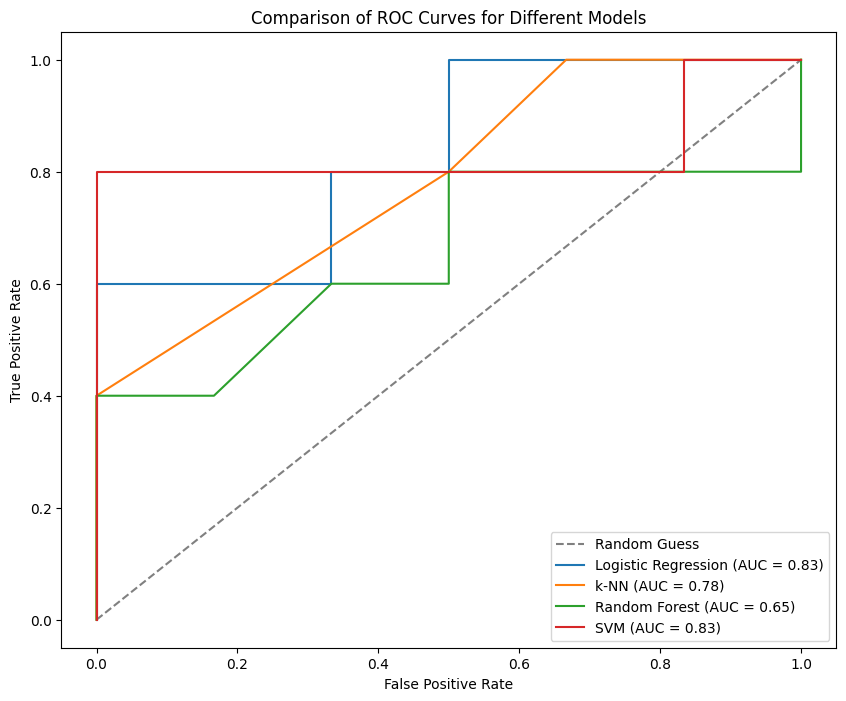

In [40]:
# Initialize the plot
plt.figure(figsize=(10, 8))

# Plot the random guess line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

# Plot ROC curves for Logistic Regression
y_prob_LR = LR.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_LR, ax=plt.gca(), name='Logistic Regression')

# Plot ROC curves for k-NN
y_prob_KNN = knn.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_KNN, ax=plt.gca(), name='k-NN')

# Plot ROC curves for Random Forest
y_prob_RF = rf.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_RF, ax=plt.gca(), name='Random Forest')

# Plot ROC curves for SVM
y_prob_SVM = svm.predict_proba(X_test)[:, 1]
RocCurveDisplay.from_predictions(y_test, y_prob_SVM, ax=plt.gca(), name='SVM')

# Add plot labels and title
plt.title('Comparison of ROC Curves for Different Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Show the plot
plt.show()


# Deep Learning

Epoch 1/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5669 - loss: 0.8334
Epoch 2/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7038 - loss: 0.5574
Epoch 3/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7973 - loss: 0.4263
Epoch 4/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9380 - loss: 0.2196
Epoch 5/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9815 - loss: 0.1611
Epoch 6/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9908 - loss: 0.1322
Epoch 7/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9632 - loss: 0.1154
Epoch 8/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9395 - loss: 0.0962
Epoch 9/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 1.0000 - loss: 0.0557
Epoch 10/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 1.0000 - loss: 0.0440
Epoch 11/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9830 - loss: 0.0534
Epoch 12/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 1.0000

Text(0.5, 1.0, 'Neural Network Precision-Recall Curve')

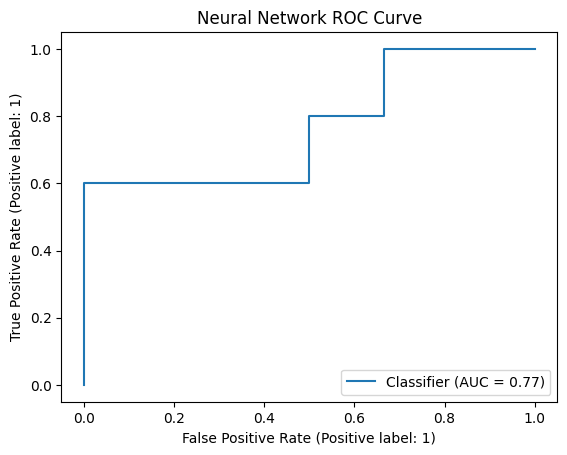

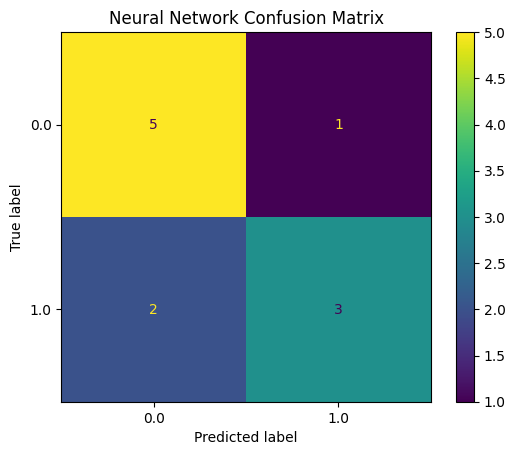

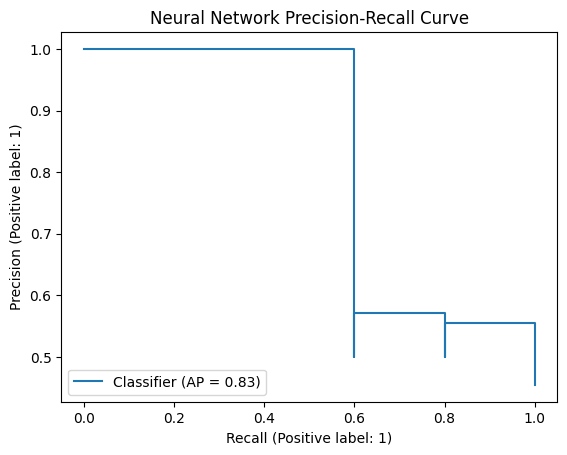

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay


# Define a simple neural network model for binary classification
nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))  # Input layer specifying input shape
nn_model.add(Dense(128, activation='relu'))
nn_model.add(Dropout(0.5))  # Dropout layer added
nn_model.add(Dense(64, activation='relu'))
#nn_model.add(Dropout(0.2))  # Dropout layer added
#nn_model.add(Dense(32, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

# Compile the model
nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=1, verbose=1)

# Evaluate the model
score_train_NN = nn_model.evaluate(X_train, y_train, verbose=0)[1]
score_test_NN = nn_model.evaluate(X_test, y_test, verbose=0)[1]

print(f"Neural Network Train Accuracy: {score_train_NN}")
print(f"Neural Network Test Accuracy: {score_test_NN}")

# Predictions for the neural network
y_prob_NN = nn_model.predict(X_test).flatten()
y_pred_NN = (y_prob_NN > 0.5).astype(int)

print("Neural Network Predictions:", y_pred_NN)

# ROC curve for Neural Network
RocCurveDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network ROC Curve')
#plt.show()

# Confusion Matrix for Neural Network
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_NN)
plt.title('Neural Network Confusion Matrix')
#plt.show()

# Precision-Recall curve for Neural Network
PrecisionRecallDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network Precision-Recall Curve')
#plt.show()


Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6841 - loss: 0.8057
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7288 - loss: 0.6412 
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8793 - loss: 0.4443 
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9652 - loss: 0.3394 
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9469 - loss: 0.2792
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9521 - loss: 0.2180
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1598 
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1617 
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0978 
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0864 
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0787 
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0

Text(0.5, 1.0, 'Neural Network Precision-Recall Curve')

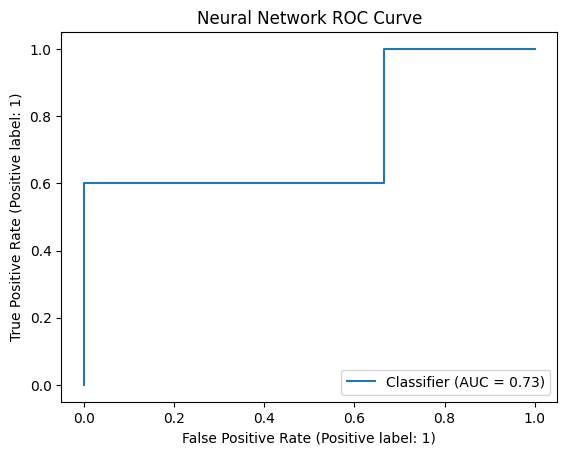

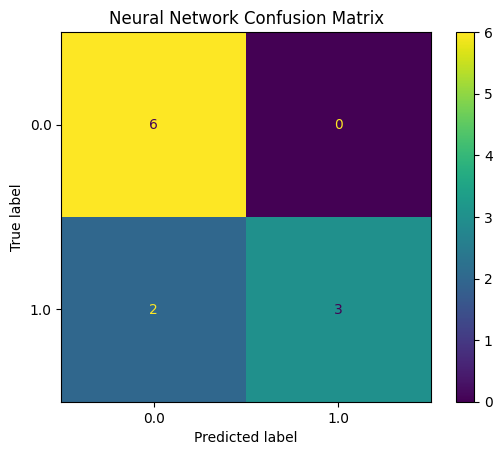

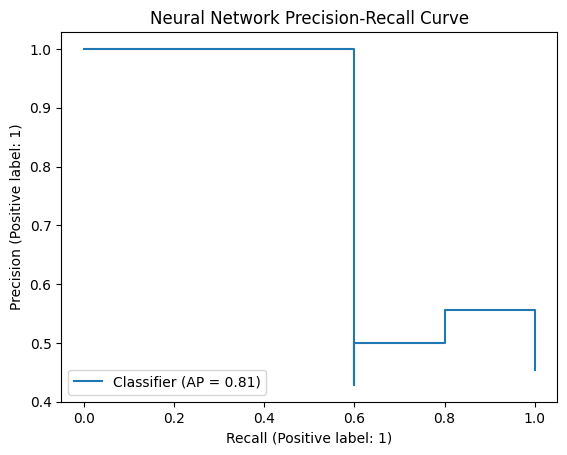

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay


# Define a simple neural network model for binary classification
nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))  # Input layer specifying input shape
nn_model.add(Dense(64, activation='relu'))
#nn_model.add(Dropout(0.5))  # Dropout layer added
nn_model.add(Dense(32, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

# Compile the model
nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=3, verbose=1)

# Evaluate the model
score_train_NN = nn_model.evaluate(X_train, y_train, verbose=0)[1]
score_test_NN = nn_model.evaluate(X_test, y_test, verbose=0)[1]

print(f"Neural Network Train Accuracy: {score_train_NN}")
print(f"Neural Network Test Accuracy: {score_test_NN}")

# Predictions for the neural network
y_prob_NN = nn_model.predict(X_test).flatten()
y_pred_NN = (y_prob_NN > 0.5).astype(int)

print("Neural Network Predictions:", y_pred_NN)

# ROC curve for Neural Network
RocCurveDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network ROC Curve')
#plt.show()

# Confusion Matrix for Neural Network
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_NN)
plt.title('Neural Network Confusion Matrix')
#plt.show()

# Precision-Recall curve for Neural Network
PrecisionRecallDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network Precision-Recall Curve')
#plt.show()


Epoch 1/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6329 - loss: 0.7224
Epoch 2/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8754 - loss: 0.5425
Epoch 3/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9651 - loss: 0.2191
Epoch 4/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9400 - loss: 0.1716
Epoch 5/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9522 - loss: 0.1881
Epoch 6/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 1.0000 - loss: 0.0656
Epoch 7/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9086 - loss: 0.1006
Epoch 8/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0247
Epoch 9/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0197
Epoch 10/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0084
Epoch 11/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0073
Epoch 12/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - lo

Neural Network Train Accuracy: 1.0
Neural Network Test Accuracy: 0.6363636255264282
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Neural Network Predictions: [0 0 1 1 0 1 1 0 1 0 0]


Text(0.5, 1.0, 'Neural Network Precision-Recall Curve')

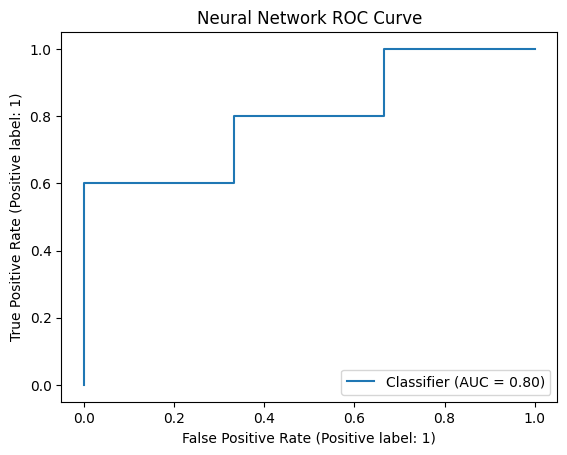

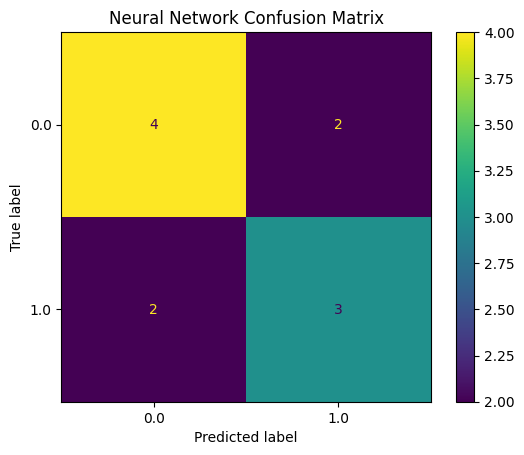

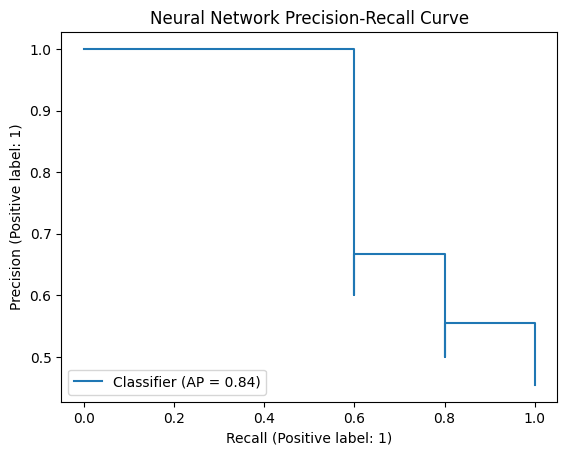

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay


# Define a simple neural network model for binary classification
nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))  # Input layer specifying input shape
nn_model.add(Dense(256, activation='relu'))
nn_model.add(Dropout(0.5))  # Dropout layer added
nn_model.add(Dense(128, activation='relu'))
nn_model.add(Dropout(0.5))  # Dropout layer added
nn_model.add(Dense(64, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

# Compile the model
nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
nn_model.fit(X_train, y_train, epochs=50, batch_size=1, verbose=1)

# Evaluate the model
score_train_NN = nn_model.evaluate(X_train, y_train, verbose=0)[1]
score_test_NN = nn_model.evaluate(X_test, y_test, verbose=0)[1]

print(f"Neural Network Train Accuracy: {score_train_NN}")
print(f"Neural Network Test Accuracy: {score_test_NN}")

# Predictions for the neural network
y_prob_NN = nn_model.predict(X_test).flatten()
y_pred_NN = (y_prob_NN > 0.5).astype(int)

print("Neural Network Predictions:", y_pred_NN)

# ROC curve for Neural Network
RocCurveDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network ROC Curve')
#plt.show()

# Confusion Matrix for Neural Network
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_NN)
plt.title('Neural Network Confusion Matrix')
#plt.show()

# Precision-Recall curve for Neural Network
PrecisionRecallDisplay.from_predictions(y_test, y_prob_NN)
plt.title('Neural Network Precision-Recall Curve')
#plt.show()


## Cross Validation including SVM and NN (without SSPG)


Fold 1 - TRAIN: [ 1  2  4  6  7  8  9 10 11 14 15 16 17 18 19 20 21 22 23 24 26 27 28 29
 30 31 32 33 35 36 37 38 39 40 41 42 43 44 46 48 50 51 52 54 55 56 58] TEST: [ 0  3  5 12 13 25 34 45 47 49 53 57]
Logistic Regression Predictions: [0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1.]


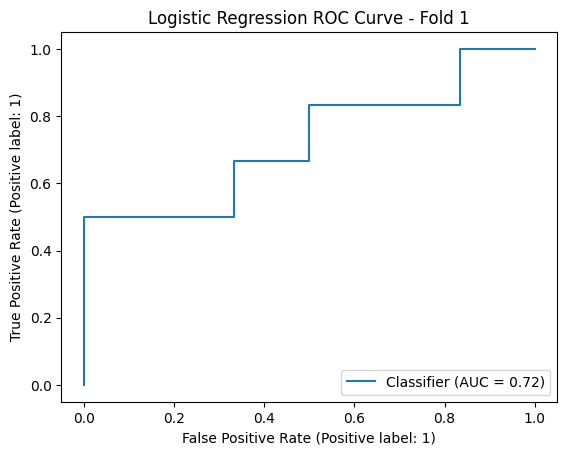

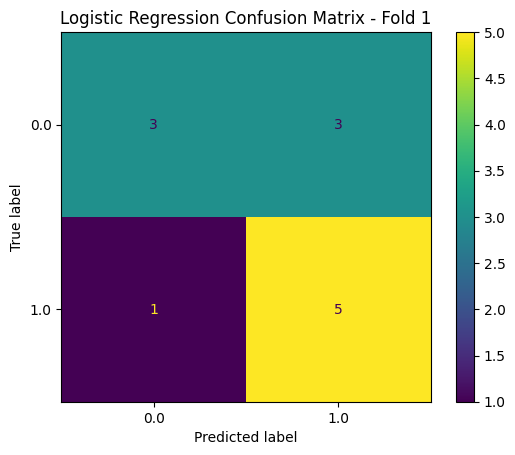

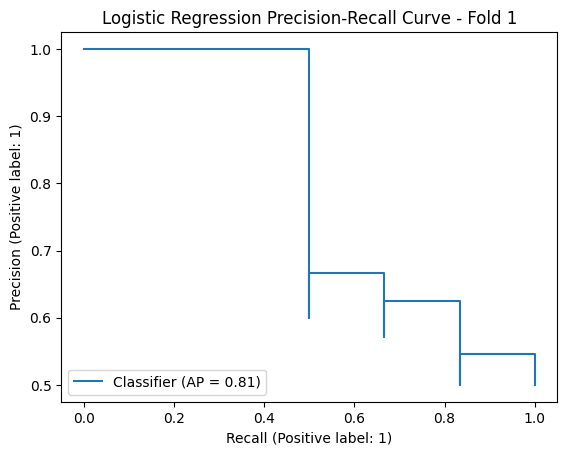

k-NN Predictions: [0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]


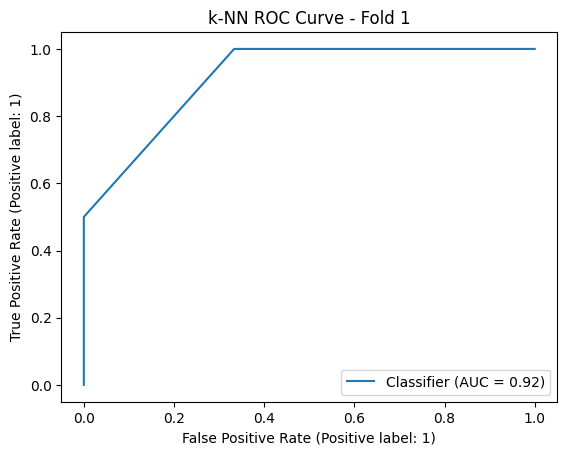

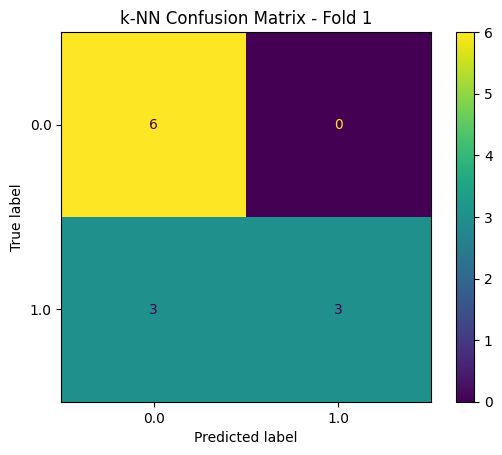

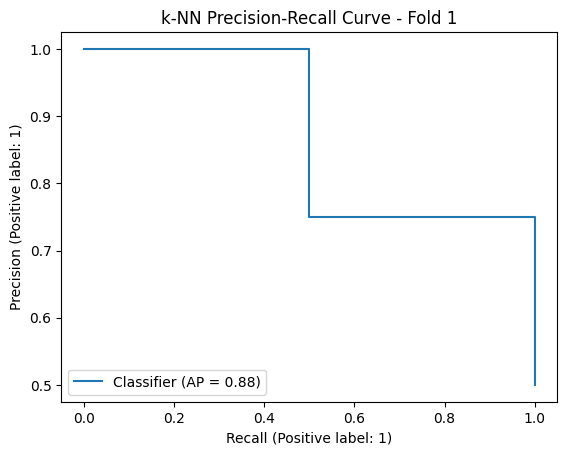

Random Forest Predictions: [0. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 1.]


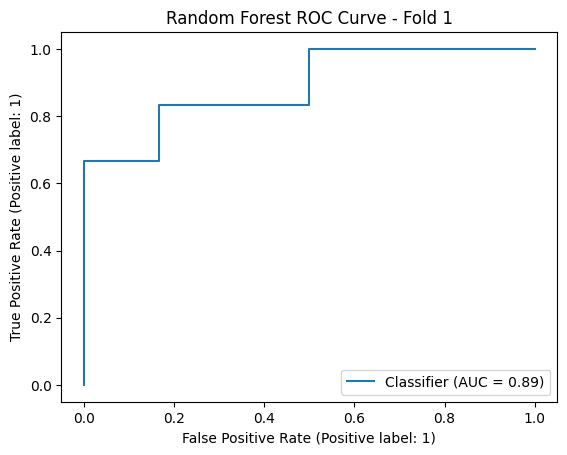

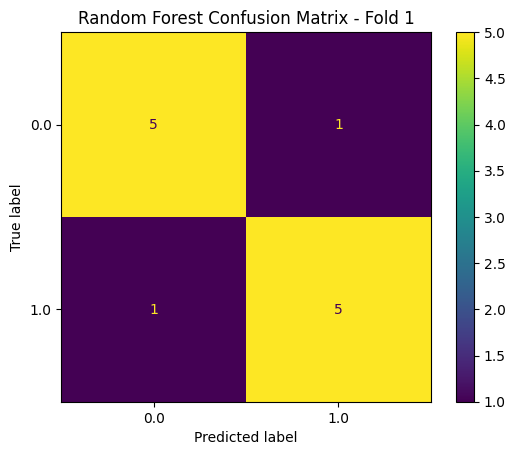

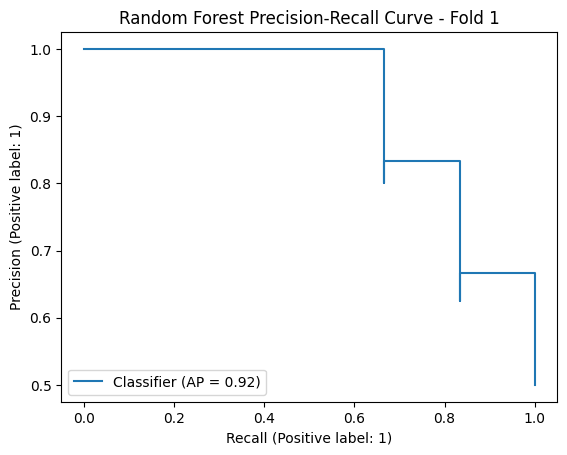

SVM Predictions: [0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1.]


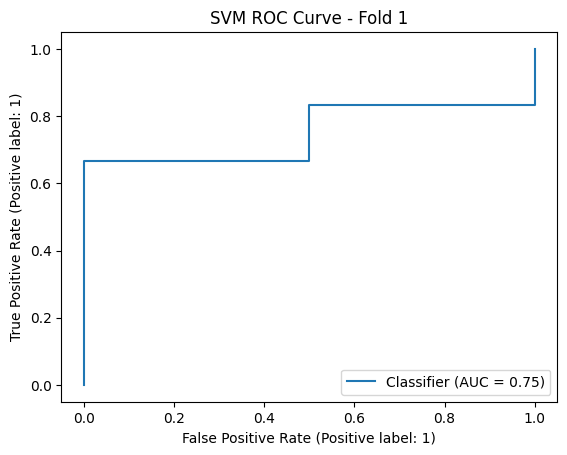

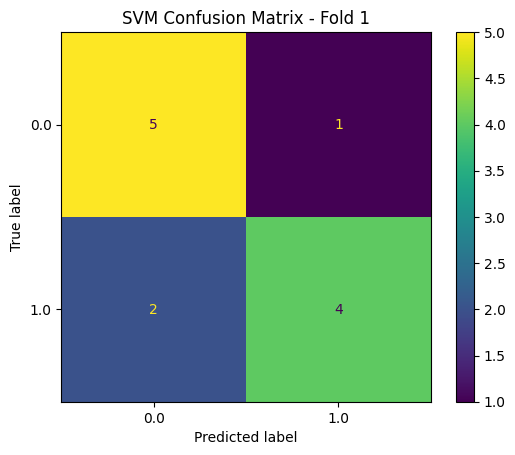

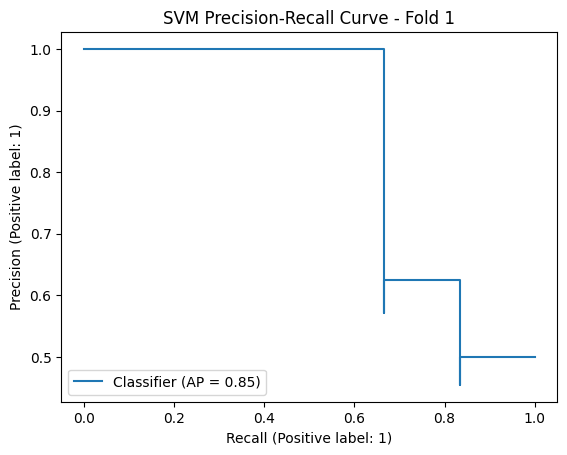

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3796 - loss: 0.9067
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8204 - loss: 0.5684 
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9442 - loss: 0.4704 
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9857 - loss: 0.3179 
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9733 - loss: 0.2618 
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9933 - loss: 0.2163 
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9857 - loss: 0.1550  
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.1091 
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0997 
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0703  
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0742 
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy:

Neural Network Train Accuracy: 1.0
Neural Network Test Accuracy: 0.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Neural Network Predictions: [0 1 0 1 1 1 1 0 1 0 1 0]


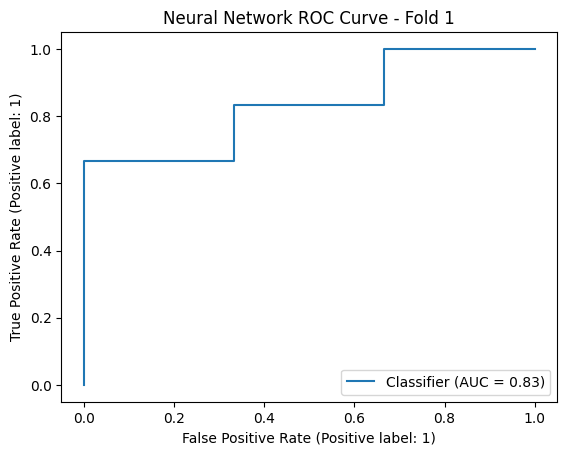

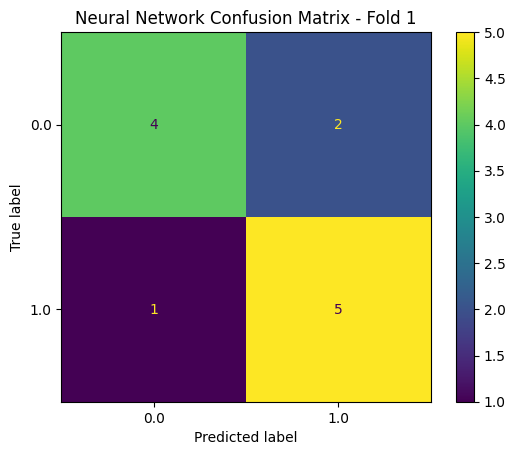

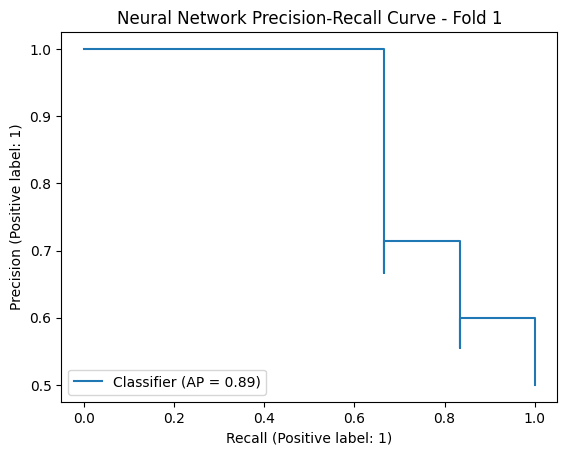

Fold 2 - TRAIN: [ 0  1  2  3  5  7  9 10 11 12 13 14 15 16 18 20 21 22 23 24 25 26 27 28
 29 32 33 34 35 37 38 39 40 41 42 43 45 46 47 48 49 51 52 53 56 57 58] TEST: [ 4  6  8 17 19 30 31 36 44 50 54 55]
Logistic Regression Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0.]


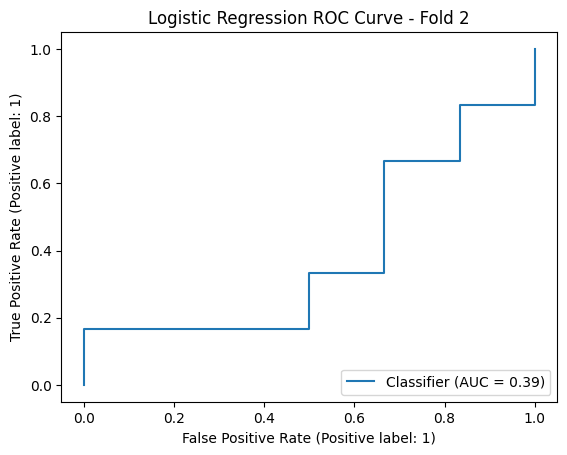

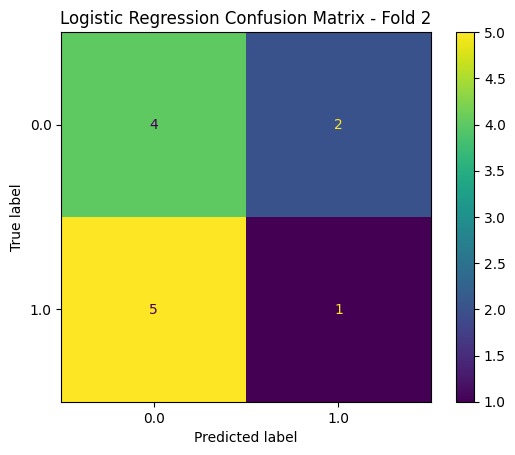

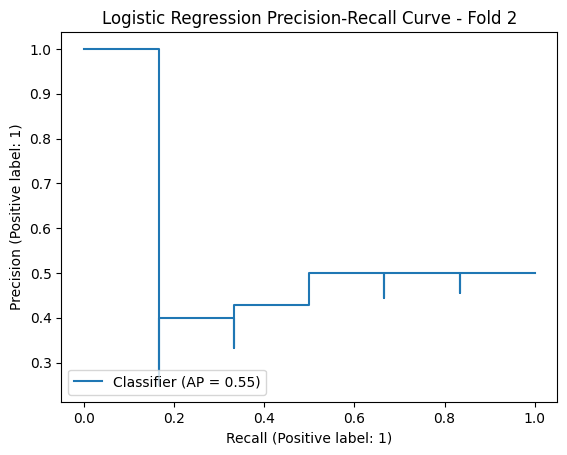

k-NN Predictions: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


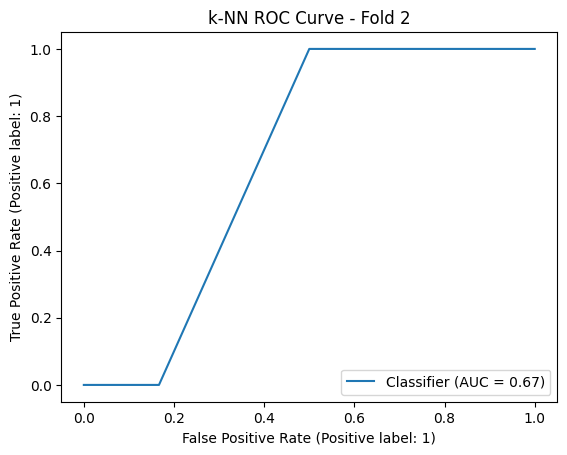

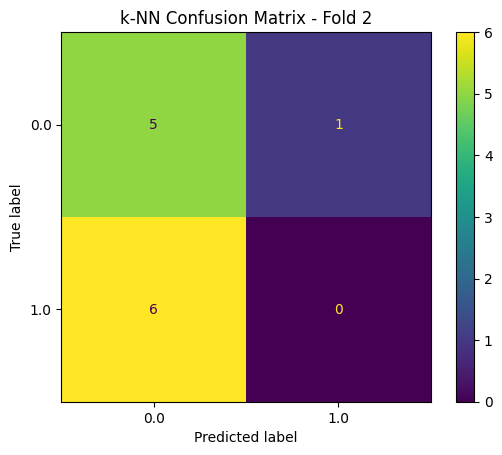

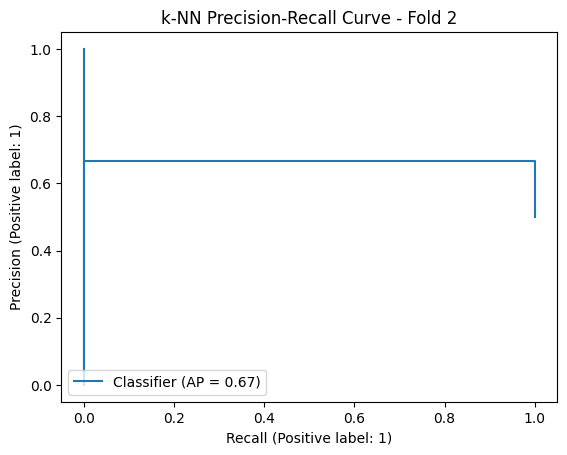

Random Forest Predictions: [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


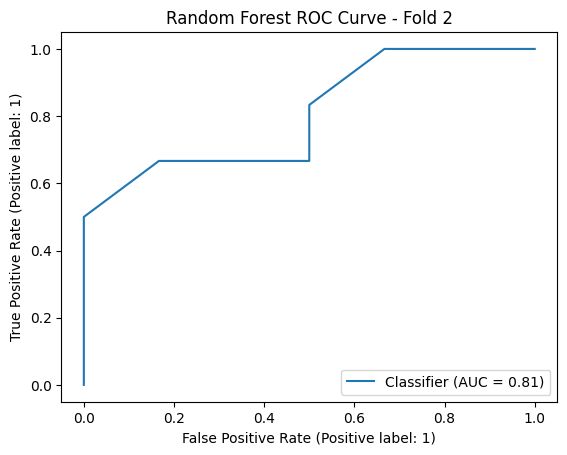

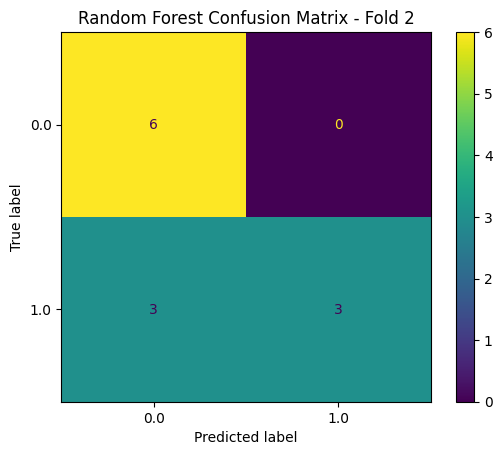

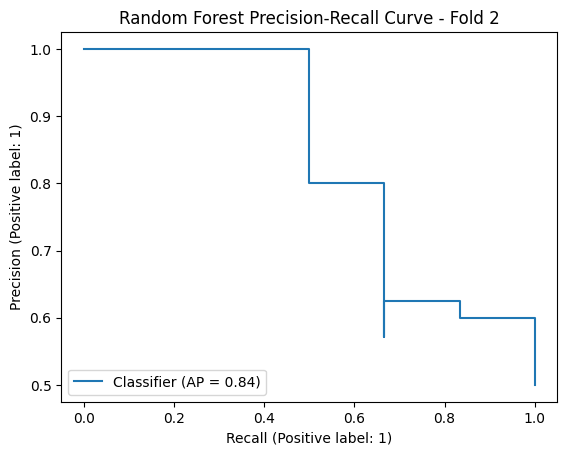

SVM Predictions: [1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]


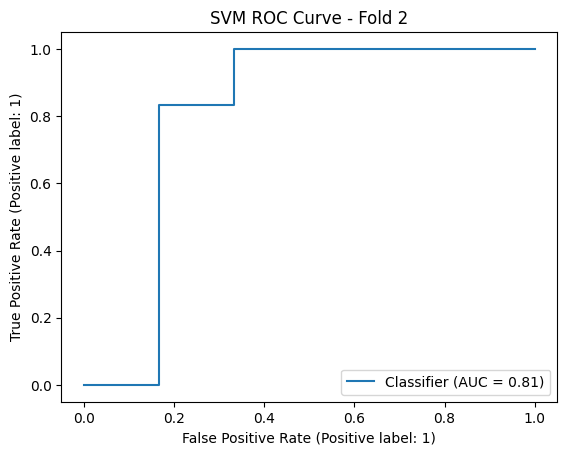

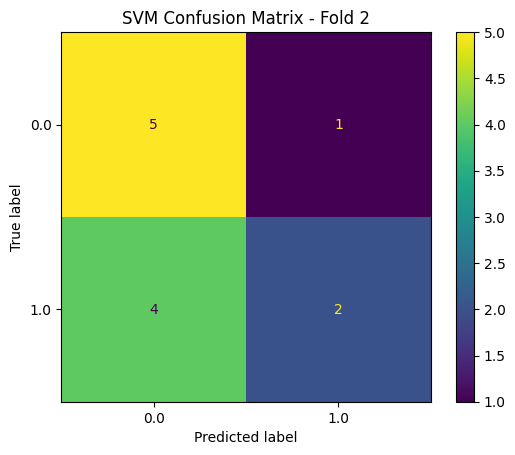

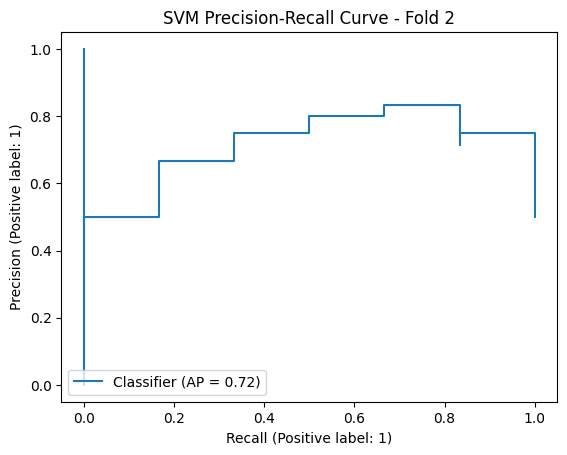

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7554 - loss: 0.5532
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9475 - loss: 0.3900 
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9566 - loss: 0.3068  
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9815 - loss: 0.2582 
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9476 - loss: 0.2082  
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9833 - loss: 0.1428 
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9879 - loss: 0.1167  
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.1042  
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0907 
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0835 
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0419 
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accurac

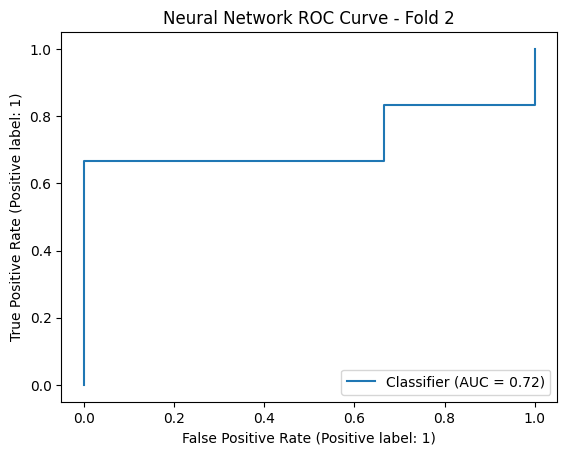

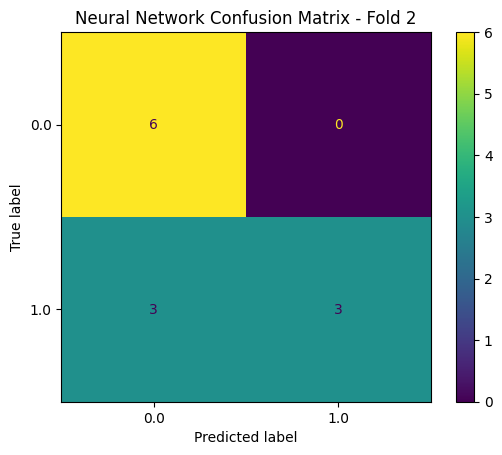

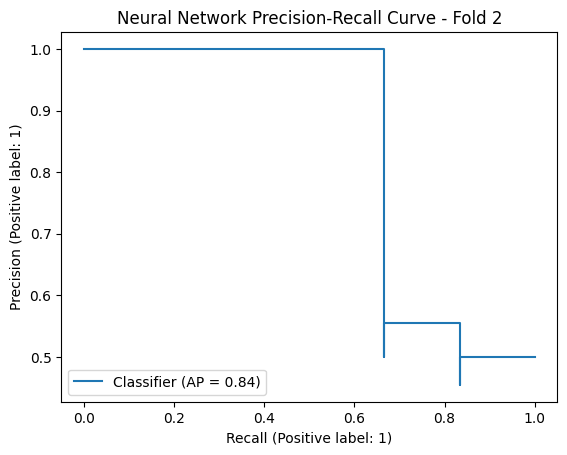

Fold 3 - TRAIN: [ 0  1  2  3  4  5  6  7  8 10 12 13 14 17 18 19 20 21 22 23 25 28 29 30
 31 34 35 36 37 38 39 40 42 43 44 45 46 47 48 49 50 51 53 54 55 57 58] TEST: [ 9 11 15 16 24 26 27 32 33 41 52 56]
Logistic Regression Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0.]


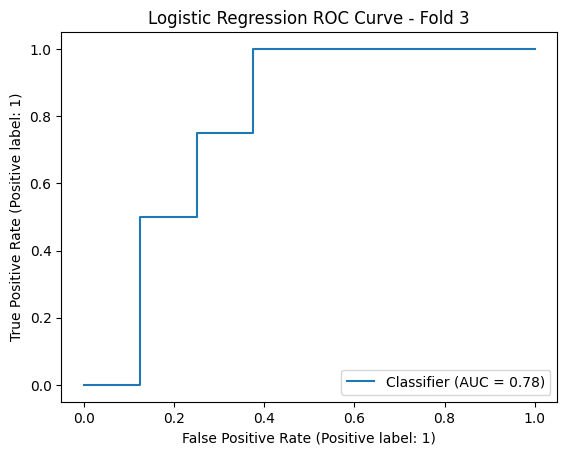

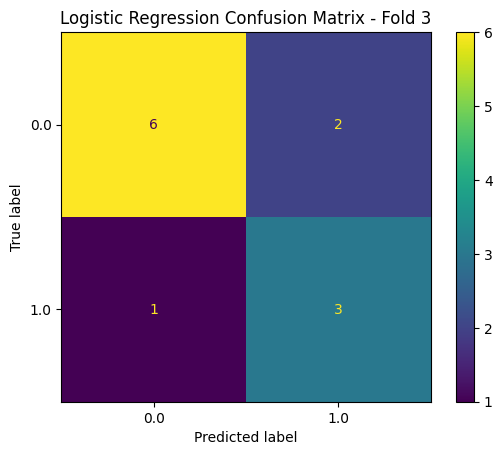

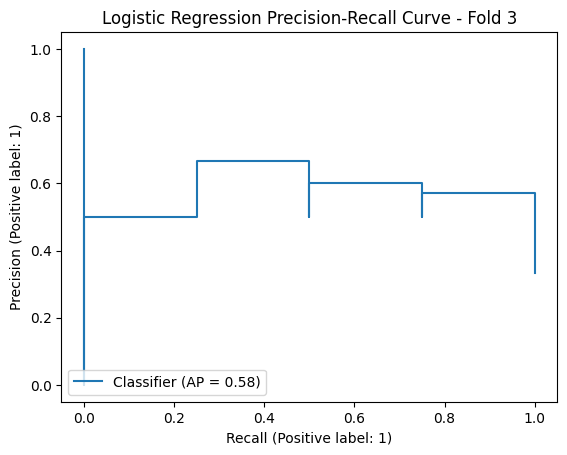

k-NN Predictions: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


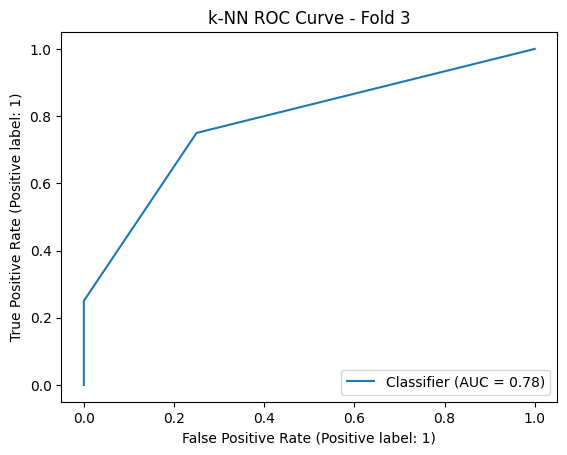

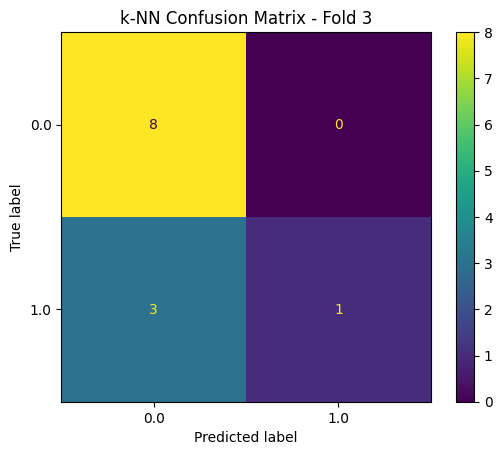

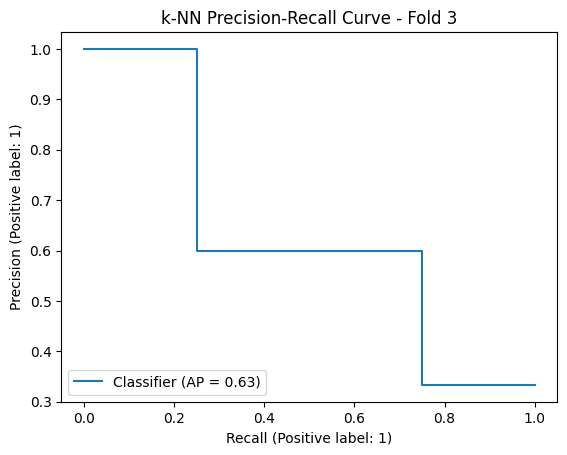

Random Forest Predictions: [1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0.]


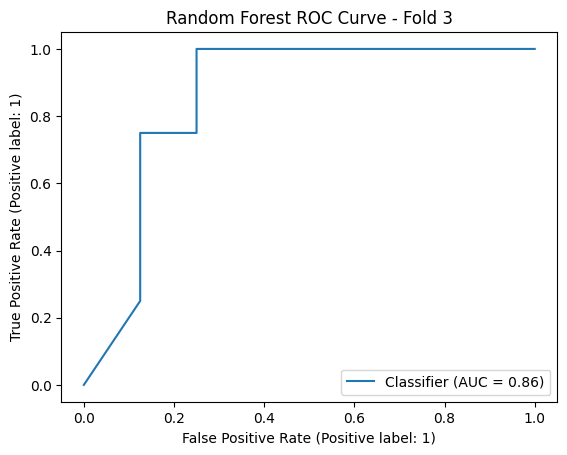

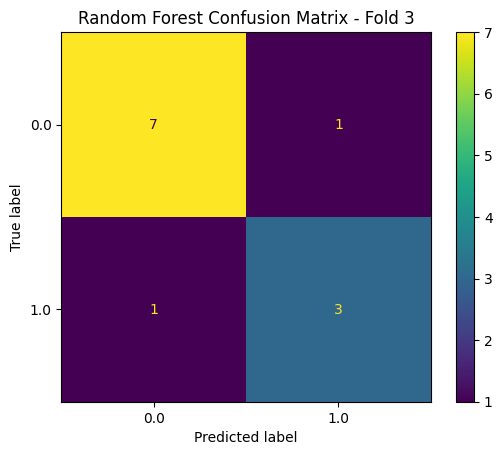

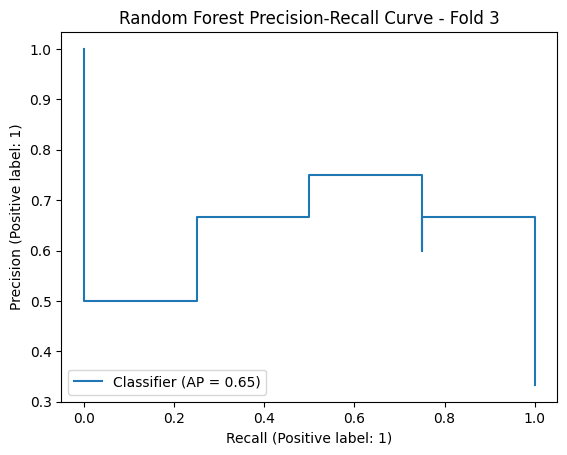

SVM Predictions: [1. 0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


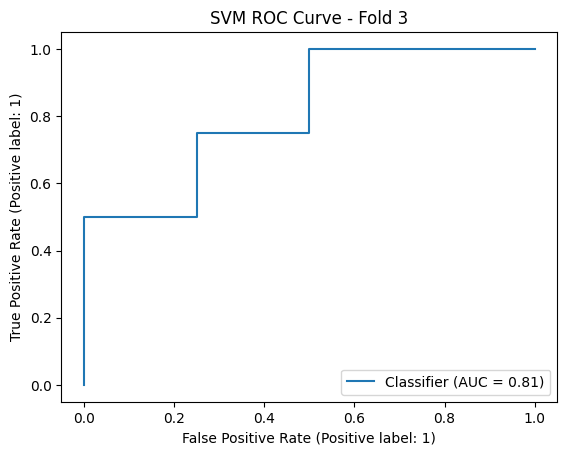

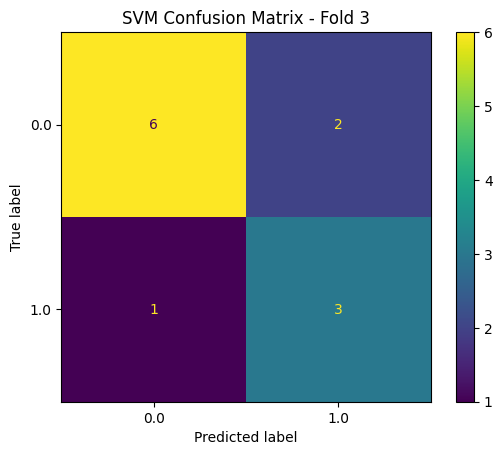

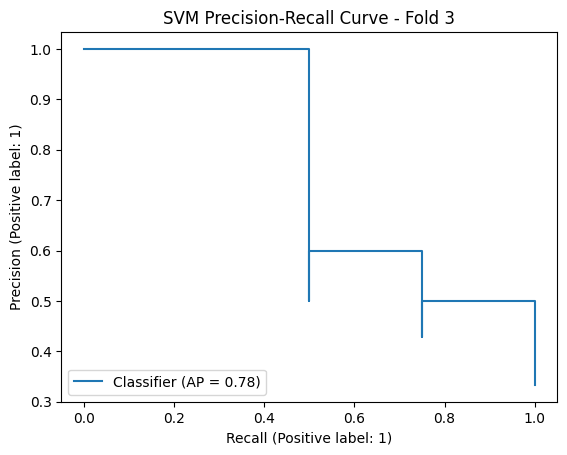

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5833 - loss: 0.9162
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6067 - loss: 0.6225 
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8397 - loss: 0.3911
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8622 - loss: 0.3529 
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9274 - loss: 0.3160 
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9542 - loss: 0.2230 
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9526 - loss: 0.1886  
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9356 - loss: 0.1741 
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9497 - loss: 0.1310 
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9353 - loss: 0.1263 
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9733 - loss: 0.0800 
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1

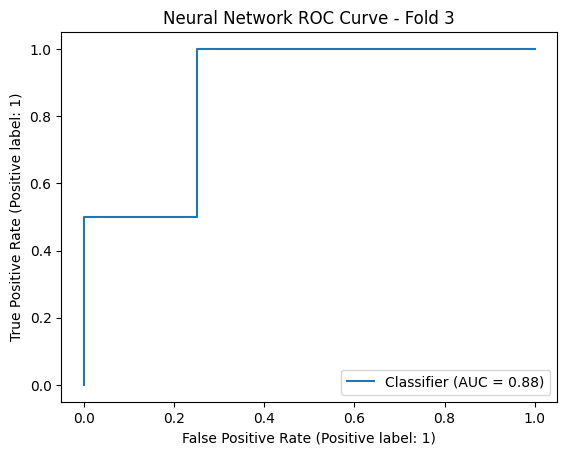

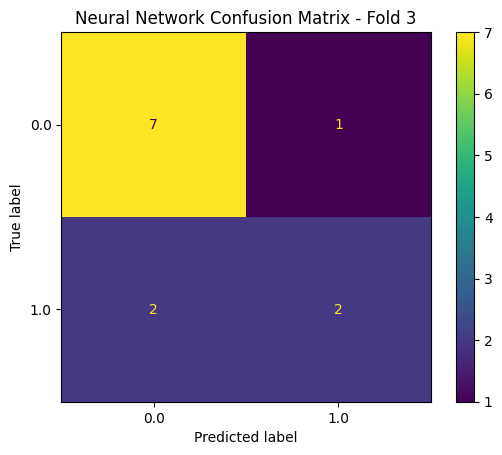

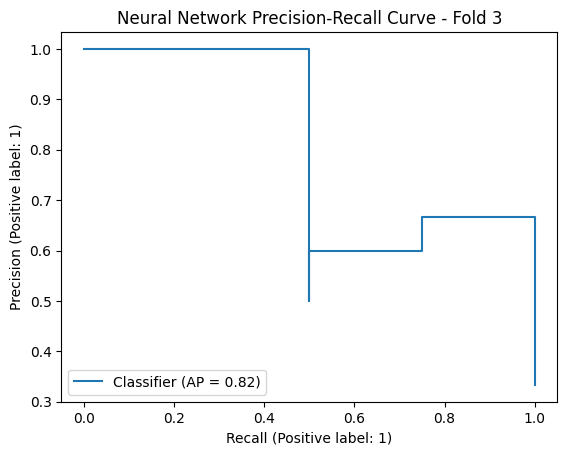

Fold 4 - TRAIN: [ 0  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 24 25 26 27
 28 30 31 32 33 34 36 38 41 42 44 45 47 49 50 51 52 53 54 55 56 57 58] TEST: [ 1  2 21 23 29 35 37 39 40 43 46 48]
Logistic Regression Predictions: [1. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1.]


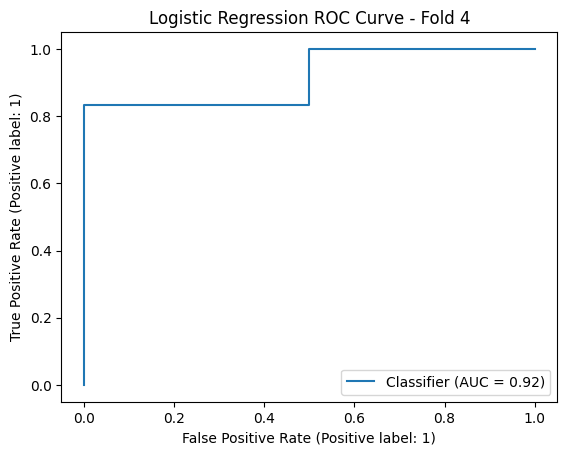

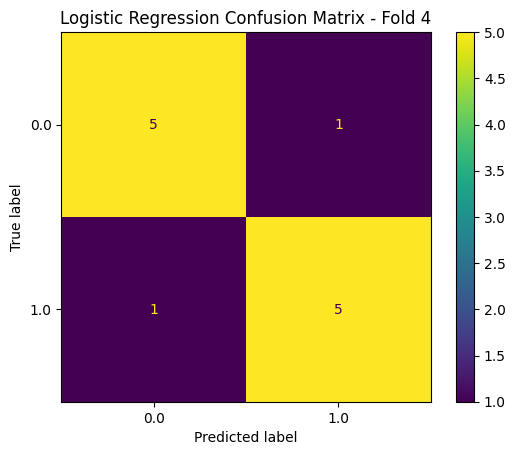

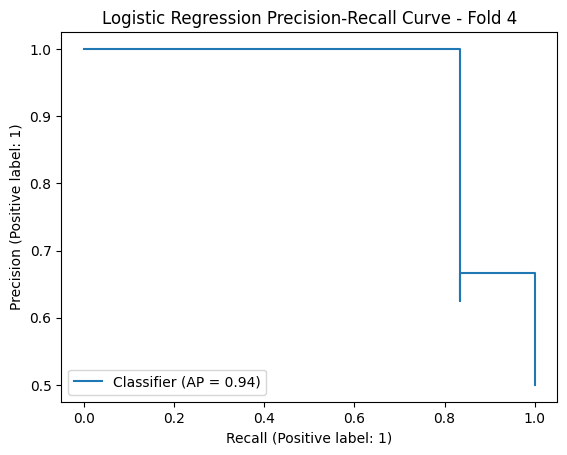

k-NN Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1.]


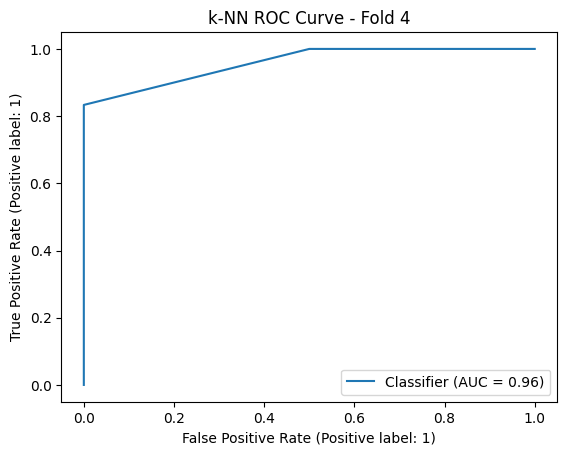

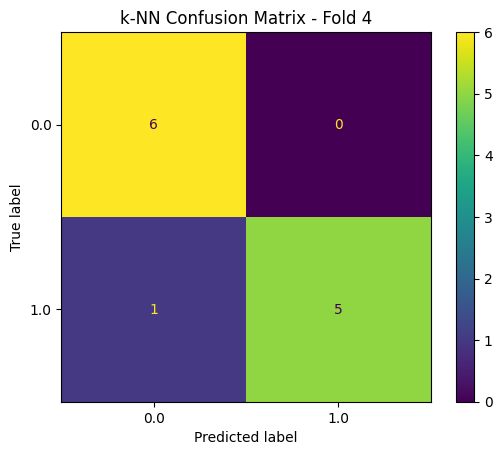

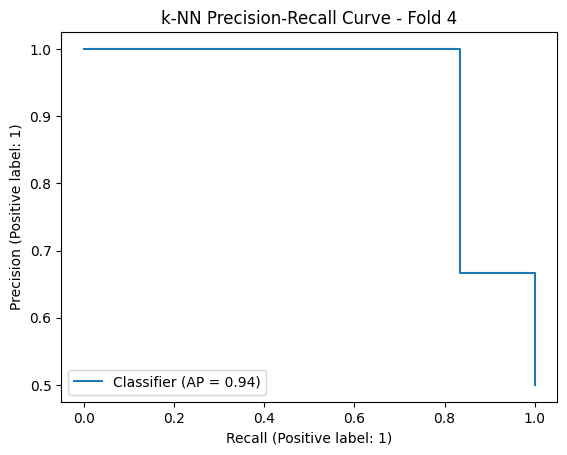

Random Forest Predictions: [1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1.]


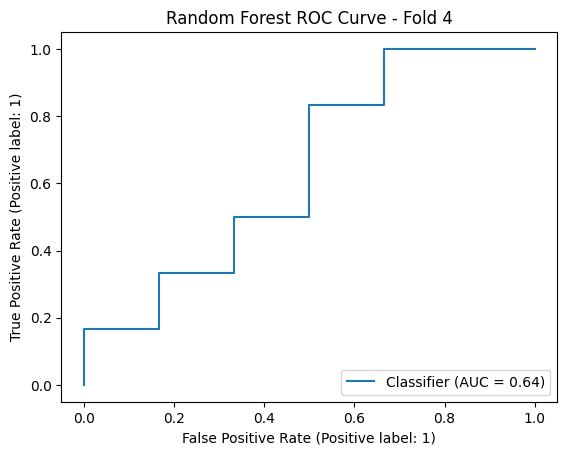

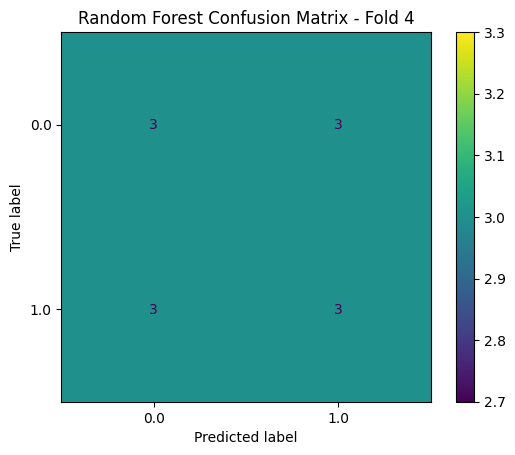

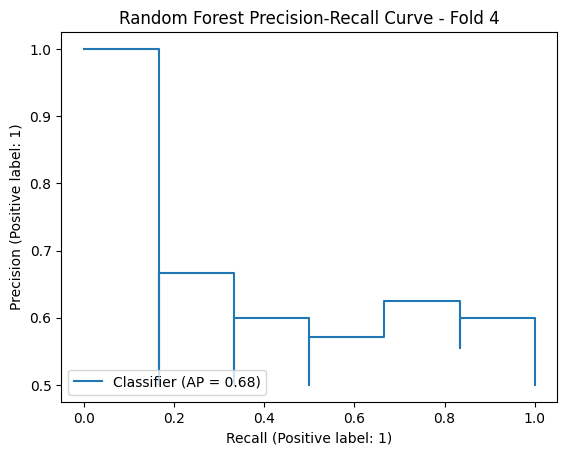

SVM Predictions: [1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1.]


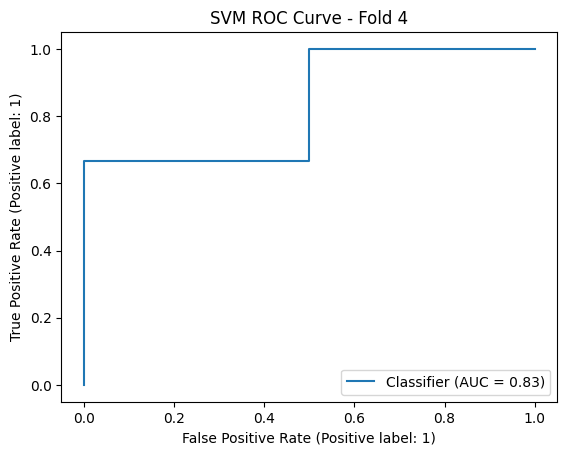

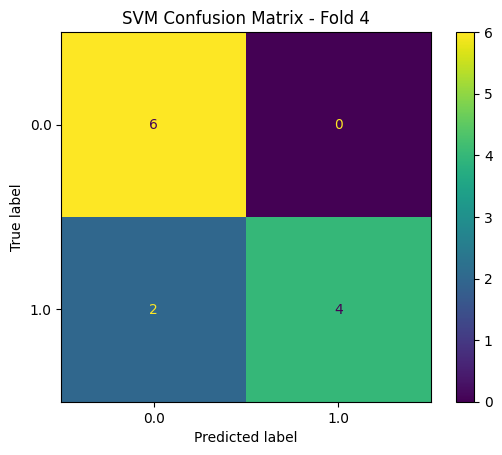

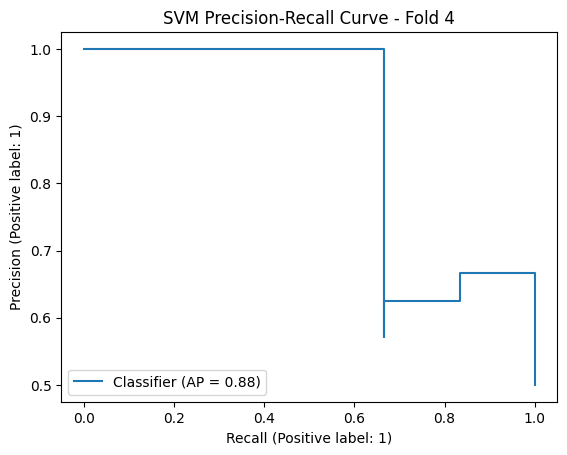

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5312 - loss: 0.6886
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9308 - loss: 0.4620 
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9733 - loss: 0.3463 
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9772 - loss: 0.2756 
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9772 - loss: 0.2070 
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9684 - loss: 0.1568  
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9933 - loss: 0.1106 
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9857 - loss: 0.1072
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0601 
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0682 
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0472 
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1

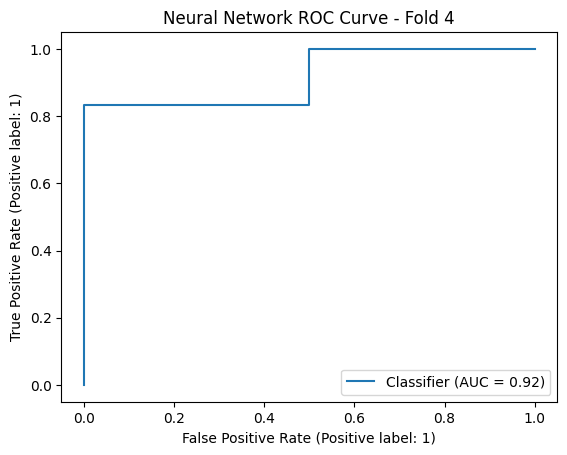

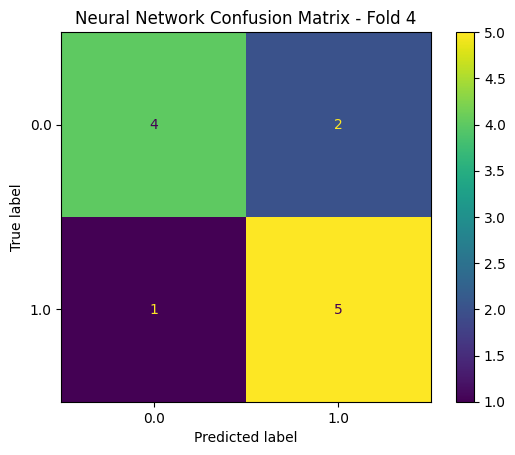

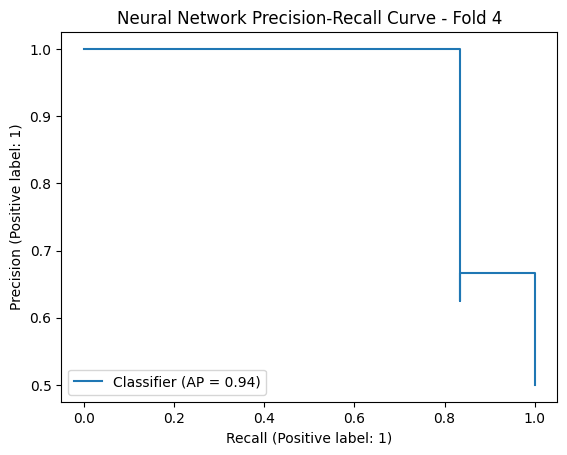

Fold 5 - TRAIN: [ 0  1  2  3  4  5  6  8  9 11 12 13 15 16 17 19 21 23 24 25 26 27 29 30
 31 32 33 34 35 36 37 39 40 41 43 44 45 46 47 48 49 50 52 53 54 55 56 57] TEST: [ 7 10 14 18 20 22 28 38 42 51 58]
Logistic Regression Predictions: [1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0.]


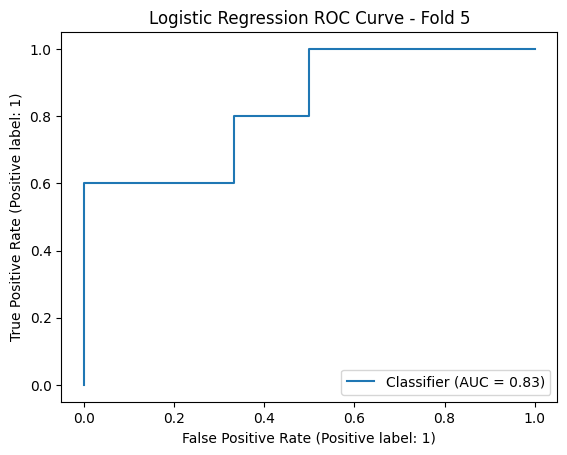

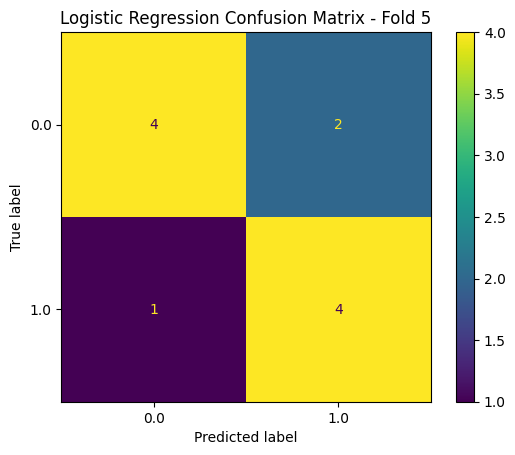

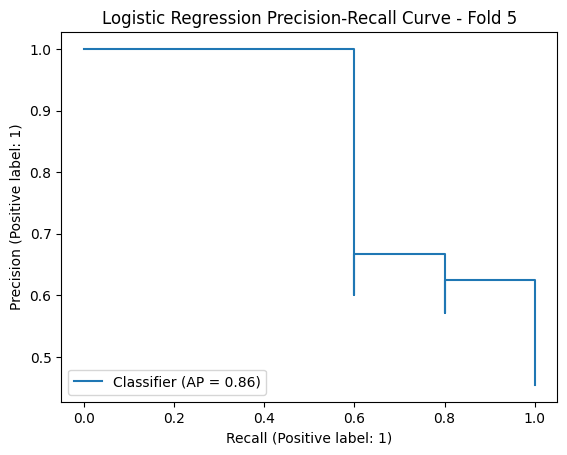

k-NN Predictions: [0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]


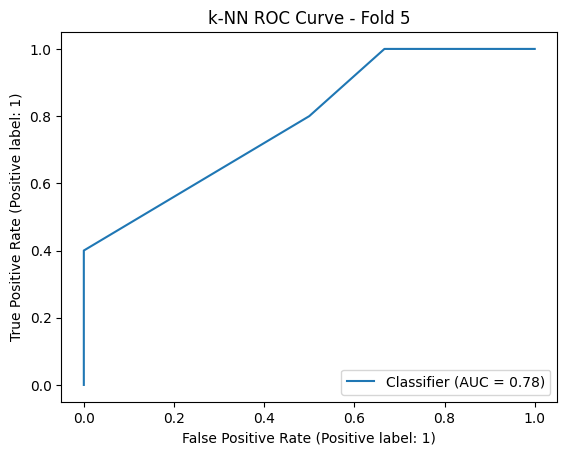

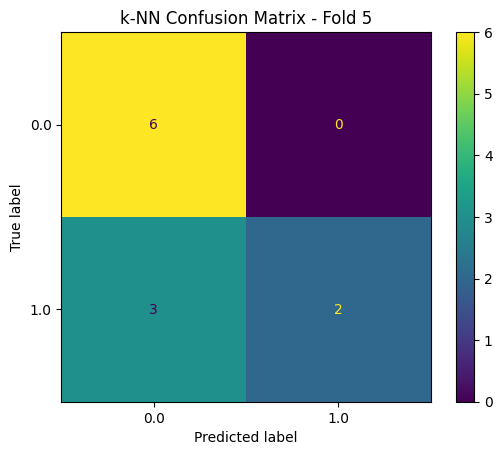

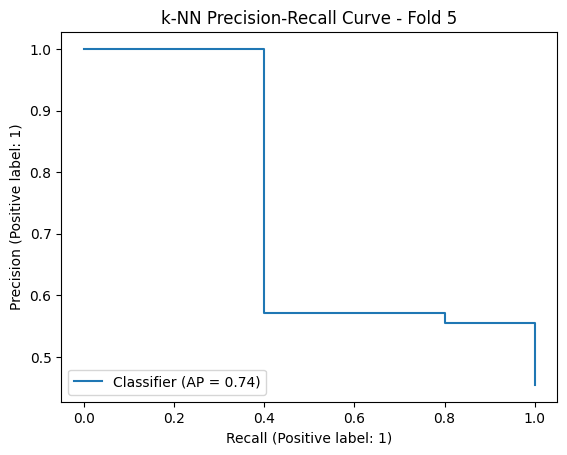

Random Forest Predictions: [0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]


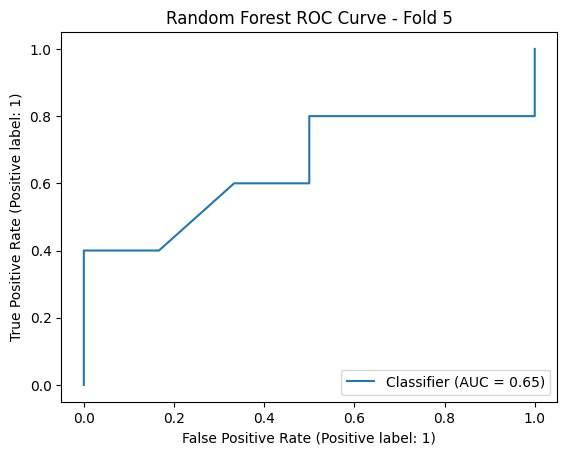

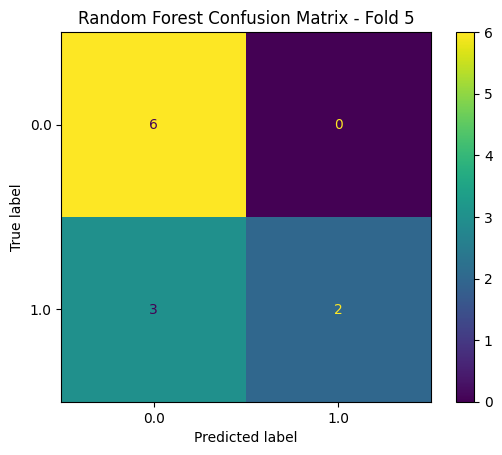

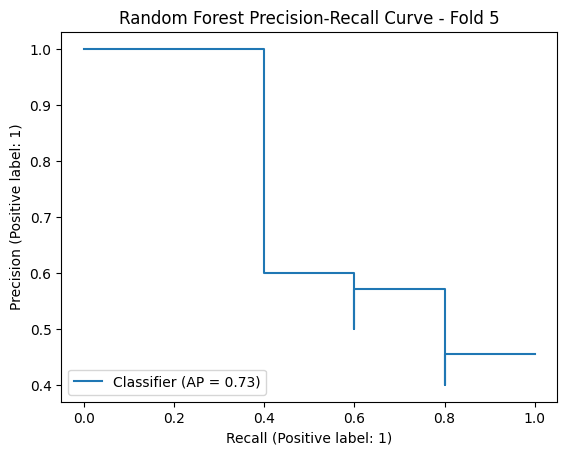

SVM Predictions: [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0.]


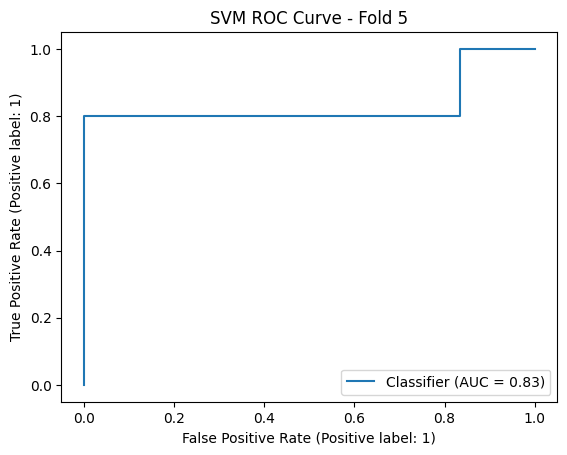

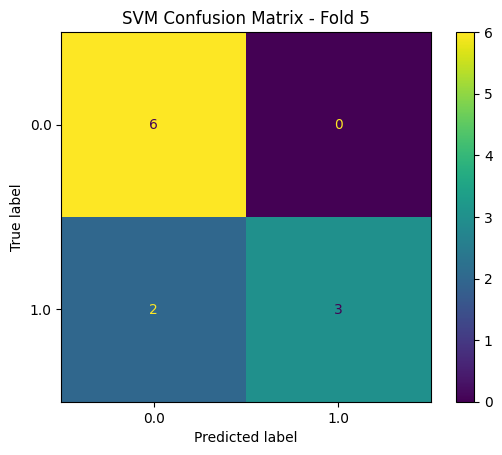

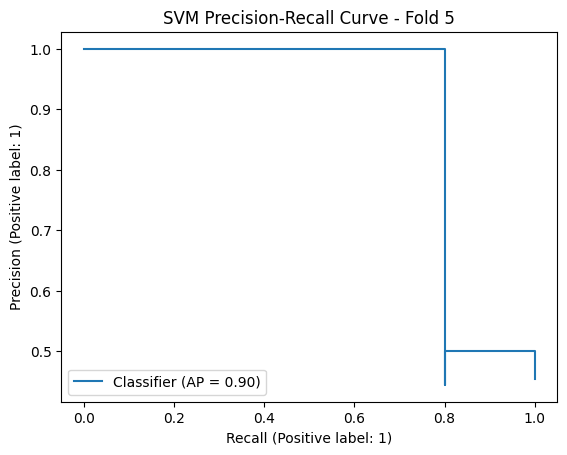

Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5442 - loss: 0.6958    
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8675 - loss: 0.4007
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9733 - loss: 0.2874
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9858 - loss: 0.2239
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9521 - loss: 0.1993
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9684 - loss: 0.1538
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.0000 - loss: 0.1200
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.0000 - loss: 0.0772
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0638
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.0000 - loss: 0.0510
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.0000 - loss: 0.0419
Epoch 12/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.0000 

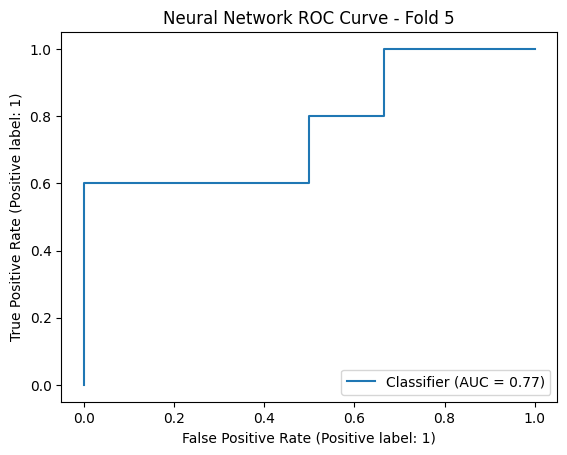

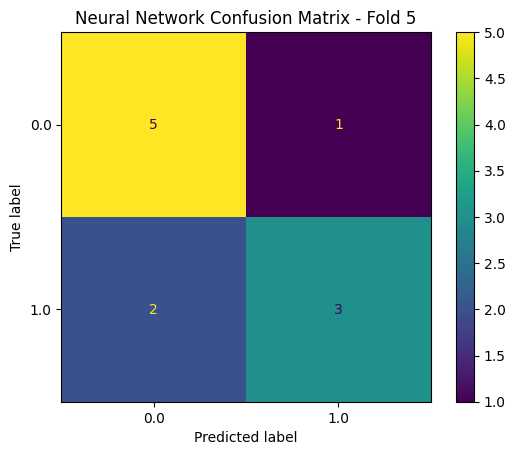

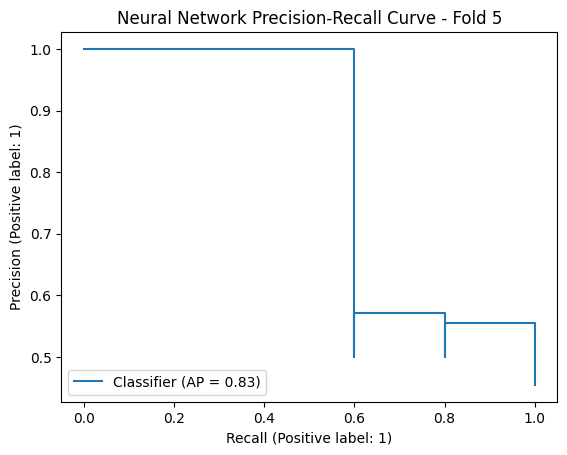


LR Mean train score: 1.0
LR Mean test score: 0.6787878787878787

KNN Mean train score: 0.8178191489361701
KNN Mean test score: 0.7121212121212122

RF train score: 1.0
RF Mean test score: 0.7287878787878789

SVM Mean train score: 0.7414893617021276
SVM Mean test score: 0.7469696969696971

NN Mean train score: 1.0
NN Mean test score: 0.7454545497894287


In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay

# Assuming X and y are already defined with your data
# X = ... (features)
# y = ... (labels)

# Initialize KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize score lists
scores_train_LR, scores_test_LR = [], []
scores_train_KNN, scores_test_KNN = [], []
scores_train_RF, scores_test_RF = [], []
scores_train_SVM, scores_test_SVM = [], []
scores_train_NN, scores_test_NN = [], []

# Perform the cross-validation
for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    print(f"Fold {fold} - TRAIN:", train_index, "TEST:", test_index)
    # Splitting the data
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Standardization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Logistic Regression
    LR = LogisticRegression(random_state=42).fit(X_train, y_train)
    score_tr_LR = LR.score(X_train, y_train)
    score_te_LR = LR.score(X_test, y_test)
    scores_train_LR.append(score_tr_LR)
    scores_test_LR.append(score_te_LR)
    y_pred_LR = LR.predict(X_test)
    print("Logistic Regression Predictions:", y_pred_LR)

    # ROC curve for LR
    y_prob_LR = LR.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for LR
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_LR)
    plt.title(f'Logistic Regression Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for LR
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_LR)
    plt.title(f'Logistic Regression Precision-Recall Curve - Fold {fold}')
    plt.show()

    # KNN
    knn = KNeighborsClassifier().fit(X_train, y_train)
    score_tr_KNN = knn.score(X_train, y_train)
    score_te_KNN = knn.score(X_test, y_test)
    scores_train_KNN.append(score_tr_KNN)
    scores_test_KNN.append(score_te_KNN)
    y_pred_KNN = knn.predict(X_test)
    print("k-NN Predictions:", y_pred_KNN)

    # ROC curve for KNN
    y_prob_KNN = knn.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for KNN
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_KNN)
    plt.title(f'k-NN Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for KNN
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_KNN)
    plt.title(f'k-NN Precision-Recall Curve - Fold {fold}')
    plt.show()

    # Random Forest
    rf = RandomForestClassifier(random_state=42).fit(X_train, y_train)
    score_tr_RF = rf.score(X_train, y_train)
    score_te_RF = rf.score(X_test, y_test)
    scores_train_RF.append(score_tr_RF)
    scores_test_RF.append(score_te_RF)
    y_pred_RF = rf.predict(X_test)
    print("Random Forest Predictions:", y_pred_RF)

    # ROC curve for RF
    y_prob_RF = rf.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for RF
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_RF)
    plt.title(f'Random Forest Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for RF
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_RF)
    plt.title(f'Random Forest Precision-Recall Curve - Fold {fold}')
    plt.show()

    # SVM
    svm = SVC(probability=True, random_state=42, C=0.1, gamma=0.1, kernel='sigmoid').fit(X_train, y_train)
    score_tr_SVM = svm.score(X_train, y_train)
    score_te_SVM = svm.score(X_test, y_test)
    scores_train_SVM.append(score_tr_SVM)
    scores_test_SVM.append(score_te_SVM)
    y_pred_SVM = svm.predict(X_test)
    print("SVM Predictions:", y_pred_SVM)

    # ROC curve for SVM
    y_prob_SVM = svm.predict_proba(X_test)[:, 1]
    RocCurveDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for SVM
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_SVM)
    plt.title(f'SVM Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for SVM
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_SVM)
    plt.title(f'SVM Precision-Recall Curve - Fold {fold}')
    plt.show()

    # Neural Network
    nn_model = Sequential()
    nn_model.add(Input(shape=(X_train.shape[1],)))  # Input layer specifying input shape
    nn_model.add(Dense(64, activation='relu'))
    nn_model.add(Dense(32, activation='relu'))
    nn_model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    # Train the model
    nn_model.fit(X_train, y_train, epochs=50, batch_size=3, verbose=1)

    # Evaluate the model
    score_tr_NN = nn_model.evaluate(X_train, y_train, verbose=0)[1]
    score_te_NN = nn_model.evaluate(X_test, y_test, verbose=0)[1]
    scores_train_NN.append(score_tr_NN)
    scores_test_NN.append(score_te_NN)

    print(f"Neural Network Train Accuracy: {score_tr_NN}")
    print(f"Neural Network Test Accuracy: {score_te_NN}")

    # Predictions for the neural network
    y_prob_NN = nn_model.predict(X_test).flatten()
    y_pred_NN = (y_prob_NN > 0.5).astype(int)

    print("Neural Network Predictions:", y_pred_NN)

    # ROC curve for Neural Network
    RocCurveDisplay.from_predictions(y_test, y_prob_NN)
    plt.title(f'Neural Network ROC Curve - Fold {fold}')
    plt.show()

    # Confusion Matrix for Neural Network
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_NN)
    plt.title(f'Neural Network Confusion Matrix - Fold {fold}')
    plt.show()

    # Precision-Recall curve for Neural Network
    PrecisionRecallDisplay.from_predictions(y_test, y_prob_NN)
    plt.title(f'Neural Network Precision-Recall Curve - Fold {fold}')
    plt.show()

# Printing the mean scores
print()
print("LR Mean train score:", np.mean(scores_train_LR))
print("LR Mean test score:", np.mean(scores_test_LR))
print()
print("KNN Mean train score:", np.mean(scores_train_KNN))
print("KNN Mean test score:", np.mean(scores_test_KNN))
print()
print("RF train score:", np.mean(scores_train_RF))
print("RF Mean test score:", np.mean(scores_test_RF))
print()
print("SVM Mean train score:", np.mean(scores_train_SVM))
print("SVM Mean test score:", np.mean(scores_test_SVM))
print()
print("NN Mean train score:", np.mean(scores_train_NN))
print("NN Mean test score:", np.mean(scores_test_NN))


### Permanova/adonis